# Supervised Learning Classification Project: Credit Card Users Churn Prediction

## Problem Statement

### Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas.

### Objective

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards.

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

## Importing necessary libraries

In [ ]:
# Import libraries for data manipulation
import re
import numpy as np
import pandas as pd

# Import libraries for error handling
import warnings

# Import libraries for data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Import libraries for ML
import sklearn.model_selection as sms
import sklearn.tree as ste
import sklearn.metrics as smt
import sklearn.ensemble as sen
import sklearn.impute as imp
import imblearn.over_sampling as ios
import imblearn.under_sampling as ius
import xgboost as xgb

#Import libraries for statistics
import scipy.stats as stt

In [ ]:
# Apply settings

# Ignore warnings
warnings.filterwarnings('ignore')

# Remove the limit for the displayed columns in a DataFrame
pd.set_option('display.max_columns', None)

# Set precision of floating numbers to 5 decimal points
pd.set_option('display.float_format', lambda x: '%.5f' % x)

## Loading the dataset

In [ ]:
# Read the file
df = pd.read_csv('/content/therabank_churners.csv')

## Data Overview

In [ ]:
# Display the rows and shape of the DataFrame
df

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.00000,777,11914.00000,1.33500,1144,42,1.62500,0.06100
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.00000,864,7392.00000,1.54100,1291,33,3.71400,0.10500
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.00000,0,3418.00000,2.59400,1887,20,2.33300,0.00000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.00000,2517,796.00000,1.40500,1171,20,2.33300,0.76000
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.00000,0,4716.00000,2.17500,816,28,2.50000,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.00000,1851,2152.00000,0.70300,15476,117,0.85700,0.46200
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.00000,2186,2091.00000,0.80400,8764,69,0.68300,0.51100
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.00000,0,5409.00000,0.81900,10291,60,0.81800,0.00000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.00000,0,5281.00000,0.53500,8395,62,0.72200,0.00000


In [ ]:
# Display the summary of the DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [ ]:
# Display how many missing values are present in the dataset
df.isna().sum()

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

In [ ]:
# Display how many duplicate records are present in the dataset
df.duplicated().sum()

0

In [ ]:
# Display how many duplicate customer IDs are present in the dataset
df[df['CLIENTNUM'].duplicated() == True]

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio


In [ ]:
# Display unique values in the dataset
df.nunique()

CLIENTNUM                   10127
Attrition_Flag                  2
Customer_Age                   45
Gender                          2
Dependent_count                 6
Education_Level                 6
Marital_Status                  3
Income_Category                 6
Card_Category                   4
Months_on_book                 44
Total_Relationship_Count        6
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Credit_Limit                 6205
Total_Revolving_Bal          1974
Avg_Open_To_Buy              6813
Total_Amt_Chng_Q4_Q1         1158
Total_Trans_Amt              5033
Total_Trans_Ct                126
Total_Ct_Chng_Q4_Q1           830
Avg_Utilization_Ratio         964
dtype: int64

In [ ]:
# Display the statistical summary of all columns
df.describe(include = 'all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.00000,NaN,NaN,NaN,739177606.33366,36903783.45023,708082083.00000,713036770.50000,717926358.00000,773143533.00000,828343083.00000
Attrition_Flag,10127,2,Existing Customer,8500,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,10127.00000,NaN,NaN,NaN,46.32596,8.01681,26.00000,41.00000,46.00000,52.00000,73.00000
Gender,10127,2,F,5358,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,10127.00000,NaN,NaN,NaN,2.34620,1.29891,0.00000,1.00000,2.00000,3.00000,5.00000
Education_Level,8608,6,Graduate,3128,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,9378,3,Married,4687,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,10127,6,Less than $40K,3561,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,10127,4,Blue,9436,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,10127.00000,NaN,NaN,NaN,35.92841,7.98642,13.00000,31.00000,36.00000,40.00000,56.00000


In [ ]:
# Create a list of variables that will group all categorical columns and numerical columns
cat_cols = ['Attrition_Flag', 'Gender', 'Dependent_count', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']
num_cols = ['Customer_Age', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']

In [ ]:
# Display the count of unique categorical values in each column
for cat_col in cat_cols:
  print(df[cat_col].value_counts(dropna = False))
  print('-' * 50)

Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64
--------------------------------------------------
F    5358
M    4769
Name: Gender, dtype: int64
--------------------------------------------------
3    2732
2    2655
1    1838
4    1574
0     904
5     424
Name: Dependent_count, dtype: int64
--------------------------------------------------
Graduate         3128
High School      2013
NaN              1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64
--------------------------------------------------
Married     4687
Single      3943
NaN          749
Divorced     748
Name: Marital_Status, dtype: int64
--------------------------------------------------
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: Income_Category, dtype: int64
------------------------------------------------

In [ ]:
# Display the percentage of unique categorical values in each column
for cat_col in cat_cols:
  print(df[cat_col].value_counts(normalize = True, dropna = False).mul(100))
  print('-' * 50)

Existing Customer   83.93404
Attrited Customer   16.06596
Name: Attrition_Flag, dtype: float64
--------------------------------------------------
F   52.90807
M   47.09193
Name: Gender, dtype: float64
--------------------------------------------------
3   26.97739
2   26.21704
1   18.14950
4   15.54261
0    8.92663
5    4.18683
Name: Dependent_count, dtype: float64
--------------------------------------------------
Graduate        30.88773
High School     19.87756
NaN             14.99951
Uneducated      14.68352
College         10.00296
Post-Graduate    5.09529
Doctorate        4.45344
Name: Education_Level, dtype: float64
--------------------------------------------------
Married    46.28222
Single     38.93552
NaN         7.39607
Divorced    7.38620
Name: Marital_Status, dtype: float64
--------------------------------------------------
Less than $40K   35.16342
$40K - $60K      17.67552
$80K - $120K     15.15750
$60K - $80K      13.84418
abc              10.98055
$120K +           7

**Observations:**
* The dataset contains 10,127 rows with 21 columns.
* The size of the DataFrame is 1.6 MB.
* The dataset has no duplicate records or duplicate CLIENTNUM.
* There are missing values in the dataset:
  * Education_Level - 1519
  * Marital_Status - 749
* There are 3 data types in the dataset:
  * int64 (10): CLIENTNUM, Customer_Age, Dependent_count, Months_on_book, Total_Relationship_Count, Months_Inactive_12_mon, Contacts_Count_12_mon, Total_Revolving_Bal, Total_Trans_Amt, Total_Trans_Ct
  * object (6): Attrition_Flag, Gender, Education_Level, Marital_Status, Income_Category, Card_Category
  * float64 (5): Credit_Limit, Avg_Open_To_Buy, Total_Amt_Chng_Q4_Q1, Total_Ct_Chng_Q4_Q1, Avg_Utilization_Ratio
* The column Attrition_Flag contains 2 unique values:
  * F - 5,358
  * M - 4,769
* The column Dependent_count contains 6 unique values:
  * 3 - 2,732
  * 2 - 2,655
  * 1 - 1,838
  * 4 - 1,574
  * 0 - 904
  * 5 - 424
* The column Education_Level contains 7 unique values:
  * Graduate - 3,128
  * High School - 2,013
  * NaN - 1,519
  * Uneducated - 1,487
  * College - 1,013
  * Post-Graduate - 516
  * Doctorate - 451
* The column Marital_Status contains 4 unique values:
  * Married - 4,687
  * Single - 3,943
  * NaN - 749
  * Divorced - 748
* The column Marital_Status contains 6 unique values. It also contains values 'abc'. This can be due to error during data entry and will need to be analyzed/ treated.
  * Less than \$40K - 3,561
  * \$40K - \$60K - 1,790
  * \$80K - \$120K - 1,535
  * \$60K - \$80K - 1,402
  * abc - 1,112
  * \$120K + - 727
* The column Card_Category contains 4 unique values:
  * Blue - 9436
  * Silver - 555
  * Gold - 116
  * Platinum - 20

## Exploratory Data Analysis (EDA)

### Function Definition

In [ ]:
# User-defined functions
def show_boxplot_histplot(data, feature, hue = None, figsize = (11.75, 7), kde = True, bins = None):
  '''
  Description: Function to plot a boxplot and a histogram along the same scale
  Parameters:
    data: pandas.core.frame.DataFrame, required
      The DataFrame of the two-dimensional tabular data
    feature: str, required
      Name of the feature column
    hue: str, optional
      To show the hue, default: None
    figsize: tuple, optional
      The figure size in inches, default: (11.75, 7)
    kde: bool, optional
      To show the kernel density estimate, default: True
    bins: int, optional
      The number of bins for histogram, default: None
  '''
  # Creating the 2 subplots
  f2, (ax_box2, ax_hist2) = plt.subplots(
    nrows = 2,
    sharex = True,
    gridspec_kw = {'height_ratios': (0.25, 0.75)},
    figsize = figsize
  )

  # Adjust the subplot layout parameters
  f2.subplots_adjust(hspace = 0.25)

  # Create the boxplot with a star to indicate the mean value of the column
  sns.boxplot(data = data, x = feature, hue = hue, ax = ax_box2, showmeans = True, color = 'violet')

  # Create the histogram
  if bins:
    sns.histplot(data = data, x = feature, hue = hue, kde = kde, ax = ax_hist2, ins = bins, palette = 'winter')
  else:
    sns.histplot(data = data, x = feature, hue = hue, kde = kde, ax = ax_hist2)

  # Add mean to the histogram
  ax_hist2.axvline(data[feature].mean(), color = 'green', linestyle = '--')

  # Add median to the histogram
  ax_hist2.axvline(data[feature].median(), color = 'black', linestyle = '-')

  # Set title
  ax_box2.set_title(('Boxplot of ' + feature), fontsize = 11)
  ax_hist2.set_title(('Distribution of ' + feature), fontsize = 11)

def show_countplot(data, feature, hue = None, n = None, ascending = False, figsize = (11.75, 5)):
  '''
  Description: Function to plot a barplot with labeled percentage or count
  Parameters:
    data: pandas.core.frame.DataFrame, required
      The DataFrame of the two-dimensional tabular data
    feature: str, required
      Name of the feature column
    hue: str, optional
      To show the hue, default: None
    n: int, optional
      To show the top n category levels, default: None (display all levels)
    ascending: bool, optional
      To sort the bar by count, default: False
    figsize: tuple, optional
      The figure size in inches, default: (11.75, 5)
  '''
  total = len(data[feature])
  count = data[feature].nunique()
  order = data[feature].value_counts().index.tolist()[:n]

  if ascending == True:
    order.reverse()

  plt.figure(figsize = figsize)
  plt.xticks(rotation = 90)
  plt.xlim(0, data[feature].value_counts().tolist()[0] * 1.5)

  if hue == None:
    hue = feature

  ax = sns.countplot(data = data, y = feature, hue = hue, palette = 'Paired', order = order, legend = False)

  ax.set_title('Number of ' + feature, fontsize = 11)

  for patch in ax.patches:
    x = patch.get_x() + patch.get_width()
    y = patch.get_y() + patch.get_height() / 1.75
    cnt = ('{:.0f}').format(patch.get_width())
    pct = ('{:.2f}%').format(100 * patch.get_width() / len(df))

    ax.annotate(cnt + ' (' + pct + ')', (x, y), ha = 'left', va = 'center', xytext = (0, 2.5), textcoords = 'offset points')

  plt.show()

def get_outliers(data, feature):
  '''
  Description: Function that will return the outliers from a DataFrame
  Parameters:
    data: pandas.core.frame.DataFrame, required
      The DataFrame of the two-dimensional tabular data
    feature: str, required
      Name of the feature column
  '''
  q1 = data[feature].quantile(0.25)
  q3 = data[feature].quantile(0.75)

  iqr = q3 - q1

  data = data[((data[feature] < (q1 - 1.5 * iqr)) | (data[feature] > (q3 + 1.5 * iqr)))]

  return data

def show_pairplot(data, diag_kind = 'kde', size = 2, hue = None):
  '''
  Description: Function to plot a barplot with labeled percentage or count
  Parameters:
    data: pandas.core.frame.DataFrame, required
      The DataFrame of the two-dimensional tabular data
    diag_kind: str, optional
      The type of pairplot diagram, default: kde
    size: int, optional
      The plot size in inches, default: 2
    hue: str, optional
      To show the hue, default: None
  '''
  if hue:
    ax = sns.pairplot(data = data, diag_kind = 'kde', size = size, hue = hue)
    ax.fig.suptitle('Relationship of Numerical Variables with regards to ' + hue, y = 1.005, size = 11)
  else:
    ax = sns.pairplot(data = data, diag_kind = 'kde', size = size)
    ax.fig.suptitle('Relationship of Numerical Variables', y = 1.005, size = 11)

  plt.show()

def show_heatmap(data, figsize = (12, 9), cmap = 'Spectral', annot = True, vmin = -1, vmax = 1, fmt = '.2f'):
  '''
  Description: Function to plot a barplot with labeled percentage or count
  Parameters:
    data: pandas.core.frame.DataFrame, required
      The DataFrame of the two-dimensional tabular data
    figsize: tuple, optional
      The figure size in inches, default: (12, 9)
    cmap: str, optional
      To color map name, default: Spectral
    vmin: float, optional
      The minimum value to anchor the color map, default: -1
    vmax: float, optional
      The maximum value to anchor the color map, default: 1
    fmt: str, optional
      The formatting used in the annotation, default: .2f
  '''
  plt.figure(figsize = figsize)

  ax = sns.heatmap(data.corr(), annot = annot, vmin = vmin, vmax = vmax, fmt = fmt, cmap = cmap)

  ax.set_title('Correlation of Numerical Variables', fontsize = 11)

  plt.show()

def show_distplot_boxplot(data, feature, target, figsize = (10, 7)):
  '''
  Description: Function to plot a histogram and a boxplot with hue along the same scale
  Parameters:
    data: pandas.core.frame.DataFrame, required
      The DataFrame of the two-dimensional tabular data
    feature: str, required
      Name of the feature column
    target: str, required
      To show the diagrams based on the target's value
    figsize: tuple, optional
      The figure size in inches, default: (10, 7)
  '''
  fig, axs = plt.subplots(2, 2, figsize = figsize)

  target_uniq = data[target].unique()

  axs[0, 0].set_title('Distribution of ' + feature + ' for ' + target + ' = ' + str(target_uniq[0]), fontsize = 11)
  sns.histplot(data = data[data[target] == target_uniq[0]],x = feature, kde = True, ax = axs[0, 0], color = 'teal', stat = 'density')

  axs[0, 1].set_title('Distribution of ' + feature + ' for ' + target + ' = ' + str(target_uniq[1]), fontsize = 11)
  sns.histplot(data = data[data[target] == target_uniq[1]], x = feature, kde = True, ax = axs[0, 1], color = 'orange', stat = 'density')

  axs[1, 0].set_title('Boxplot of ' + feature + ' w/ regards to ' + target, fontsize = 11)
  sns.boxplot(data = data, x = target, y = feature, hue = target, ax = axs[1, 0], palette = 'gist_rainbow', legend = False)

  axs[1, 1].set_title('Boxplot (w/o outliers) of ' + feature + ' w/ regards to ' + target, fontsize = 11)
  sns.boxplot(data = data, x = target, y = feature, hue = target, ax = axs[1, 1], showfliers = False, palette = 'gist_rainbow', legend = False)

  plt.tight_layout()
  plt.show()

def show_stackedbarplot(data, feature, target, figsize = (5, 3)):
  '''
  Description: Function to plot a stacked barplot with hue within the same bar
  Parameters:
    data: pandas.core.frame.DataFrame, required
      The DataFrame of the two-dimensional tabular data
    feature: str, required
      Name of the feature column
    target: str, required
      To display the hue within the same plot using the target's value
    figsize: tuple, optional
      The figure size in inches, default: (5, 3)
  '''
  count = data[feature].nunique()
  sorter = data[target].value_counts().index[-1]
  tab1 = pd.crosstab(data[feature], data[target], margins = True)

  display(tab1)

  tab2 = pd.crosstab(data[feature], data[target], normalize = 'index').sort_values(by = sorter, ascending = False)
  ax = tab2.plot(kind = 'bar', stacked = True, figsize = figsize)
  ax.set_title('Stacked Barplot of ' + feature + ' w/ regards to ' + target, fontsize = 11)

  plt.legend(loc = 'lower left', frameon = False)
  plt.legend(loc = 'upper left', bbox_to_anchor = (1, 1))
  plt.show()

def show_pointplot(data, feature, category, target, estimator = 'mean', figsize = (5, 3)):
  '''
  Description: Function to plot a pointlot with category variable and hue
  Parameters:
    data: pandas.core.frame.DataFrame, required
      The DataFrame of the two-dimensional tabular data
    feature: str, required
      Name of the feature column
    category: str, required
      Name of the categorical column
    target: str, required
      To display the hue within the same plot using the target's value
    estimator: str, required
      The calculated cetral tendency of the feature , default: mean
    figsize: tuple, optional
      The figure size in inches, default: (5, 3)
  '''
  plt.figure(figsize = figsize)

  ax = sns.pointplot(data = data, y = feature, x = category, hue = target, estimator = estimator)
  ax.set_title('Pointplot of ' + feature + ' per ' + category + ' w/ regards to ' + target, fontsize = 11)

  plt.show()

def show_significance(data, target, significance_level = 0.05):
  '''
  Description: Function to significance of each feature variables vs target variable
  Parameters:
    data: pandas.core.frame.DataFrame, required
      The DataFrame of the two-dimensional tabular data
    target: str, required
      To display the hue within the same plot using the target's value
    significance_level: float, optional
      The significance level where the p_value will be compared with, default: 0.05
  '''
  for feature in list(data.columns):
    if target != feature:
      crosstab = pd.crosstab(data[target], data[feature])

      chi, p_value, dof, expected = stt.chi2_contingency(crosstab)

      if p_value < significance_level:
        print('*', feature, 'score has an effect on', target, 'as the p_value', p_value.round(3), '< significance_level', significance_level)
      else:
        print(' ', feature, 'score has no effect on', target, 'as the p_value', p_value.round(3), '>= significance_level', significance_level)

### Univariate Analysis

##### Observations on Attrition_Flag:

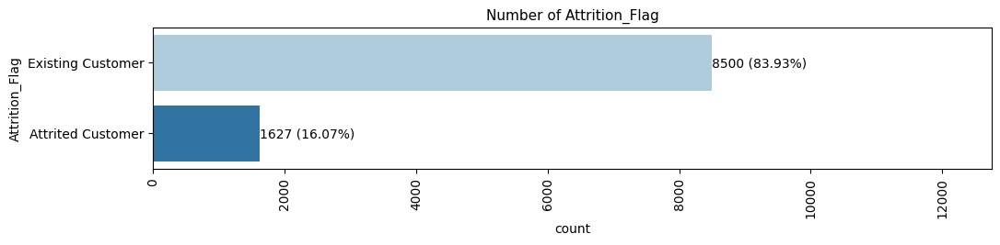

In [ ]:
# Display the number of customers with regards to Attrition_Flag
show_countplot(data = df, feature = 'Attrition_Flag', figsize = (11.75, 2))

**Observations:**
* Attrition_Flag shows a higher number of customers that are existing (with 8,500) compared to customers that have attrited (with 1,627).

##### Observations on Gender:

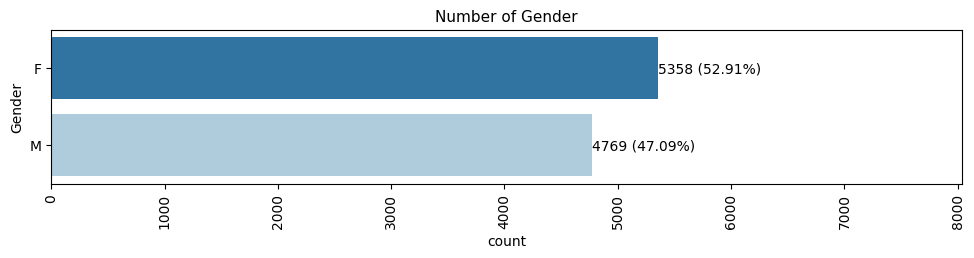

In [ ]:
# Display the number of customers with regards to Gender
show_countplot(data = df, feature = 'Gender', figsize = (11.75, 2))

**Observations:**
* Gender shows a higher number of customers have female gender (with 5,358) compared to customers that have male gender (with 4,769).

##### Observations on Dependent_count:

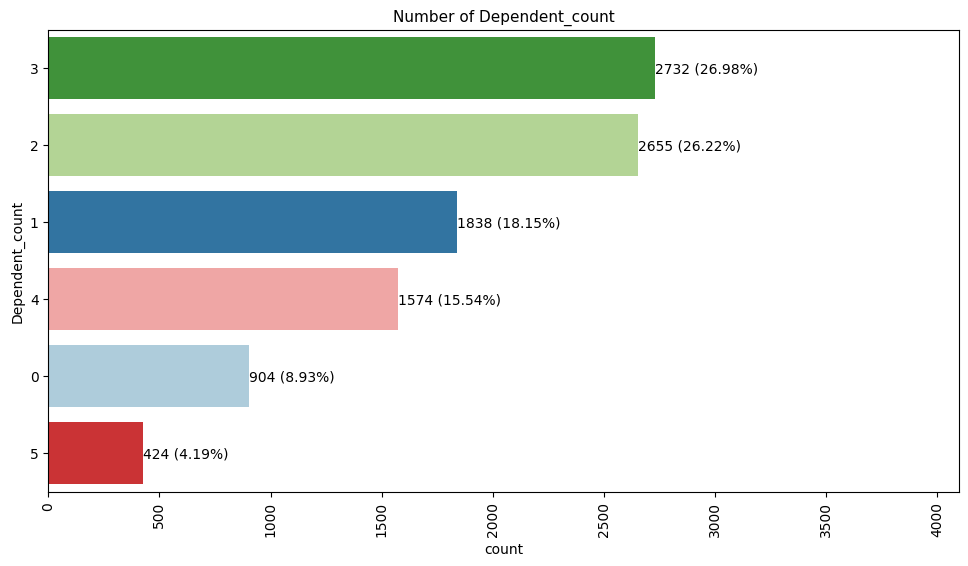

In [ ]:
# Display the number of customers with regards to Dependent_count
show_countplot(data = df, feature = 'Dependent_count', figsize = (11.75, 6))

**Observations:**
* Dependent_count shows a higher number of customers have dependent count of 3 (with 2,732). List is followed by:
  * Dependent count of 2 (with 2,655)
  * Dependent count of 1 (with 1,838)
  * Dependent count of 4 (with 1,574)
  * Dependent count of 0 (with 904)
  * Dependent count of 5 (with 424)


##### Observations on Education_Level:

In [ ]:
# Replace missing values in Education_Level with Unknown
df['Education_Level'].replace(np.nan, 'Unknown', inplace = True)

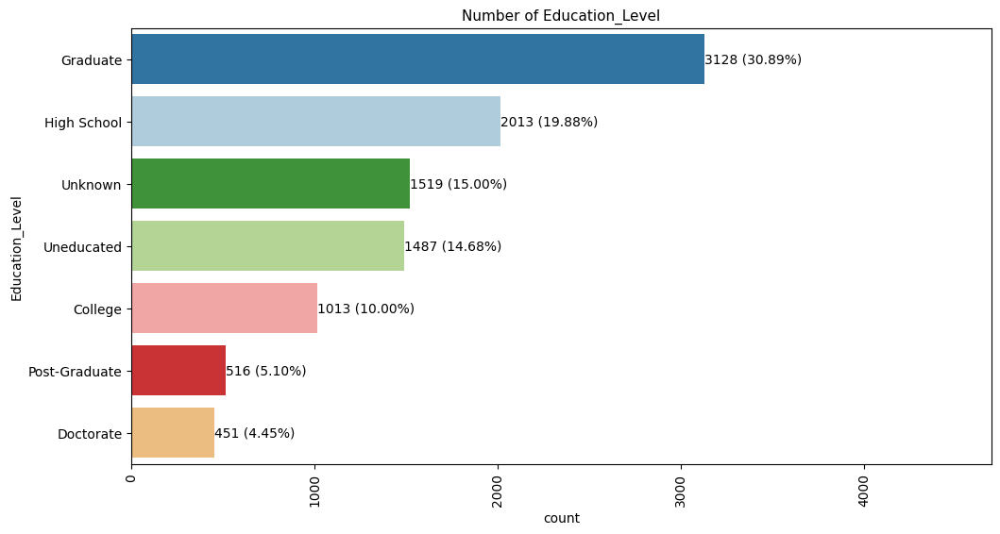

In [ ]:
# Display the number of customers with regards to Education_Level
show_countplot(data = df, feature = 'Education_Level', figsize = (11.75, 6))

**Observations:**
* Education_Level shows a higher number of customers have education level Graduate (with 3,128). List is followed by:
  * Education level High School (with 2,013)
  * Unknown (with 1,519)
  * Education level Uneducated (with 1,487)
  * Education level College (with 1,013)
  * Education level Post-Graduate (with 516)
  * Education level Doctorate (with 451)

##### Observations on Marital_Status:

In [ ]:
# Replace missing values in Marital_Status with Unknown
df['Marital_Status'].replace(np.nan, 'Unknown', inplace = True)

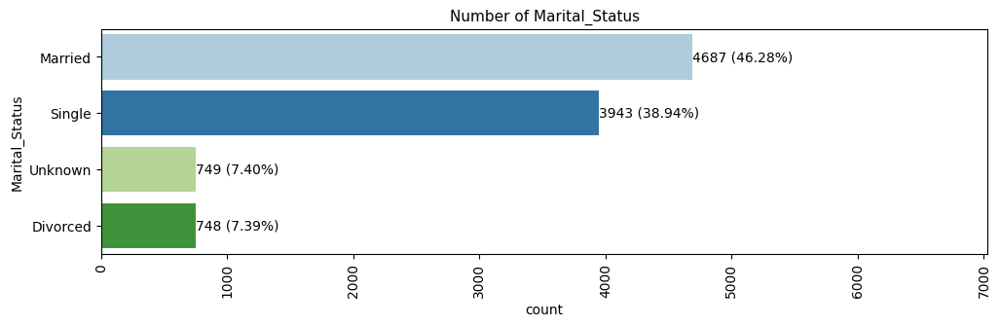

In [ ]:
# Display the number of customers with regards to Marital_Status
show_countplot(data = df, feature = 'Marital_Status', figsize = (11.75, 3))

**Observations:**
* Marital_Status shows a higher number of customers have marital status Married (with 4,687). List is followed by:
  * Marital status Single (with 3,943)
  * Unknown (with 749)
  * Marital status Divorced (with 748)

##### Observations on Income_Category:

In [ ]:
# Replace missing values in Income_Category with Unknown
df['Income_Category'].replace('abc', 'Unknown', inplace = True)

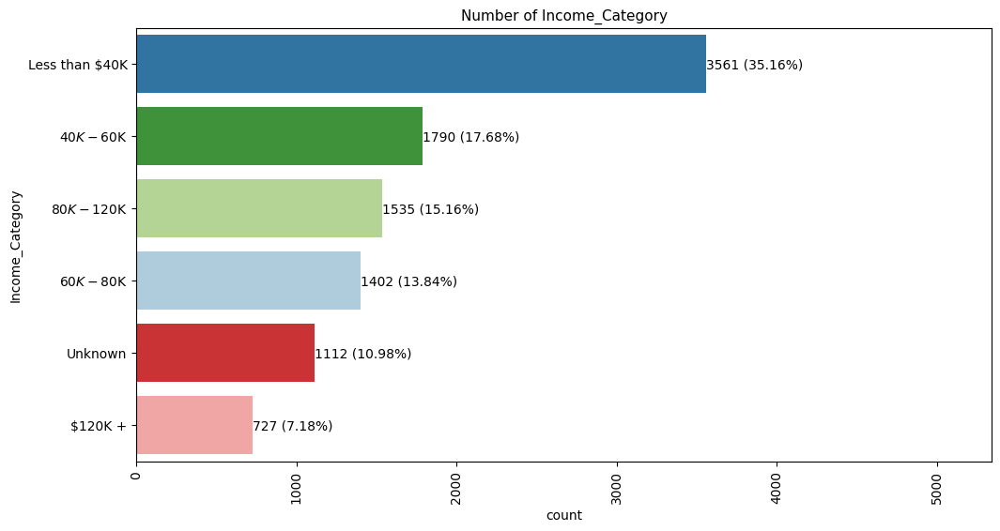

In [ ]:
# Display the number of customers with regards to Income_Category
show_countplot(data = df, feature = 'Income_Category', figsize = (11.75, 6))

**Observations:**
* Income_Category shows a higher number of customers have income category Less than \$40K (with 3,561). List is followed by:
  * Income category \$40K - \$60K (with 1,790)
  * Income category \$80K - \$120K (with 1,535)
  * Income category \$60K - \$80K (with 1,402)
  * Unknown (with 1,112)
  * Income category \$120K + (with 727)


##### Observations on Card_Category:

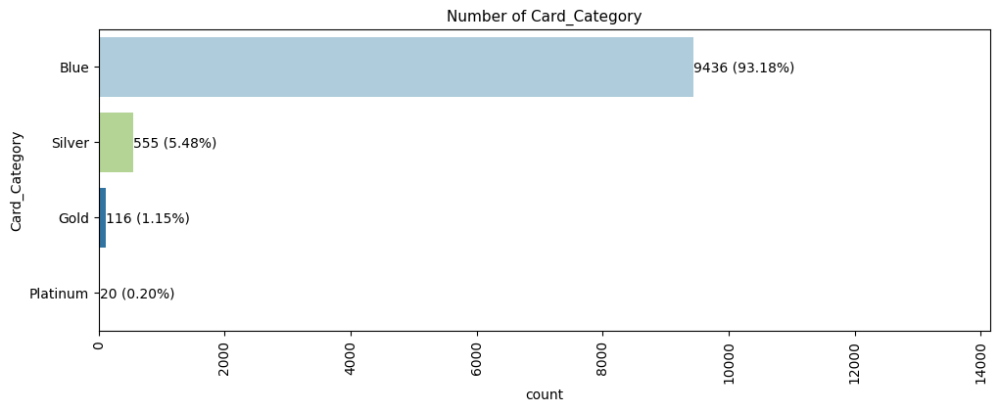

In [ ]:
# Display the number of customers with regards to Card_Category
show_countplot(data = df, feature = 'Card_Category', figsize = (11.75, 4))

**Observations:**
* Card_Category shows a higher number of customers have card category Blue (with 9,436). List is followed by:
  * Card category Silver (with 555)
  * Card category Gold (with 116)
  * Card category Platinum (with 20)


##### Observations on Customer_Age:

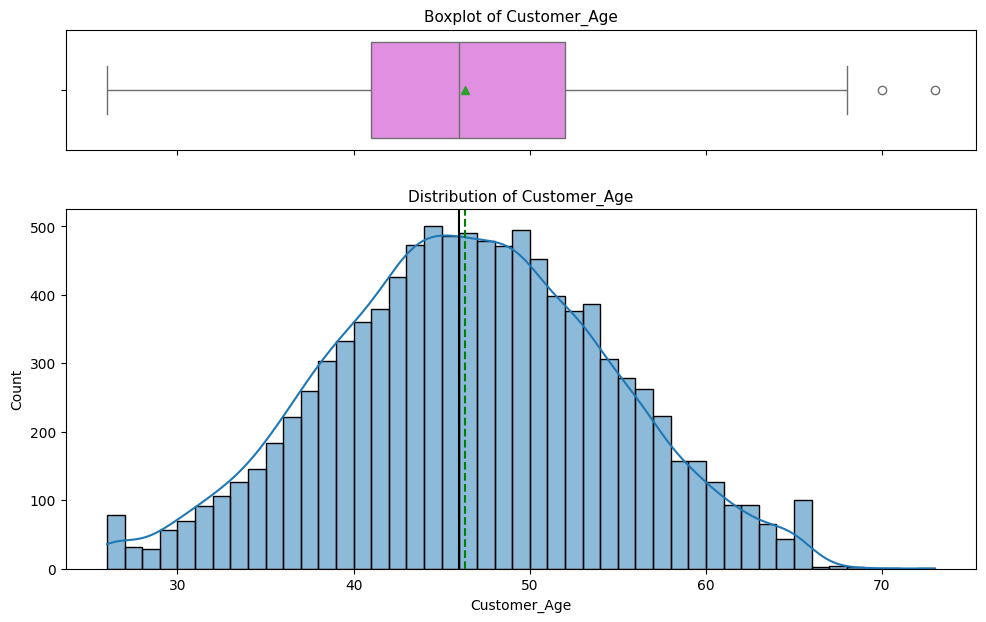

In [ ]:
# Display the distribution of customers with regards to Customer_Age
show_boxplot_histplot(data = df, feature = 'Customer_Age')

In [ ]:
# Create a dataset of outliers for Customer_Age
df_age_outliers = get_outliers(data = df, feature = 'Customer_Age')

df_age_outliers

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
251,715952883,Existing Customer,73,M,0,High School,Married,$40K - $60K,Blue,36,5,3,2,4469.00000,1125,3344.00000,1.36300,1765,34,1.61500,0.25200
254,787348608,Existing Customer,70,M,0,High School,Married,Less than $40K,Blue,56,3,2,3,3252.00000,1495,1757.00000,0.58100,1227,15,0.87500,0.46000


**Observations:**
* Customer_Age does have a slightly sharp bell curve and follows normal distribution.
* There are 2 outliers present in this column.
* The mean value is near the median.
* The mean and median age is close to 46 years old.

##### Observations on Months_on_book:

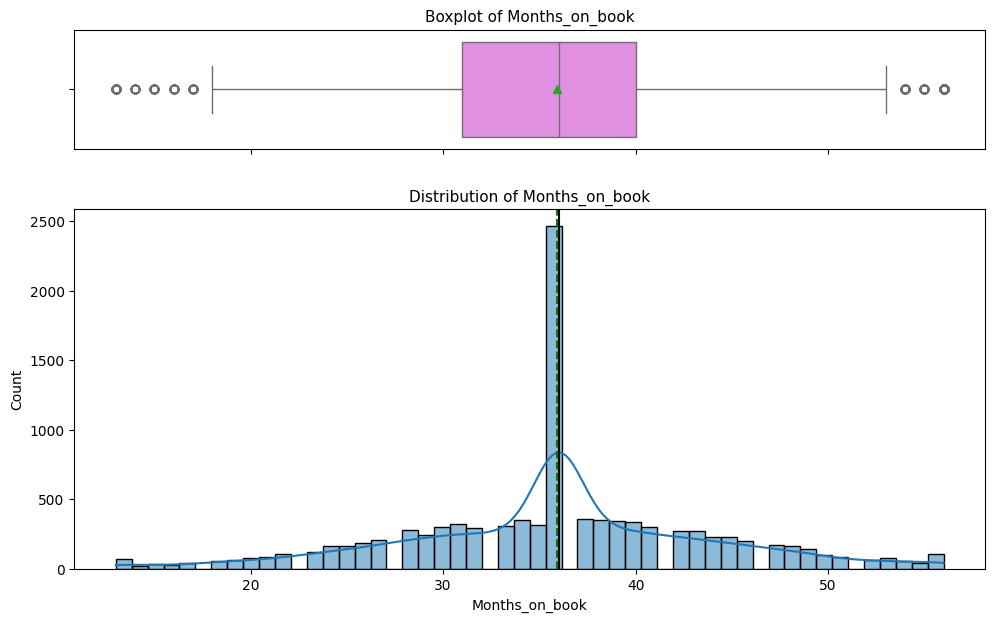

In [ ]:
# Display the distribution of customers with regards to Months_on_book
show_boxplot_histplot(data = df, feature = 'Months_on_book')

In [ ]:
# Create a dataset of outliers for Months_on_book
df_mob_outliers = get_outliers(data = df, feature = 'Months_on_book')

df_mob_outliers

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
11,710821833,Existing Customer,65,M,1,Unknown,Married,$40K - $60K,Blue,54,6,2,3,9095.00000,1587,7508.00000,1.43300,1314,26,1.36400,0.17400
18,806160108,Existing Customer,61,M,1,High School,Married,$40K - $60K,Blue,56,2,2,3,3193.00000,2517,676.00000,1.83100,1336,30,1.14300,0.78800
27,804424383,Existing Customer,63,M,1,Unknown,Married,$60K - $80K,Blue,56,3,3,2,10215.00000,1010,9205.00000,0.84300,1904,40,1.00000,0.09900
39,708300483,Attrited Customer,66,F,0,Doctorate,Married,Unknown,Blue,56,5,4,3,7882.00000,605,7277.00000,1.05200,704,16,0.14300,0.07700
52,711525033,Existing Customer,66,F,0,High School,Married,Less than $40K,Blue,54,3,4,2,3171.00000,2179,992.00000,1.22400,1946,38,1.92300,0.68700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10054,779134458,Attrited Customer,33,F,1,Doctorate,Single,Less than $40K,Blue,15,1,1,3,3709.00000,1180,2529.00000,0.64500,8130,74,0.89700,0.31800
10062,721210158,Existing Customer,29,M,2,College,Married,$40K - $60K,Blue,17,3,1,3,4626.00000,1232,3394.00000,0.73100,14740,102,0.75900,0.26600
10069,817035108,Existing Customer,31,M,2,Graduate,Single,Less than $40K,Blue,14,4,3,3,6933.00000,1870,5063.00000,0.65600,15585,115,0.91700,0.27000
10107,713924283,Attrited Customer,61,M,0,Graduate,Single,$60K - $80K,Blue,54,2,1,4,11859.00000,1644,10215.00000,0.86600,8930,79,0.83700,0.13900


**Observations:**
* Months_on_book does have a sharp bell curve and slightly follows a normal distribution.
* There are 386 outliers present in this column.
* The mean value is near the median.
* The mean and median months on book is close to 36 months.

##### Observations on Total_Relationship_Count:

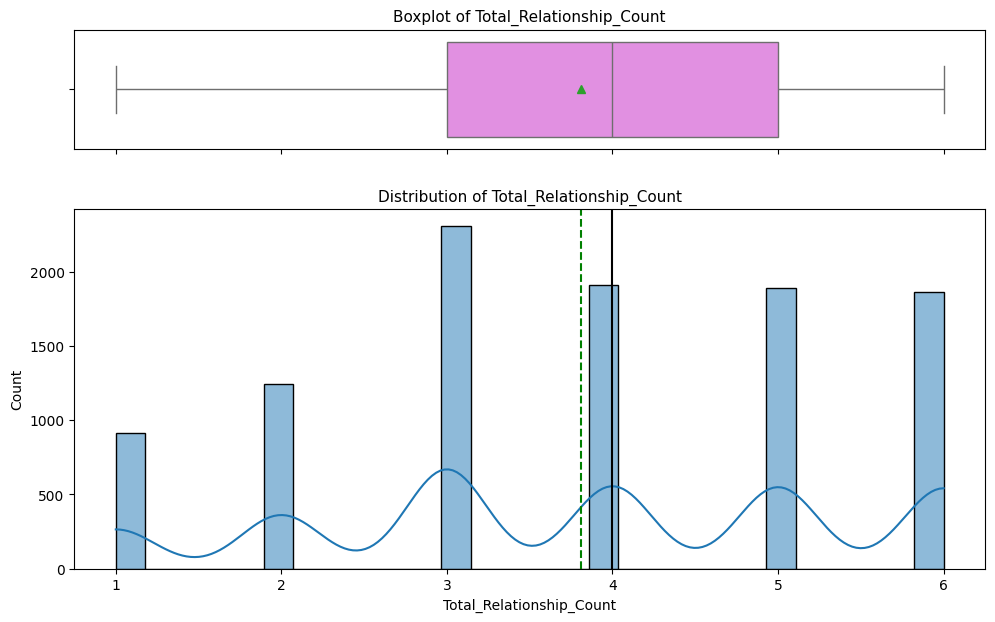

In [ ]:
# Display the distribution of customers with regards to Total_Relationship_Count
show_boxplot_histplot(data = df, feature = 'Total_Relationship_Count')

**Observations:**
* Total_Relationship_Count follows a binomial and multimodal distributions.
* There are no outliers present in this column.
* The mean value is around 3.8 counts.
* The median value is 4 counts.

##### Observations on Months_Inactive_12_mon:

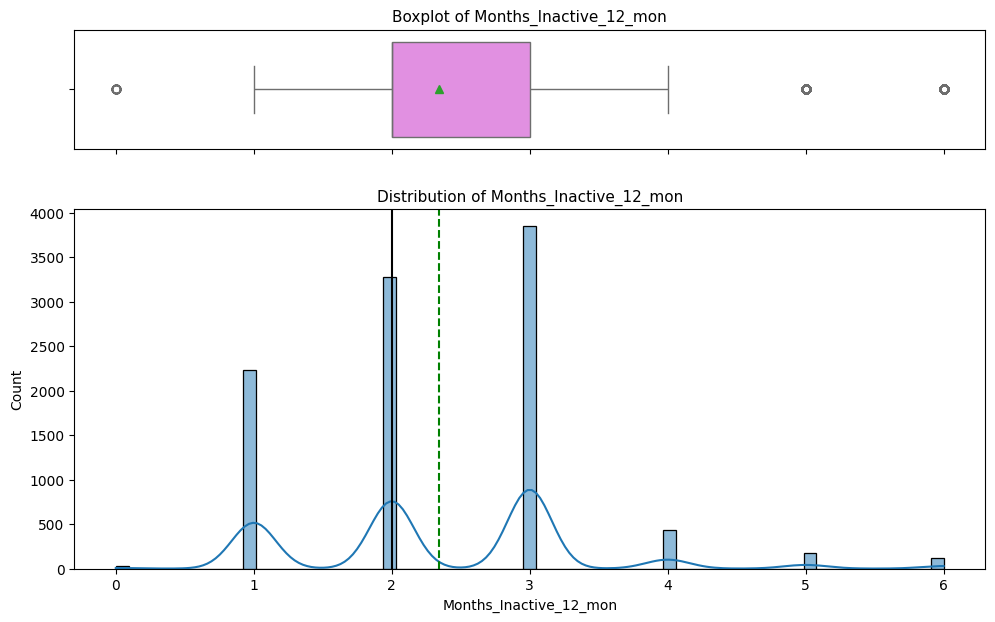

In [ ]:
# Display the distribution of customers with regards to Months_Inactive_12_mon
show_boxplot_histplot(data = df, feature = 'Months_Inactive_12_mon')

In [ ]:
# Create a dataset of outliers for Months_Inactive_12_mon
df_mi12m_outliers = get_outliers(data = df, feature = 'Months_Inactive_12_mon')

df_mi12m_outliers

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
12,710599683,Existing Customer,56,M,1,College,Single,$80K - $120K,Blue,36,3,6,0,11751.00000,0,11751.00000,3.39700,1539,17,3.25000,0.00000
29,806624208,Existing Customer,47,M,4,High School,Married,$40K - $60K,Blue,42,6,0,0,4785.00000,1362,3423.00000,0.73900,1045,38,0.90000,0.28500
31,712991808,Existing Customer,53,M,2,Uneducated,Married,$60K - $80K,Blue,48,2,5,1,2451.00000,1690,761.00000,1.32300,1596,26,1.60000,0.69000
108,808284783,Existing Customer,62,F,1,Unknown,Married,Less than $40K,Blue,56,6,0,0,1438.30000,0,1438.30000,0.81300,1951,44,1.09500,0.00000
118,721074183,Existing Customer,49,M,1,Doctorate,Married,$60K - $80K,Blue,36,4,6,3,24159.00000,1196,22963.00000,0.71200,1111,24,1.00000,0.05000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9964,718140783,Existing Customer,47,M,4,Unknown,Married,$60K - $80K,Blue,36,4,5,2,10585.00000,1749,8836.00000,0.65500,18484,108,0.58800,0.16500
10028,778428108,Existing Customer,36,F,1,Graduate,Single,Less than $40K,Blue,16,6,5,3,6091.00000,1184,4907.00000,0.76600,17437,113,0.76600,0.19400
10035,818712633,Existing Customer,41,F,3,Graduate,Single,Less than $40K,Blue,36,4,6,2,4133.00000,1067,3066.00000,0.63200,16100,119,0.60800,0.25800
10049,715713408,Existing Customer,55,M,2,Graduate,Married,Less than $40K,Gold,46,3,5,3,15987.00000,0,15987.00000,0.82000,15853,117,0.56000,0.00000


**Observations:**
* Months_Inactive_12_mon follows a binomial and multimodal distributions.
* There are 331 outliers present in this column.
* The mean value is around 2.3 months.
* The median value is 2 months.


##### Observations on Contacts_Count_12_mon:

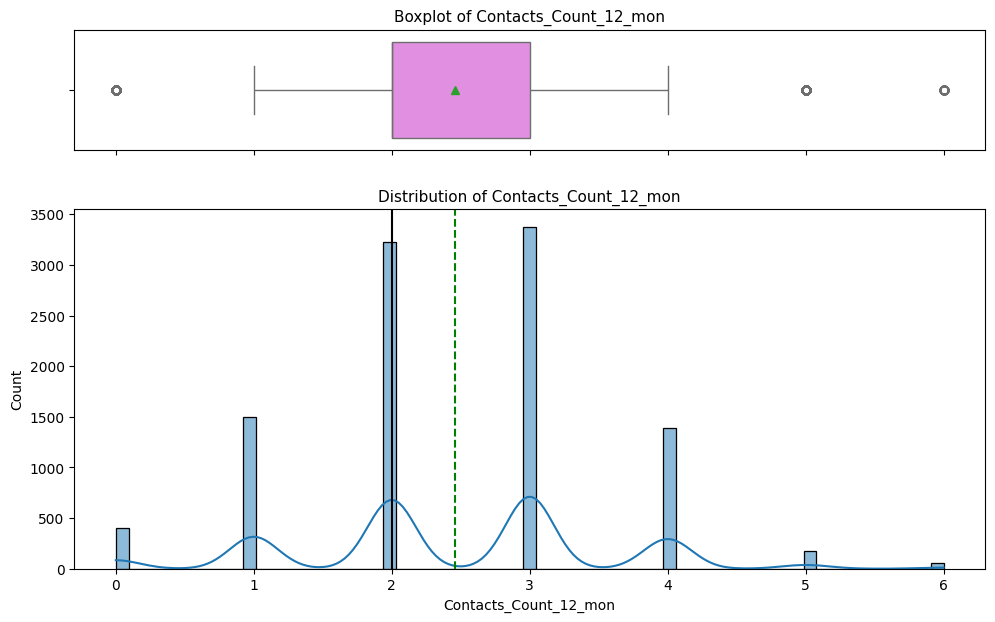

In [ ]:
# Display the distribution of customers with regards to Contacts_Count_12_mon
show_boxplot_histplot(data = df, feature = 'Contacts_Count_12_mon')

In [ ]:
# Create a dataset of outliers for Contacts_Count_12_mon
df_cc12m_outliers = get_outliers(data = df, feature = 'Contacts_Count_12_mon')

df_cc12m_outliers

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.00000,0,3418.00000,2.59400,1887,20,2.33300,0.00000
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.00000,0,4716.00000,2.17500,816,28,2.50000,0.00000
8,710930508,Existing Customer,37,M,3,Uneducated,Single,$60K - $80K,Blue,36,5,2,0,22352.00000,2517,19835.00000,3.35500,1350,24,1.18200,0.11300
12,710599683,Existing Customer,56,M,1,College,Single,$80K - $120K,Blue,36,3,6,0,11751.00000,0,11751.00000,3.39700,1539,17,3.25000,0.00000
20,806165208,Existing Customer,47,M,1,Doctorate,Divorced,$60K - $80K,Blue,42,5,2,0,20979.00000,1800,19179.00000,0.90600,1178,27,0.92900,0.08600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10101,718372458,Existing Customer,42,M,2,Graduate,Unknown,$40K - $60K,Blue,30,3,2,5,3735.00000,1723,2012.00000,0.59500,14501,92,0.84000,0.46100
10106,717494358,Existing Customer,58,F,0,Graduate,Single,Less than $40K,Blue,48,2,2,5,4299.00000,1334,2965.00000,0.66000,15068,123,0.68500,0.31000
10109,780613758,Existing Customer,47,M,5,High School,Single,Less than $40K,Blue,35,4,3,5,4165.00000,0,4165.00000,0.81300,17093,111,0.82000,0.00000
10114,720841533,Existing Customer,29,M,0,Graduate,Married,Less than $40K,Blue,15,3,1,5,4700.00000,0,4700.00000,0.61700,14723,96,0.65500,0.00000


**Observations:**
* Contacts_Count_12_mon follows a binomial and multimodal distributions.
* There are 629 outliers present in this column.
* The mean value is around 2.4 months.
* The median value is 2 months.


##### Observations on Credit_Limit:

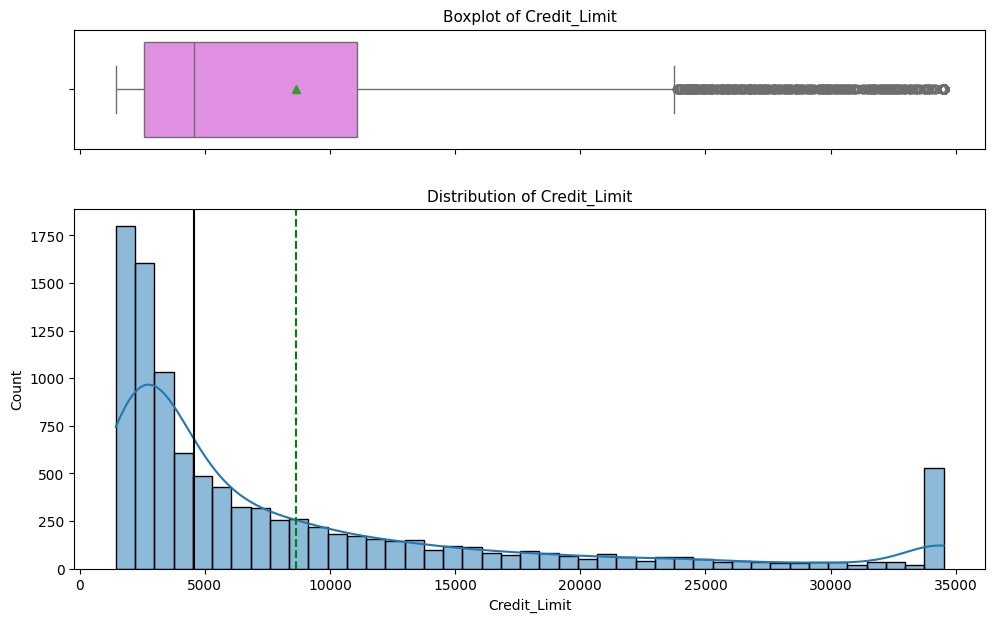

In [ ]:
# Display the distribution of customers with regards to Credit_Limit
show_boxplot_histplot(data = df, feature = 'Credit_Limit')

In [ ]:
# Create a dataset of outliers for Credit_Limit
df_clim_outliers = get_outliers(data = df, feature = 'Credit_Limit')

df_clim_outliers

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
6,810347208,Existing Customer,51,M,4,Unknown,Married,$120K +,Gold,46,6,1,3,34516.00000,2264,32252.00000,1.97500,1330,31,0.72200,0.06600
7,818906208,Existing Customer,32,M,0,High School,Unknown,$60K - $80K,Silver,27,2,2,2,29081.00000,1396,27685.00000,2.20400,1538,36,0.71400,0.04800
16,709967358,Existing Customer,48,M,4,Post-Graduate,Single,$80K - $120K,Blue,36,6,2,3,30367.00000,2362,28005.00000,1.70800,1671,27,0.92900,0.07800
40,827111283,Existing Customer,45,M,3,Graduate,Single,$80K - $120K,Blue,41,2,2,2,32426.00000,578,31848.00000,1.04200,1109,28,0.47400,0.01800
45,712661433,Existing Customer,49,M,4,Uneducated,Single,$80K - $120K,Blue,30,3,2,3,34516.00000,0,34516.00000,1.62100,1444,28,1.33300,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10098,716644008,Attrited Customer,55,M,3,Graduate,Single,$120K +,Silver,36,4,3,4,34516.00000,0,34516.00000,1.00700,9931,70,0.75000,0.00000
10100,719848008,Existing Customer,39,M,2,Graduate,Unknown,$60K - $80K,Silver,36,4,2,2,29808.00000,0,29808.00000,0.66900,16098,128,0.68400,0.00000
10104,715474083,Existing Customer,51,M,3,Graduate,Single,$60K - $80K,Silver,36,3,2,2,29663.00000,1743,27920.00000,0.66700,14638,93,0.72200,0.05900
10110,718225683,Existing Customer,56,M,1,Graduate,Single,$80K - $120K,Silver,49,5,2,2,34516.00000,1091,33425.00000,0.64000,15274,108,0.71400,0.03200


**Observations:**
* Credit_Limit is heavily right skewed.
* There are 984 outliers present in this column.
* The mean value is around \$8,631.
* The median value is \$4,549.

##### Observations on Total_Revolving_Bal:

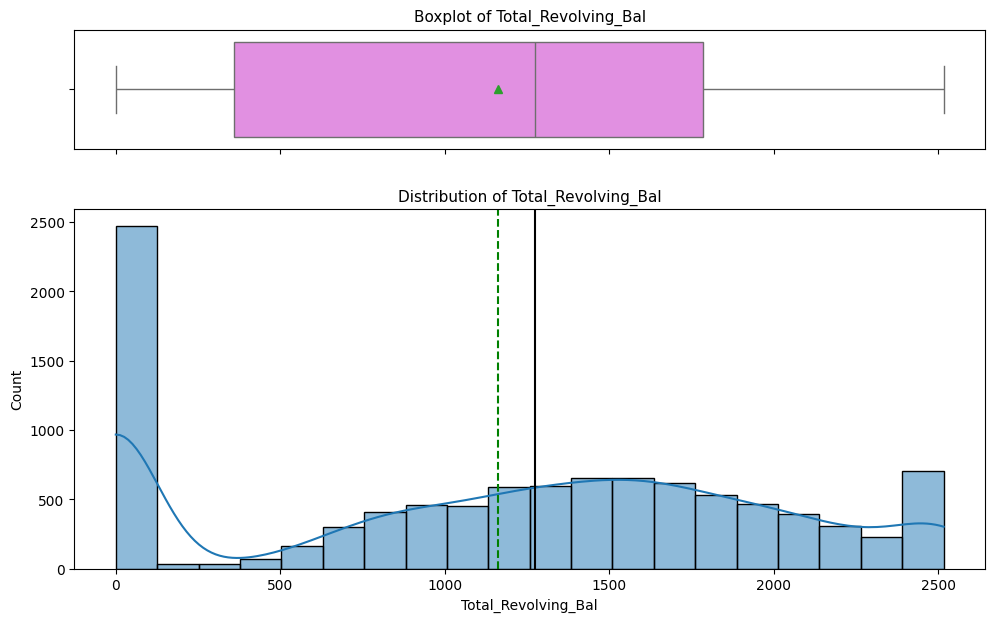

In [ ]:
# Display the distribution of customers with regards to Total_Revolving_Bal
show_boxplot_histplot(data = df, feature = 'Total_Revolving_Bal')

**Observations:**
* Total_Revolving_Bal slightly follows a bimodal distribution.
* There are no outliers present in this column.
* The mean value is around \$1,162.
* The median value is \$1,276.

##### Observations on Avg_Open_To_Buy:

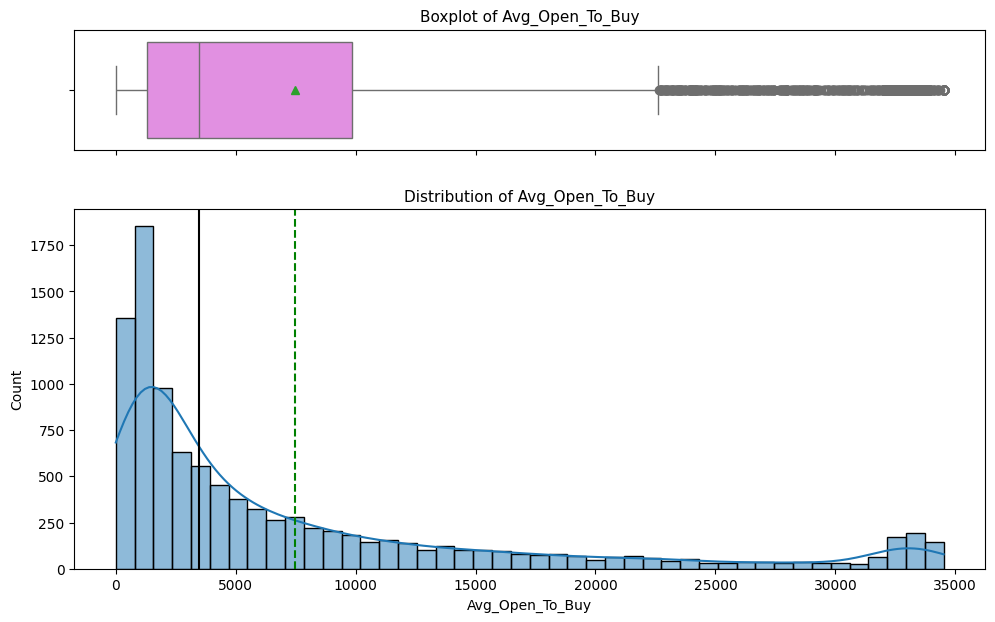

In [ ]:
# Display the distribution of customers with regards to Avg_Open_To_Buy
show_boxplot_histplot(data = df, feature = 'Avg_Open_To_Buy')

In [ ]:
# Create a dataset of outliers for Avg_Open_To_Buy
df_aotb_outliers = get_outliers(data = df, feature = 'Avg_Open_To_Buy')

df_aotb_outliers

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
6,810347208,Existing Customer,51,M,4,Unknown,Married,$120K +,Gold,46,6,1,3,34516.00000,2264,32252.00000,1.97500,1330,31,0.72200,0.06600
7,818906208,Existing Customer,32,M,0,High School,Unknown,$60K - $80K,Silver,27,2,2,2,29081.00000,1396,27685.00000,2.20400,1538,36,0.71400,0.04800
16,709967358,Existing Customer,48,M,4,Post-Graduate,Single,$80K - $120K,Blue,36,6,2,3,30367.00000,2362,28005.00000,1.70800,1671,27,0.92900,0.07800
40,827111283,Existing Customer,45,M,3,Graduate,Single,$80K - $120K,Blue,41,2,2,2,32426.00000,578,31848.00000,1.04200,1109,28,0.47400,0.01800
45,712661433,Existing Customer,49,M,4,Uneducated,Single,$80K - $120K,Blue,30,3,2,3,34516.00000,0,34516.00000,1.62100,1444,28,1.33300,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10100,719848008,Existing Customer,39,M,2,Graduate,Unknown,$60K - $80K,Silver,36,4,2,2,29808.00000,0,29808.00000,0.66900,16098,128,0.68400,0.00000
10103,717185658,Attrited Customer,51,M,1,High School,Married,$80K - $120K,Blue,36,4,3,4,22754.00000,0,22754.00000,0.79900,8531,77,0.79100,0.00000
10104,715474083,Existing Customer,51,M,3,Graduate,Single,$60K - $80K,Silver,36,3,2,2,29663.00000,1743,27920.00000,0.66700,14638,93,0.72200,0.05900
10110,718225683,Existing Customer,56,M,1,Graduate,Single,$80K - $120K,Silver,49,5,2,2,34516.00000,1091,33425.00000,0.64000,15274,108,0.71400,0.03200


**Observations:**
* Avg_Open_To_Buy is heavily right skewed.
* There are 963 outliers present in this column.
* The mean value is around \$7,469.
* The median value is \$3,474.

##### Observations on Total_Amt_Chng_Q4_Q1:

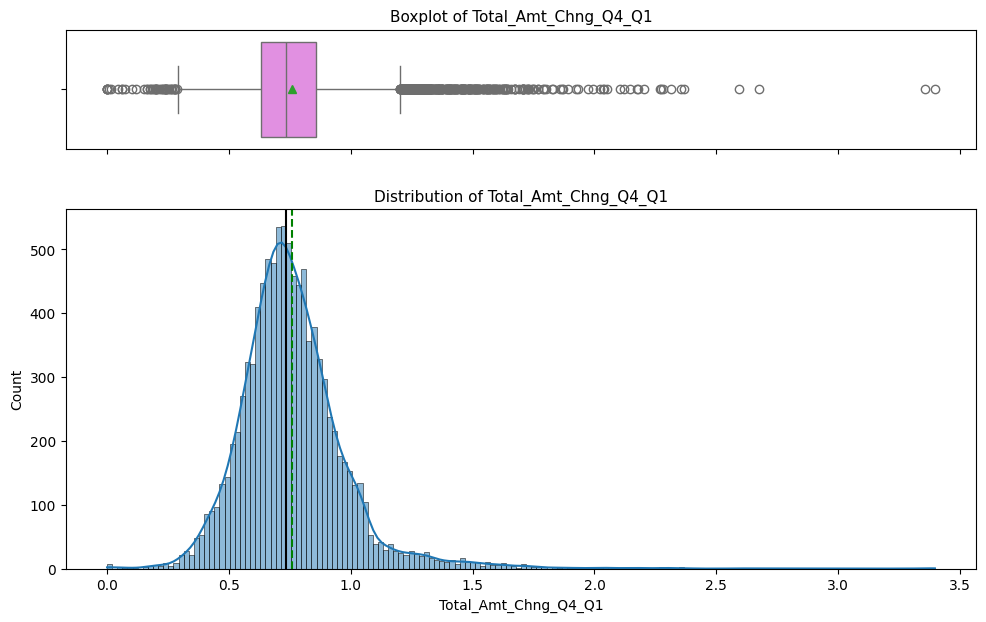

In [ ]:
# Display the distribution of customers with regards to Total_Amt_Chng_Q4_Q1
show_boxplot_histplot(data = df, feature = 'Total_Amt_Chng_Q4_Q1')

In [ ]:
# Create a dataset of outliers for Total_Amt_Chng_Q4_Q1
df_tacq41_outliers = get_outliers(data = df, feature = 'Total_Amt_Chng_Q4_Q1')

df_tacq41_outliers

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.00000,777,11914.00000,1.33500,1144,42,1.62500,0.06100
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.00000,864,7392.00000,1.54100,1291,33,3.71400,0.10500
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.00000,0,3418.00000,2.59400,1887,20,2.33300,0.00000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.00000,2517,796.00000,1.40500,1171,20,2.33300,0.76000
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.00000,0,4716.00000,2.17500,816,28,2.50000,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9793,714022833,Attrited Customer,42,F,2,Graduate,Single,$40K - $60K,Silver,32,4,3,3,17909.00000,0,17909.00000,0.22500,5977,58,0.48700,0.00000
9808,714145233,Attrited Customer,34,M,0,Graduate,Divorced,$80K - $120K,Silver,24,1,2,3,34516.00000,400,34116.00000,0.20200,5112,49,0.25600,0.01200
9963,717774333,Attrited Customer,48,M,3,High School,Married,$60K - $80K,Blue,36,1,2,5,8431.00000,0,8431.00000,0.22200,5189,57,0.35700,0.00000
10008,714199008,Attrited Customer,50,M,2,Unknown,Married,$120K +,Blue,36,6,2,2,16081.00000,492,15589.00000,0.20400,6100,61,0.56400,0.03100


**Observations:**
* Total_Amt_Chng_Q4_Q1 does have a sharp bell curve and follows normal distribution.
* This column is right skewed.
* There are 396 outliers present in this column.
* The mean value is near the median.
* The mean and median total amount change Q4-Q1 is close to $7.

##### Observations on Total_Trans_Amt:

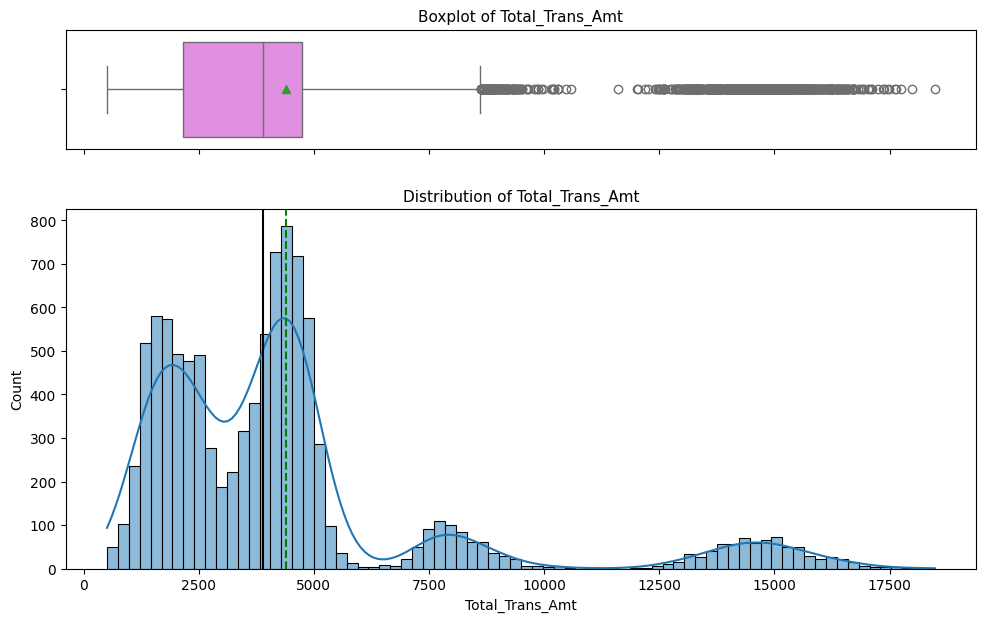

In [ ]:
# Display the distribution of customers with regards to Total_Trans_Amt
show_boxplot_histplot(data = df, feature = 'Total_Trans_Amt')

In [ ]:
# Create a dataset of outliers for Total_Trans_Amt
df_tta_outliers = get_outliers(data = df, feature = 'Total_Trans_Amt')

df_tta_outliers

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
8591,772313358,Existing Customer,50,M,3,High School,Single,$80K - $120K,Blue,39,3,3,2,21322.00000,2216,19106.00000,0.92100,8693,91,0.56900,0.10400
8650,785515533,Existing Customer,43,F,2,College,Married,Less than $40K,Blue,37,3,3,1,5380.00000,1337,4043.00000,0.84500,8947,93,0.57600,0.24900
8670,771719283,Existing Customer,39,F,4,Doctorate,Married,Less than $40K,Blue,27,2,1,1,8587.00000,1324,7263.00000,0.89700,8854,92,0.64300,0.15400
8708,712266633,Existing Customer,51,F,2,Unknown,Married,$40K - $60K,Blue,36,2,2,1,14800.00000,1020,13780.00000,0.89600,8796,94,0.59300,0.06900
8734,758211483,Existing Customer,45,M,5,Unknown,Married,$60K - $80K,Blue,38,1,2,3,6895.00000,2314,4581.00000,0.84000,8778,85,0.60400,0.33600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10121,713899383,Existing Customer,56,F,1,Graduate,Single,Less than $40K,Blue,50,4,1,4,3688.00000,606,3082.00000,0.57000,14596,120,0.79100,0.16400
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.00000,1851,2152.00000,0.70300,15476,117,0.85700,0.46200
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,2,3,4277.00000,2186,2091.00000,0.80400,8764,69,0.68300,0.51100
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.00000,0,5409.00000,0.81900,10291,60,0.81800,0.00000


**Observations:**
* Total_Trans_Amt follows multimodal distribution.
* This column is heavily right skewed.
* There are 896 outliers present in this column.
* The mean value is around \$4,404.
* The median value is \$3,899.

##### Observations on Total_Trans_Ct:

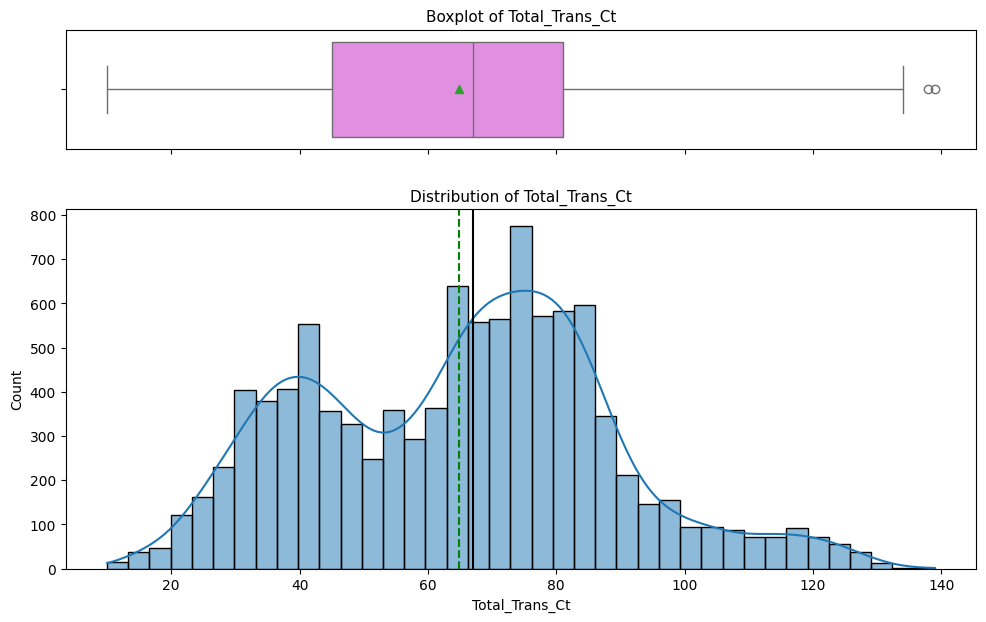

In [ ]:
# Display the distribution of customers with regards to Total_Trans_Ct
show_boxplot_histplot(data = df, feature = 'Total_Trans_Ct')

In [ ]:
# Create a dataset of outliers for Total_Trans_Ct
df_ttc_outliers = get_outliers(data = df, feature = 'Total_Trans_Ct')

df_ttc_outliers

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
9324,708163758,Existing Customer,41,M,3,Unknown,Married,$120K +,Blue,33,2,4,3,34516.00000,638,33878.00000,0.72400,13085,139,0.67500,0.01800
9586,784868958,Existing Customer,56,F,1,High School,Married,Unknown,Blue,49,1,2,1,17542.00000,2517,15025.00000,0.80000,13939,138,0.79200,0.14300


**Observations:**
* Total_Trans_Ct follows bimodal distribution.
* There are 2 outliers present in this column.
* The mean value is around 64 counts.
* The median value is 67 counts.

##### Observations on Total_Ct_Chng_Q4_Q1:

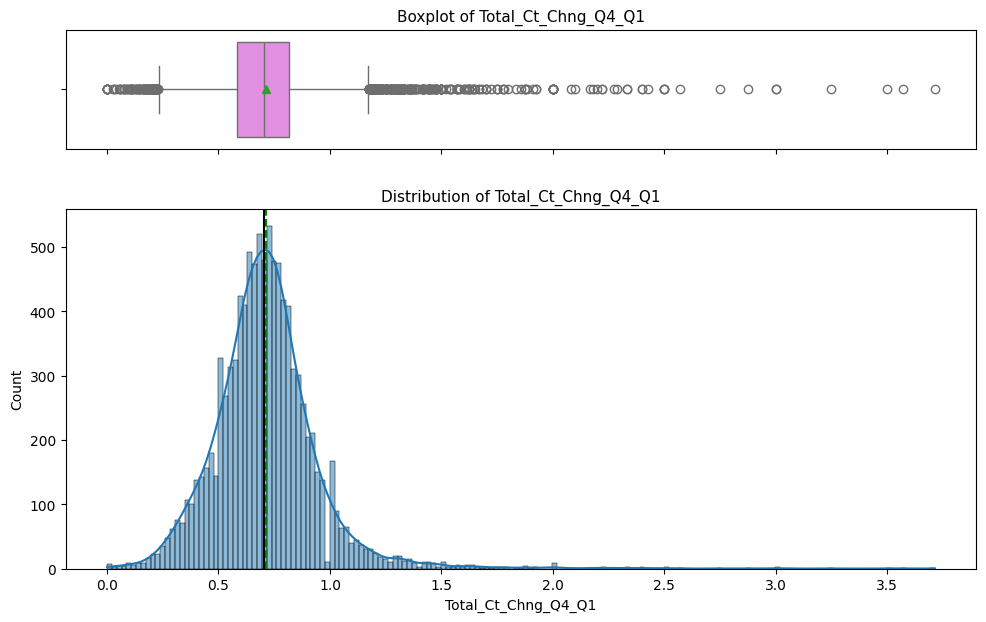

In [ ]:
# Display the distribution of customers with regards to Total_Ct_Chng_Q4_Q1
show_boxplot_histplot(data = df, feature = 'Total_Ct_Chng_Q4_Q1')

In [ ]:
# Create a dataset of outliers for Total_Ct_Chng_Q4_Q1
df_tccq41_outliers = get_outliers(data = df, feature = 'Total_Ct_Chng_Q4_Q1')

df_tccq41_outliers

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.00000,777,11914.00000,1.33500,1144,42,1.62500,0.06100
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.00000,864,7392.00000,1.54100,1291,33,3.71400,0.10500
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.00000,0,3418.00000,2.59400,1887,20,2.33300,0.00000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.00000,2517,796.00000,1.40500,1171,20,2.33300,0.76000
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.00000,0,4716.00000,2.17500,816,28,2.50000,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9388,714361083,Attrited Customer,40,F,2,College,Single,Less than $40K,Blue,36,4,2,3,5989.00000,0,5989.00000,0.31100,5843,60,0.17600,0.00000
9672,708496833,Attrited Customer,60,M,1,High School,Single,Less than $40K,Blue,50,4,4,5,4613.00000,0,4613.00000,0.97800,8970,78,1.29400,0.00000
9856,714757083,Attrited Customer,44,M,4,Uneducated,Married,$60K - $80K,Silver,37,1,2,2,29076.00000,0,29076.00000,0.77000,8765,84,1.21100,0.00000
9917,709249083,Attrited Customer,40,M,2,Unknown,Single,$60K - $80K,Blue,20,4,2,4,4283.00000,0,4283.00000,0.87800,8672,64,1.20700,0.00000


**Observations:**
* Total_Ct_Chng_Q4_Q1 does have a sharp bell curve and follows normal distribution.
* This column is right skewed.
* There are 394 outliers present in this column.
* The mean value is near the median.
* The mean and median total count change Q4-Q1 is close to 0.7 counts.

##### Observations on Avg_Utilization_Ratio:

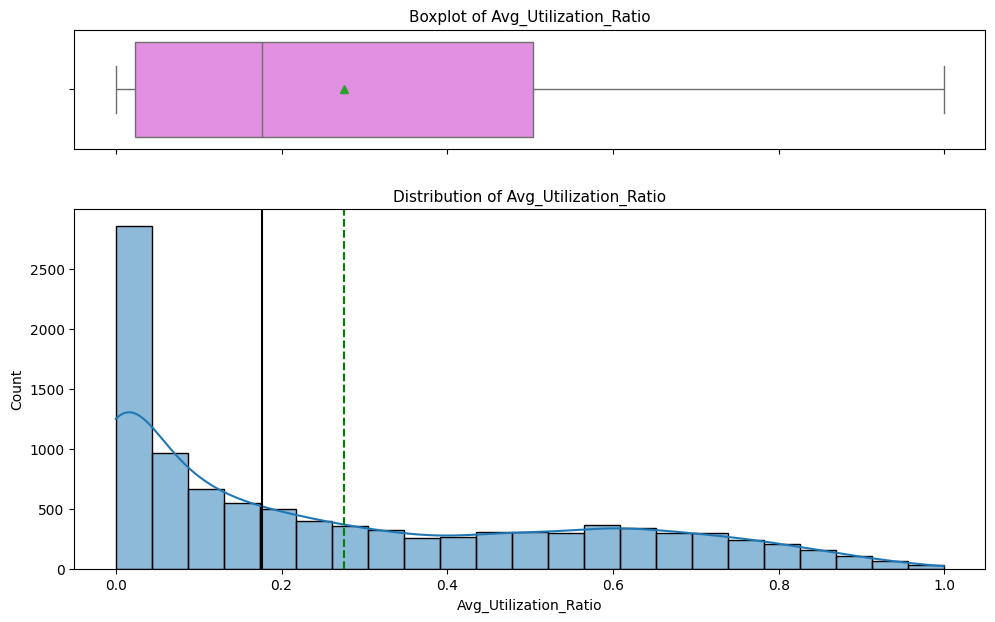

In [ ]:
# Display the distribution of customers with regards to Avg_Utilization_Ratio
show_boxplot_histplot(data = df, feature = 'Avg_Utilization_Ratio')

**Observations:**
* Avg_Utilization_Ratio is heavily right skewed.
* There are no outliers present in this column.
* The mean value is around 0.27.
* The median value is 0.18.

### Multivariate Analysis

##### Observations on Numerical Variable Relationships:

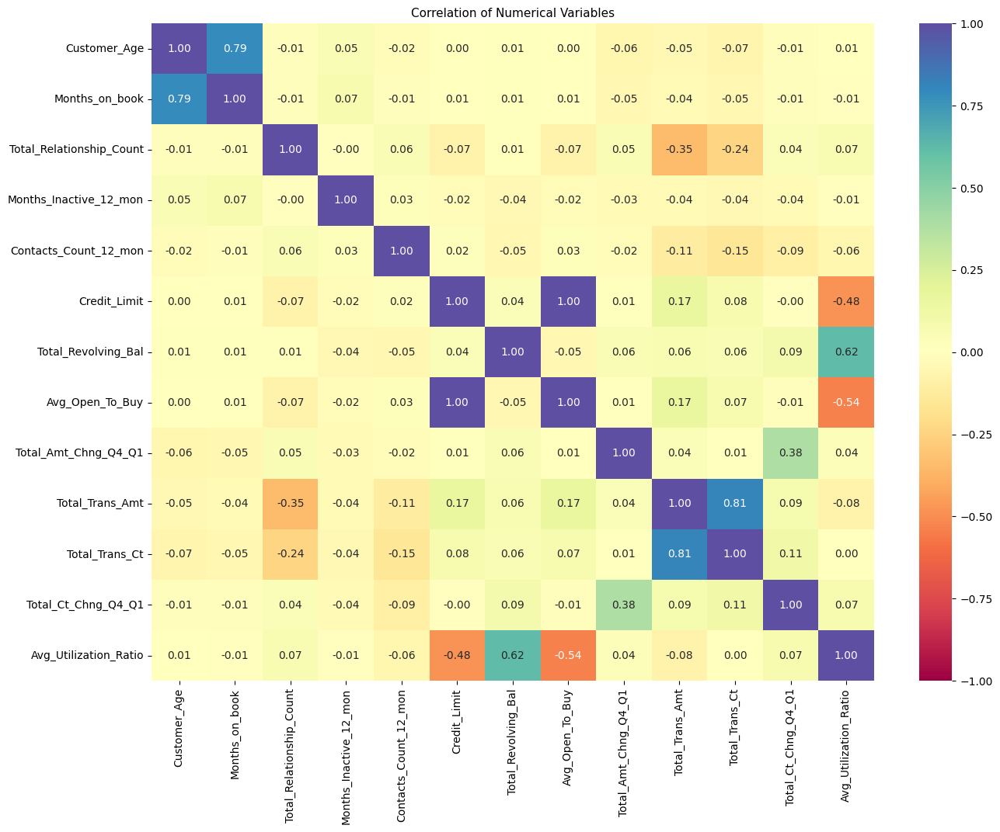

In [ ]:
# Display the relationships of Numerical Variables
show_heatmap(data = df[num_cols], figsize = (15, 11))

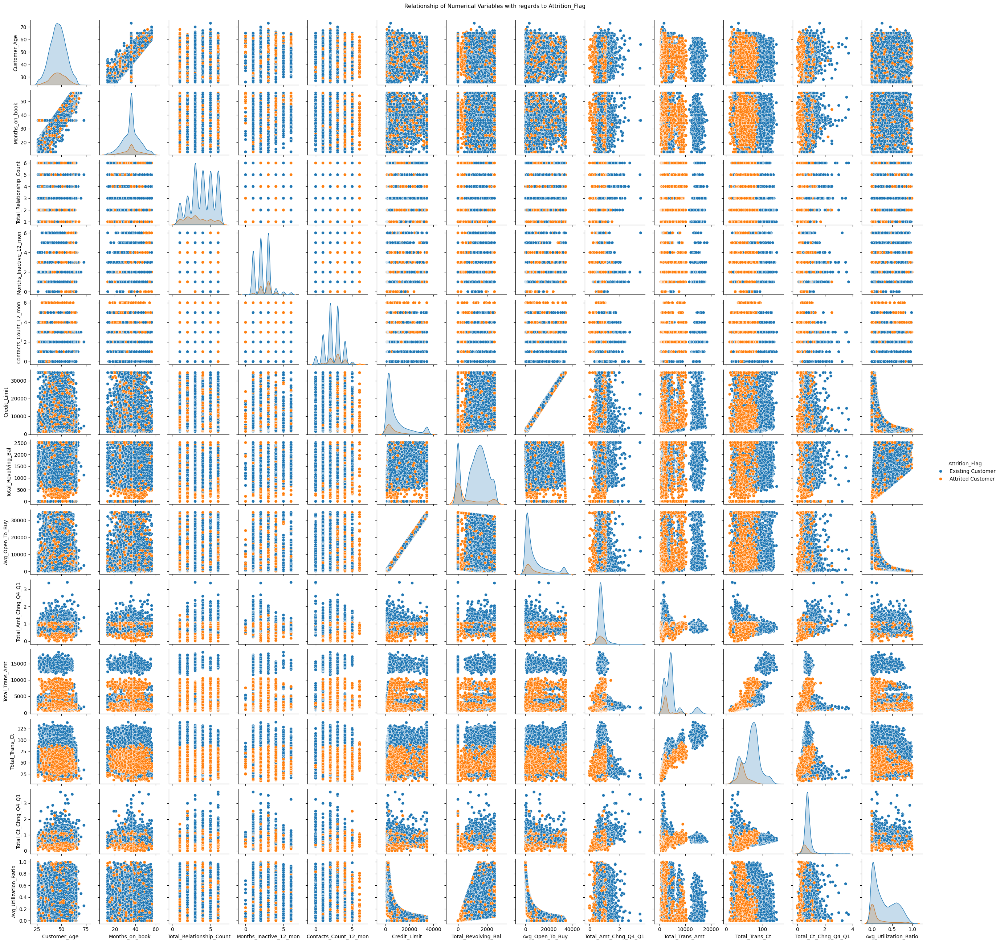

In [ ]:
# Display the relationships of Numerical Variables with regards to Attrition_Flag
show_pairplot(data = df[num_cols + ['Attrition_Flag']], hue = 'Attrition_Flag')

**Observations:**
* The orange spots are the attrited customers while the blue spots are the existing customers.
* Credit_Limit and Avg_Open_To_Buy show a perfect positive correlation (1.00).
* Total_Trans_Amt and Total_Trans_Ct show a strong positive correlation (0.81).
* Customer_Age and Months_on_Book also show a strong positive correlation (0.79).
* Total_Trans_Amt and Total_Trans_Ct are lower for customers who have attrited.
* Total_Amt_Chng_Q4_Q1 and Total_Ct_Chng_Q4_Q1 are slightly lower for customers who have attrited.
* The rest of the numerical columns shows small correlation.

##### Observations on Customer_Age:

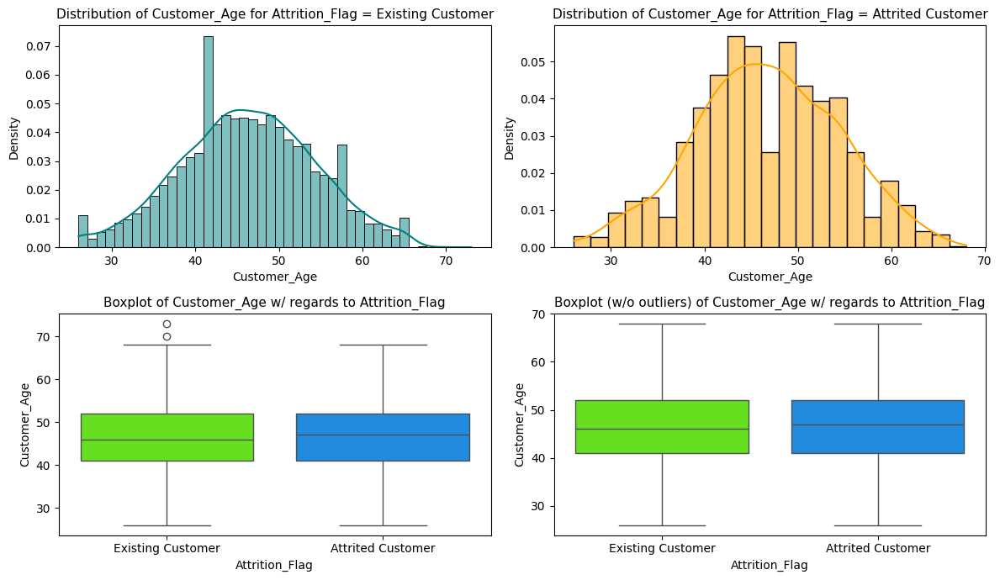

In [ ]:
# Display the distribution of Customer_Age with regards to Attrition_Flag
show_distplot_boxplot(data = df, feature = 'Customer_Age', target = 'Attrition_Flag', figsize = (12, 7))

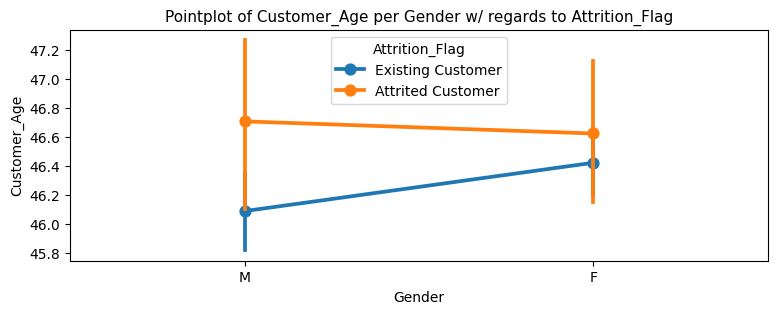

In [ ]:
# Display the distribution of Customer_Age per Gender with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Customer_Age', category = 'Gender', target = 'Attrition_Flag', figsize = (9, 3))

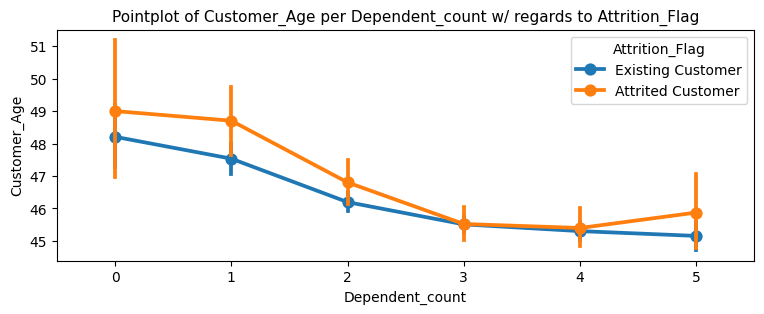

In [ ]:
# Display the distribution of Customer_Age per Dependent_count with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Customer_Age', category = 'Dependent_count', target = 'Attrition_Flag', figsize = (9, 3))

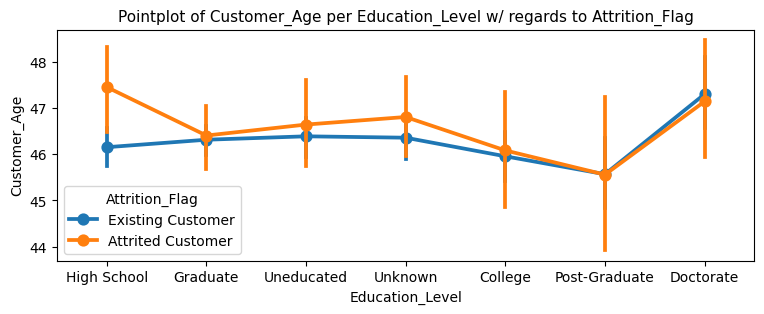

In [ ]:
# Display the distribution of Customer_Age per Education_Level with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Customer_Age', category = 'Education_Level', target = 'Attrition_Flag', figsize = (9, 3))

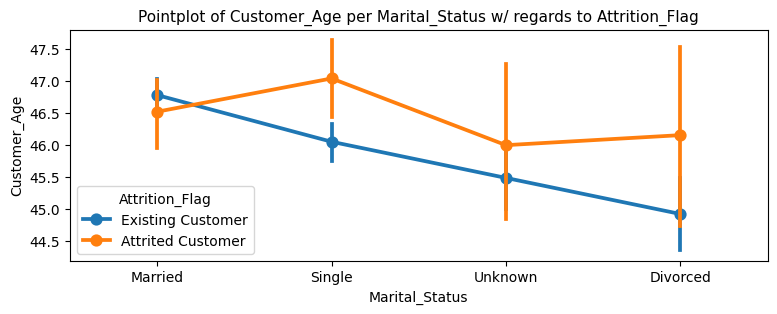

In [ ]:
# Display the distribution of Customer_Age per Marital_Status with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Customer_Age', category = 'Marital_Status', target = 'Attrition_Flag', figsize = (9, 3))

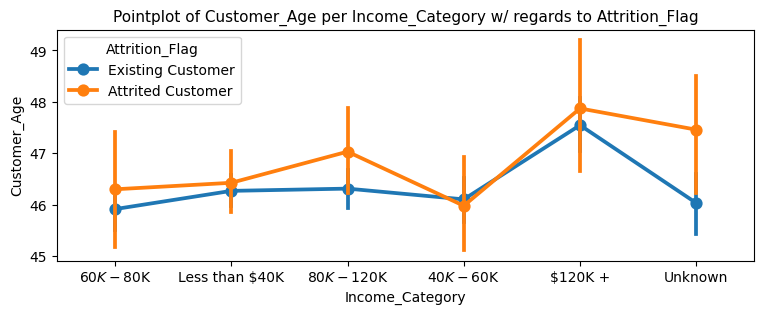

In [ ]:
# Display the distribution of Customer_Age per Income_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Customer_Age', category = 'Income_Category', target = 'Attrition_Flag', figsize = (9, 3))

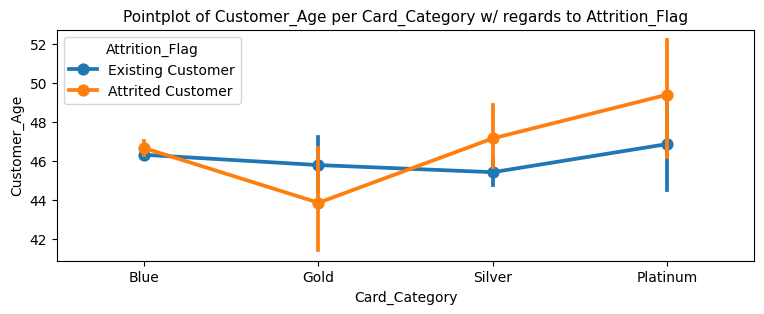

In [ ]:
# Display the distribution of Customer_Age per Card_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Customer_Age', category = 'Card_Category', target = 'Attrition_Flag', figsize = (9, 3))

**Observations:**
* Customer_Age shows that the majority of customers do not have a significant difference in age for both attrited and existing customers.
* The median age is close to 47 years old for both attrited and existing customers.

##### Observations on Months_on_book:

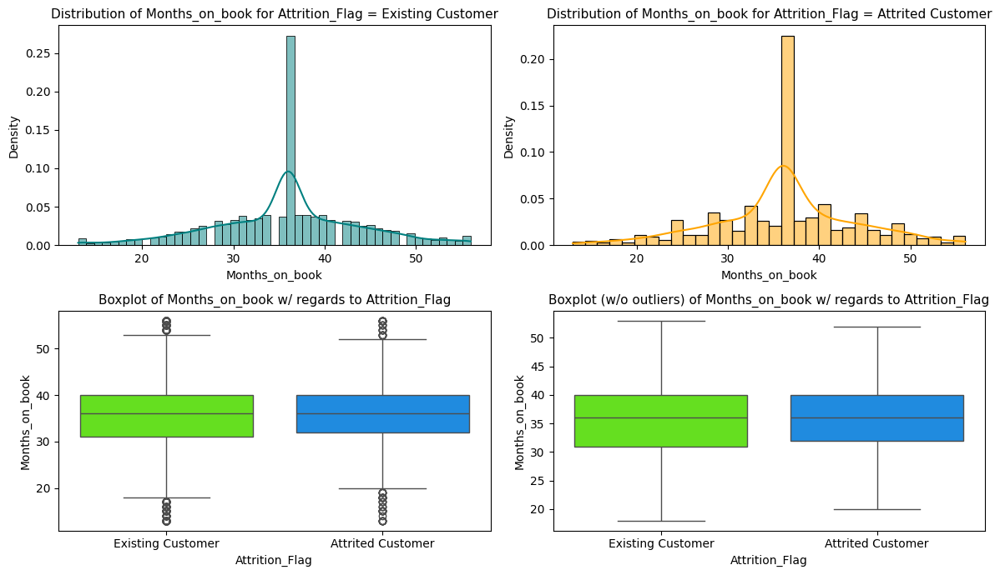

In [ ]:
# Display the distribution of Months_on_book with regards to Attrition_Flag
show_distplot_boxplot(data = df, feature = 'Months_on_book', target = 'Attrition_Flag', figsize = (12, 7))

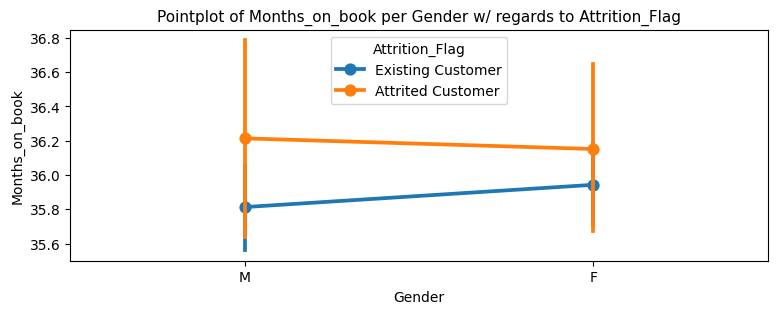

In [ ]:
# Display the distribution of Months_on_book per Gender with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Months_on_book', category = 'Gender', target = 'Attrition_Flag', figsize = (9, 3))

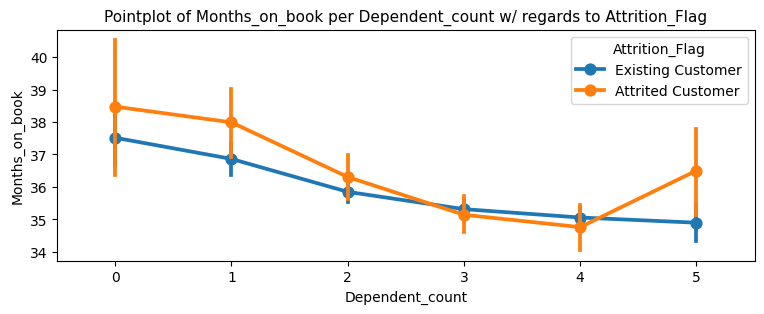

In [ ]:
# Display the distribution of Months_on_book per Dependent_count with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Months_on_book', category = 'Dependent_count', target = 'Attrition_Flag', figsize = (9, 3))

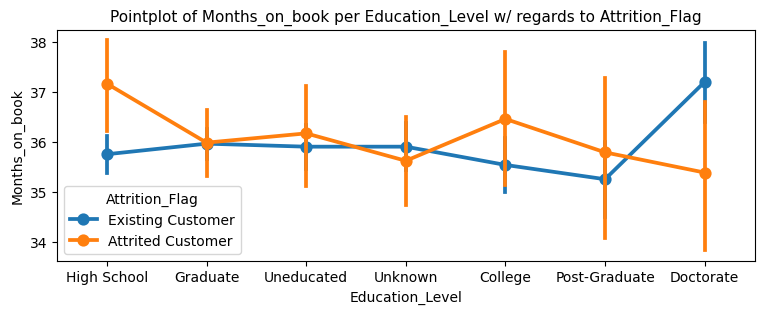

In [ ]:
# Display the distribution of Months_on_book per Education_Level with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Months_on_book', category = 'Education_Level', target = 'Attrition_Flag', figsize = (9, 3))

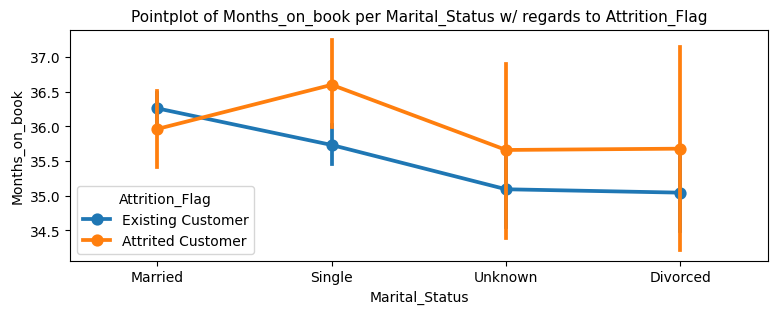

In [ ]:
# Display the distribution of Months_on_book per Marital_Status with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Months_on_book', category = 'Marital_Status', target = 'Attrition_Flag', figsize = (9, 3))

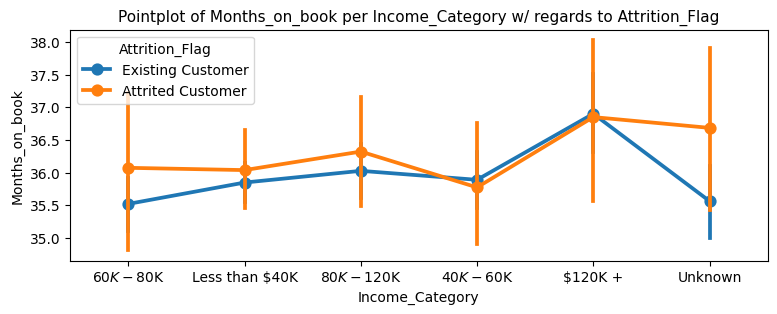

In [ ]:
# Display the distribution of Months_on_book per Income_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Months_on_book', category = 'Income_Category', target = 'Attrition_Flag', figsize = (9, 3))

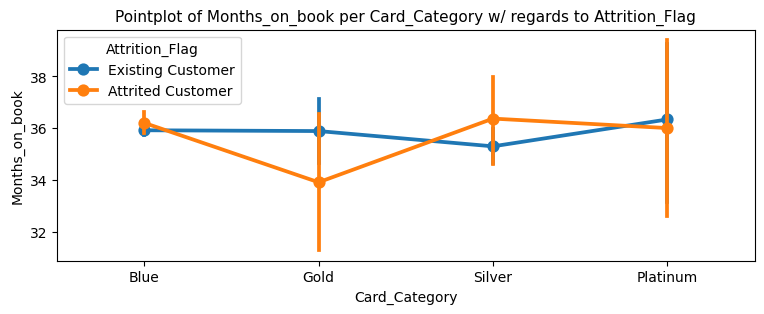

In [ ]:
# Display the distribution of Months_on_book per Card_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Months_on_book', category = 'Card_Category', target = 'Attrition_Flag', figsize = (9, 3))

**Observations:**
* Months_on_book shows that the majority of customers do not have a significant difference in months on book for both attrited and existing customers.
* The median months on book is close to 36 months for both attrited and existing customers.
* There are outliers in months on book for both attrited and existing customers.

##### Observations on Total_Relationship_Count:

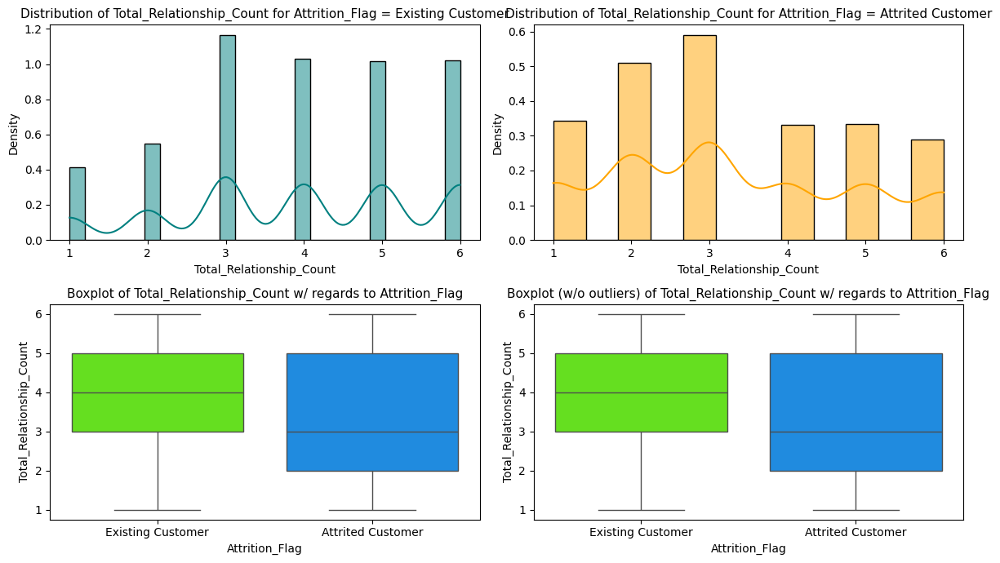

In [ ]:
# Display the distribution of Total_Relationship_Count with regards to Attrition_Flag
show_distplot_boxplot(data = df, feature = 'Total_Relationship_Count', target = 'Attrition_Flag', figsize = (12, 7))

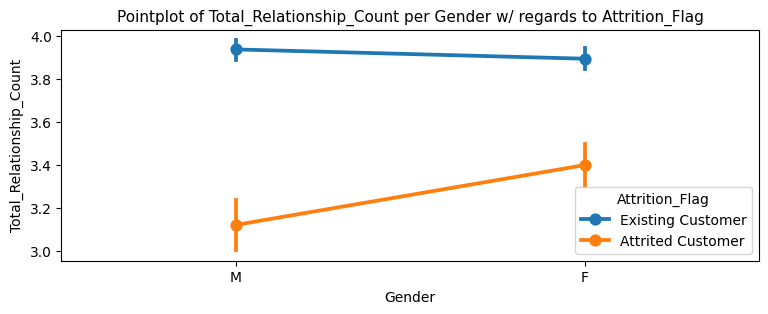

In [ ]:
# Display the distribution of Total_Relationship_Count per Gender with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Relationship_Count', category = 'Gender', target = 'Attrition_Flag', figsize = (9, 3))

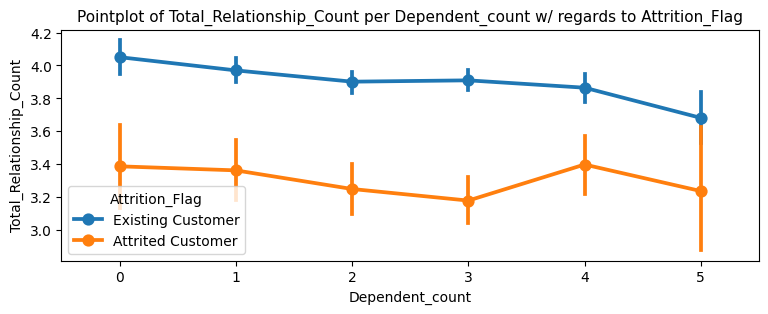

In [ ]:
# Display the distribution of Total_Relationship_Count per Dependent_count with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Relationship_Count', category = 'Dependent_count', target = 'Attrition_Flag', figsize = (9, 3))

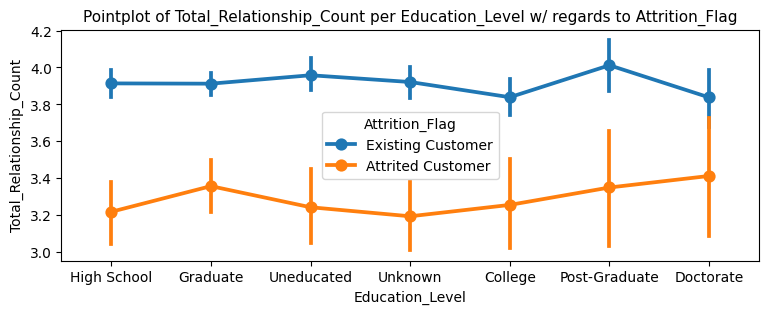

In [ ]:
# Display the distribution of Total_Relationship_Count per Education_Level with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Relationship_Count', category = 'Education_Level', target = 'Attrition_Flag', figsize = (9, 3))

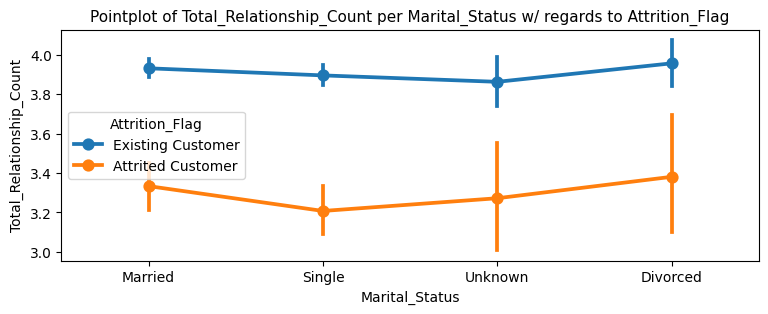

In [ ]:
# Display the distribution of Total_Relationship_Count per Marital_Status with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Relationship_Count', category = 'Marital_Status', target = 'Attrition_Flag', figsize = (9, 3))

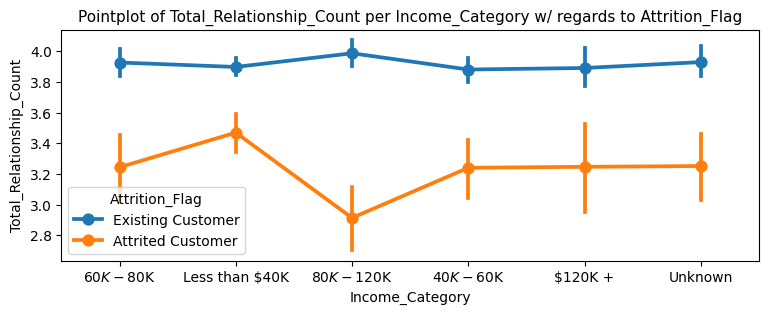

In [ ]:
# Display the distribution of Total_Relationship_Count per Income_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Relationship_Count', category = 'Income_Category', target = 'Attrition_Flag', figsize = (9, 3))

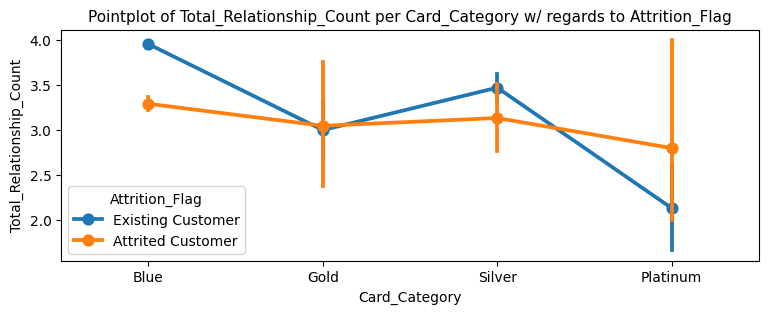

In [ ]:
# Display the distribution of Total_Relationship_Count per Card_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Relationship_Count', category = 'Card_Category', target = 'Attrition_Flag', figsize = (9, 3))

**Observations:**
* Total_Relationship_Count shows that the majority of customers who have attrited do have significantly lower total relationship count compared to existing customers.
* The median total relationship count is 3 for attrited customers.
* The median total relationship count is 4 for existing customers.

##### Observations on Months_Inactive_12_mon:

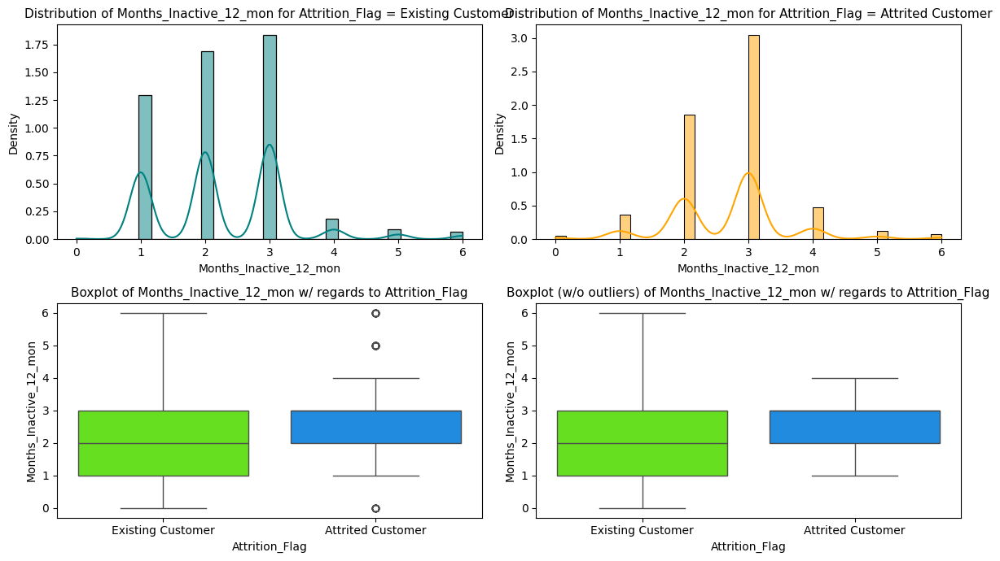

In [ ]:
# Display the distribution of Months_Inactive_12_mon with regards to Attrition_Flag
show_distplot_boxplot(data = df, feature = 'Months_Inactive_12_mon', target = 'Attrition_Flag', figsize = (12, 7))

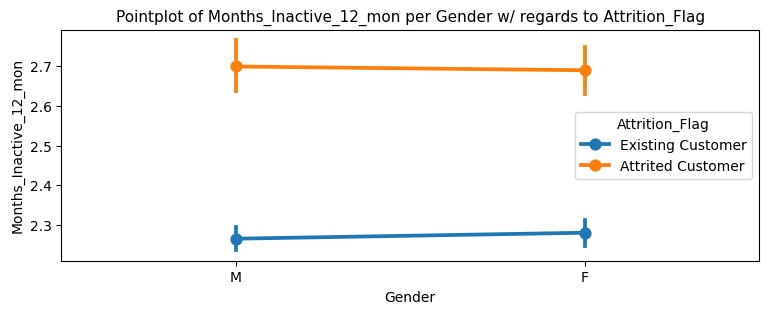

In [ ]:
# Display the distribution of Months_Inactive_12_mon per Gender with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Months_Inactive_12_mon', category = 'Gender', target = 'Attrition_Flag', figsize = (9, 3))

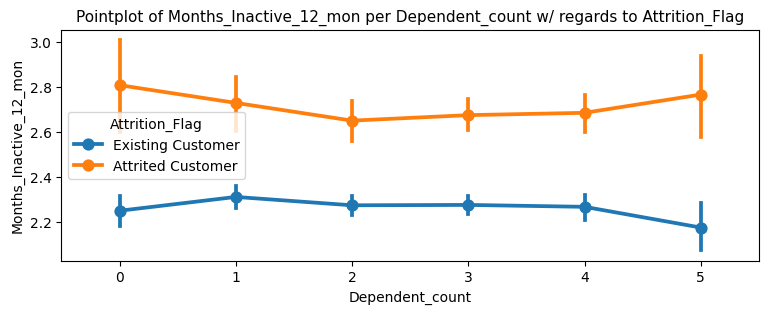

In [ ]:
# Display the distribution of Months_Inactive_12_mon per Dependent_count with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Months_Inactive_12_mon', category = 'Dependent_count', target = 'Attrition_Flag', figsize = (9, 3))

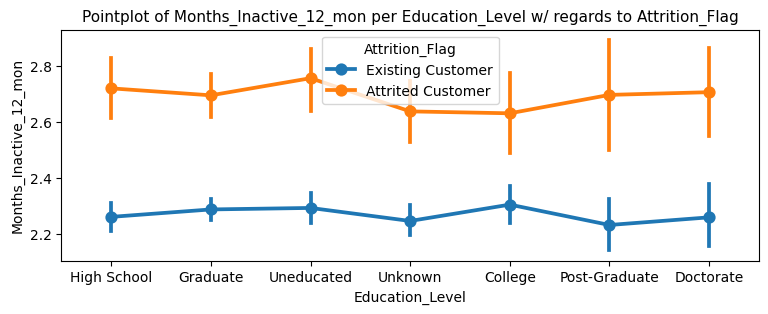

In [ ]:
# Display the distribution of Months_Inactive_12_mon per Education_Level with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Months_Inactive_12_mon', category = 'Education_Level', target = 'Attrition_Flag', figsize = (9, 3))

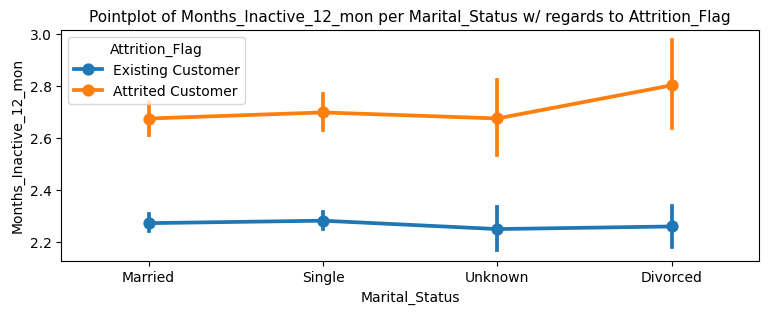

In [ ]:
# Display the distribution of Months_Inactive_12_mon per Marital_Status with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Months_Inactive_12_mon', category = 'Marital_Status', target = 'Attrition_Flag', figsize = (9, 3))

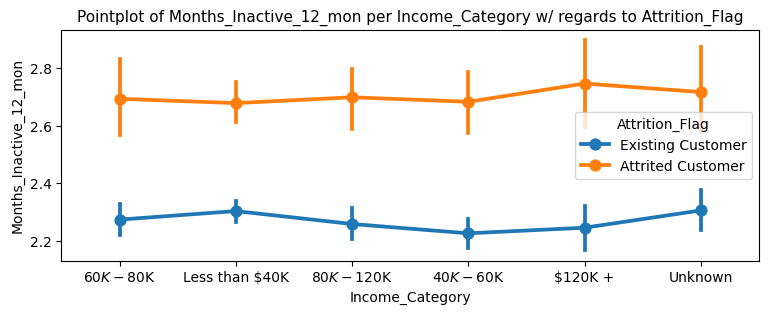

In [ ]:
# Display the distribution of Months_Inactive_12_mon per Income_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Months_Inactive_12_mon', category = 'Income_Category', target = 'Attrition_Flag', figsize = (9, 3))

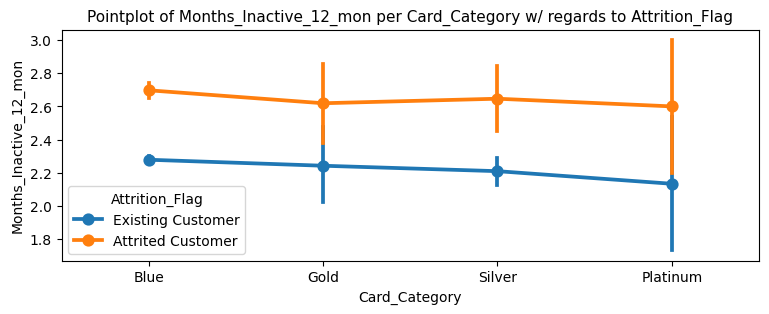

In [ ]:
# Display the distribution of Months_Inactive_12_mon per Card_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Months_Inactive_12_mon', category = 'Card_Category', target = 'Attrition_Flag', figsize = (9, 3))

**Observations:**
* Months_Inactive_12_mon shows that the majority of customers who have attrited do have higher months inactive compared to existing customers.
* The median months inactive count is 2 months for attrited customers.
* The median months inactive count is 3 months for existing customers.
* There are outliers in months inactive only for attrited customers.

##### Observations on Contacts_Count_12_mon:

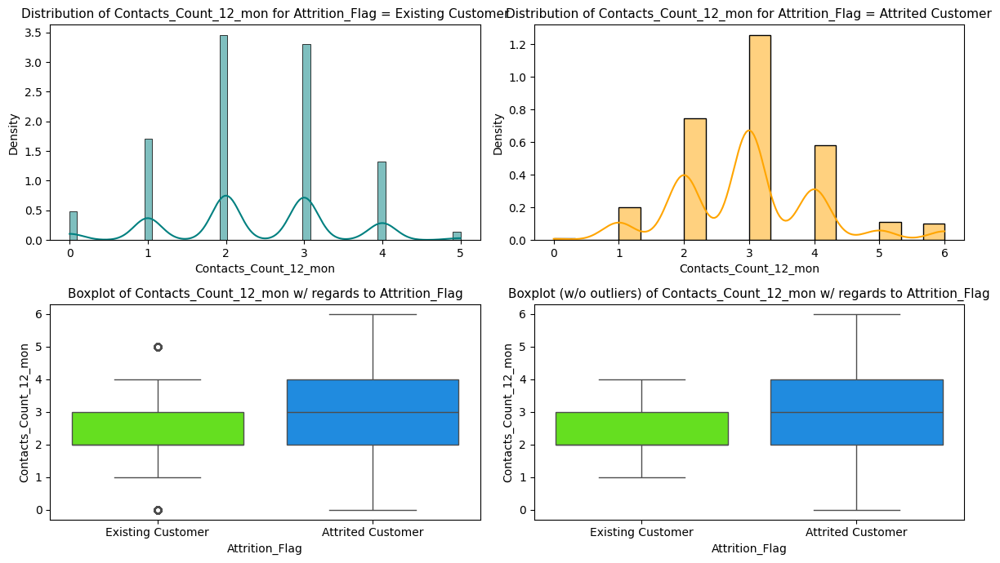

In [ ]:
# Display the distribution of Contacts_Count_12_mon with regards to Attrition_Flag
show_distplot_boxplot(data = df, feature = 'Contacts_Count_12_mon', target = 'Attrition_Flag', figsize = (12, 7))

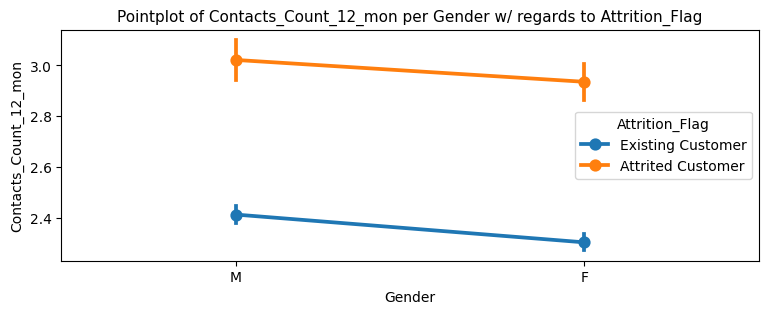

In [ ]:
# Display the distribution of Contacts_Count_12_mon per Gender with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Contacts_Count_12_mon', category = 'Gender', target = 'Attrition_Flag', figsize = (9, 3))

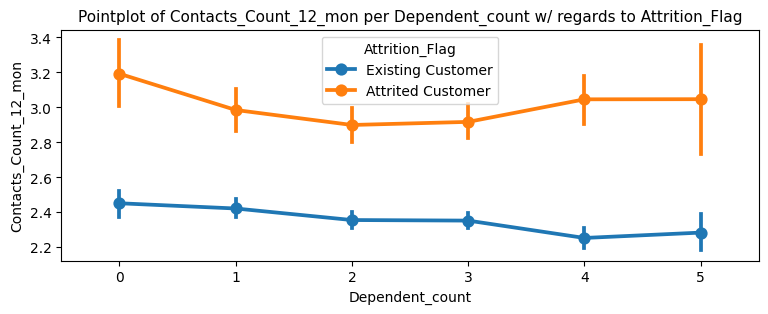

In [ ]:
# Display the distribution of Contacts_Count_12_mon per Dependent_count with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Contacts_Count_12_mon', category = 'Dependent_count', target = 'Attrition_Flag', figsize = (9, 3))

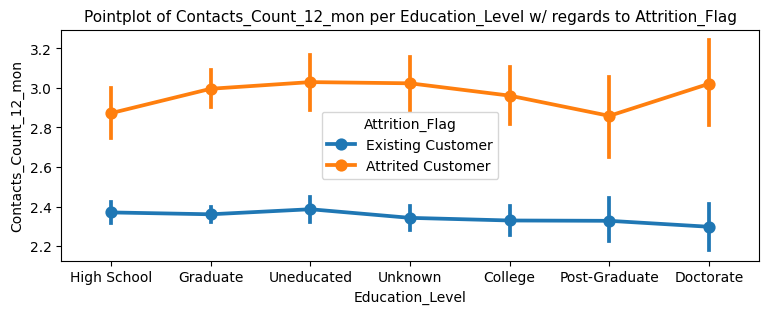

In [ ]:
# Display the distribution of Contacts_Count_12_mon per Education_Level with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Contacts_Count_12_mon', category = 'Education_Level', target = 'Attrition_Flag', figsize = (9, 3))

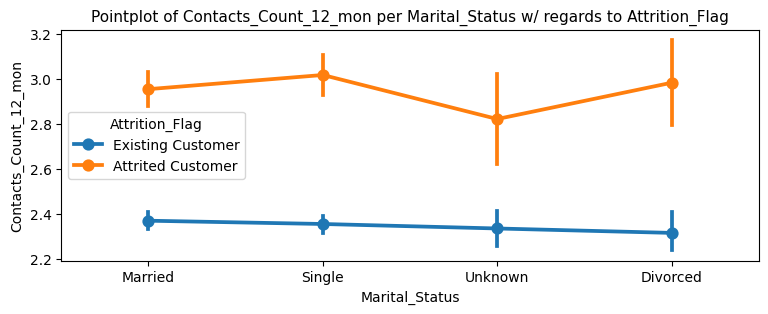

In [ ]:
# Display the distribution of Contacts_Count_12_mon per Marital_Status with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Contacts_Count_12_mon', category = 'Marital_Status', target = 'Attrition_Flag', figsize = (9, 3))

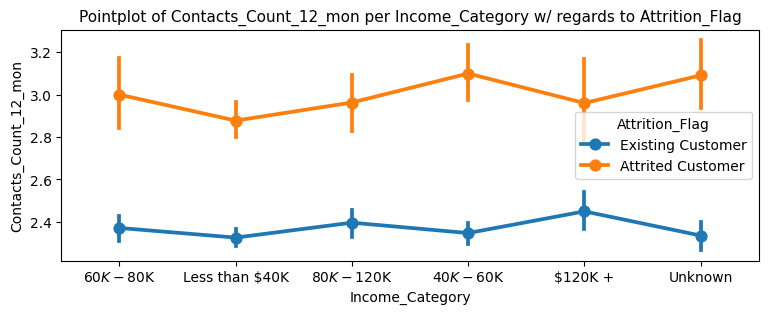

In [ ]:
# Display the distribution of Contacts_Count_12_mon per Income_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Contacts_Count_12_mon', category = 'Income_Category', target = 'Attrition_Flag', figsize = (9, 3))

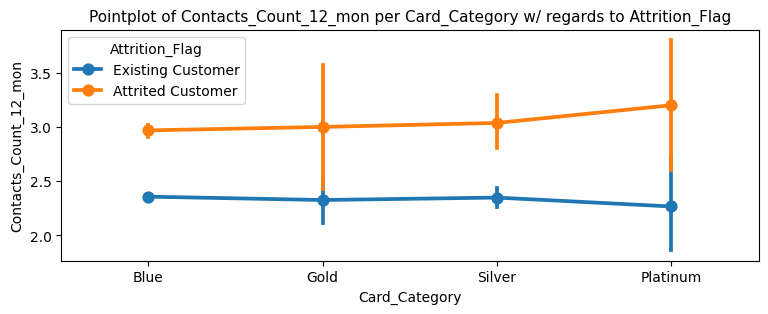

In [ ]:
# Display the distribution of Contacts_Count_12_mon per Card_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Contacts_Count_12_mon', category = 'Card_Category', target = 'Attrition_Flag', figsize = (9, 3))

**Observations:**
* Contacts_Count_12_mon shows that the majority of customers who have attrited do have slightly higher contacts count compared to existing customers.
* The median contacts count is 3 for attrited customers.
* The median contacts count is 2 for existing customers.
* There are outliers in contacts count only for existing customers.

##### Observations on Credit_Limit:

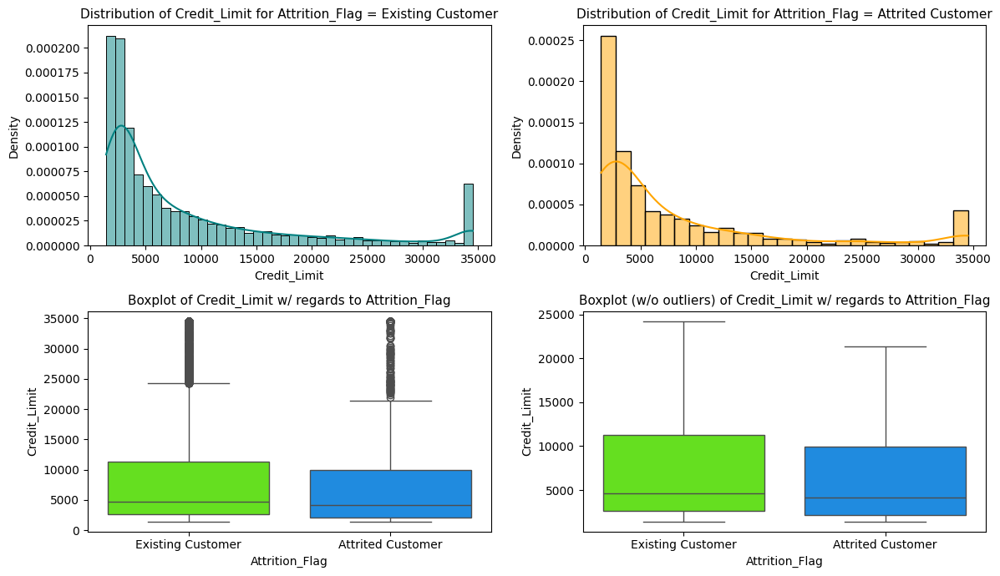

In [ ]:
# Display the distribution of Credit_Limit with regards to Attrition_Flag
show_distplot_boxplot(data = df, feature = 'Credit_Limit', target = 'Attrition_Flag', figsize = (12, 7))

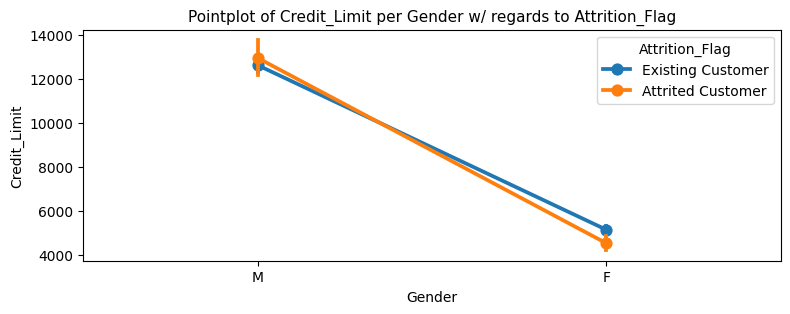

In [ ]:
# Display the distribution of Credit_Limit per Gender with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Credit_Limit', category = 'Gender', target = 'Attrition_Flag', figsize = (9, 3))

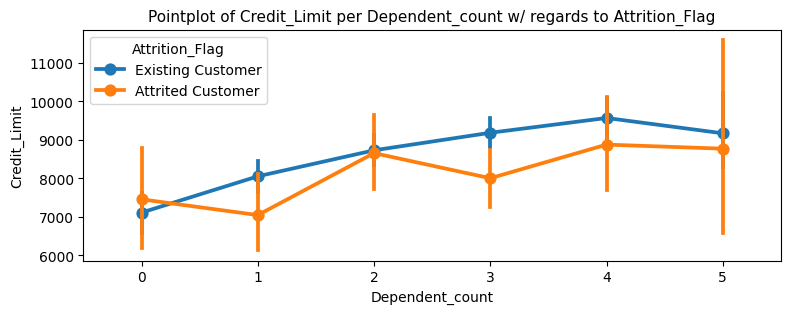

In [ ]:
# Display the distribution of Credit_Limit per Dependent_count with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Credit_Limit', category = 'Dependent_count', target = 'Attrition_Flag', figsize = (9, 3))

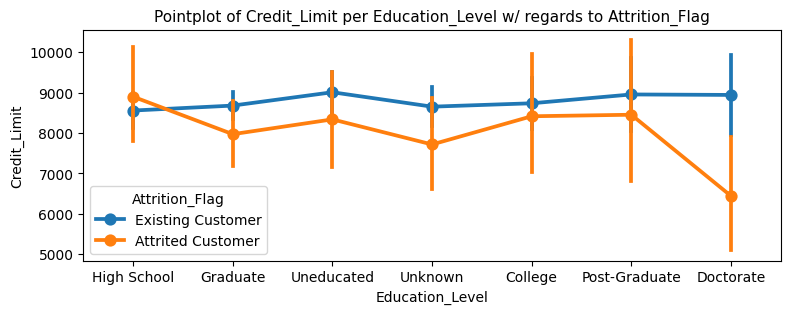

In [ ]:
# Display the distribution of Credit_Limit per Education_Level with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Credit_Limit', category = 'Education_Level', target = 'Attrition_Flag', figsize = (9, 3))

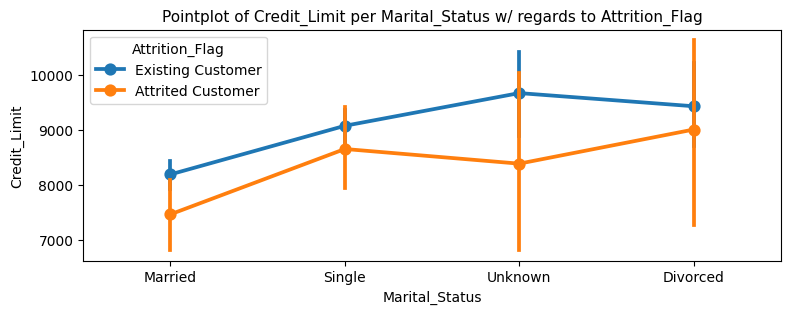

In [ ]:
# Display the distribution of Credit_Limit per Marital_Status with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Credit_Limit', category = 'Marital_Status', target = 'Attrition_Flag', figsize = (9, 3))

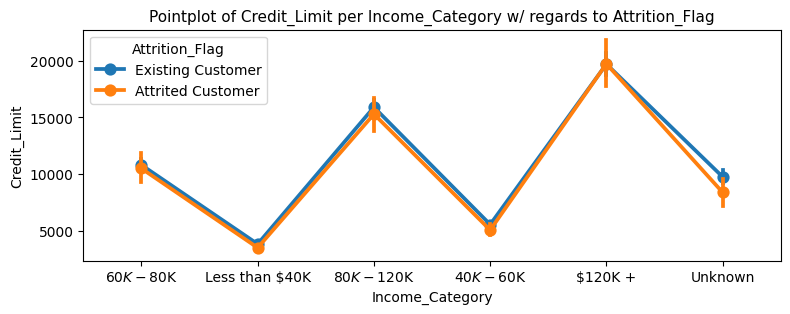

In [ ]:
# Display the distribution of Credit_Limit per Income_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Credit_Limit', category = 'Income_Category', target = 'Attrition_Flag', figsize = (9, 3))

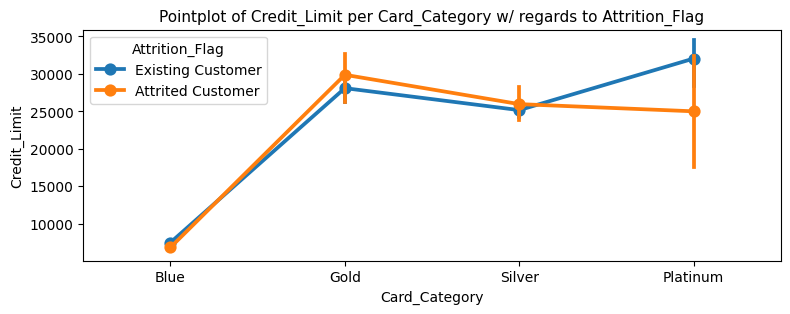

In [ ]:
# Display the distribution of Credit_Limit per Card_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Credit_Limit', category = 'Card_Category', target = 'Attrition_Flag', figsize = (9, 3))

**Observations:**
* Credit_Limit shows that the majority of customers do not have a significant difference in credit limit for both attrited and existing customers.
* The median credit limit is close to \$4,600 for both attrited and existing customers.
* There are outliers in credit limit for both attrited and existing customers.

##### Observations on Total_Revolving_Bal:

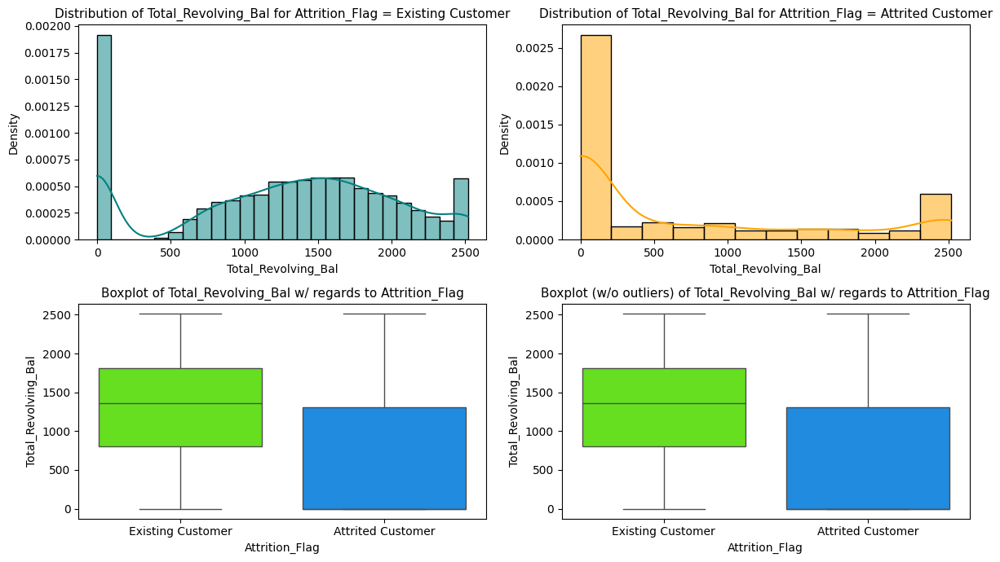

In [ ]:
# Display the distribution of Total_Revolving_Bal with regards to Attrition_Flag
show_distplot_boxplot(data = df, feature = 'Total_Revolving_Bal', target = 'Attrition_Flag', figsize = (12, 7))

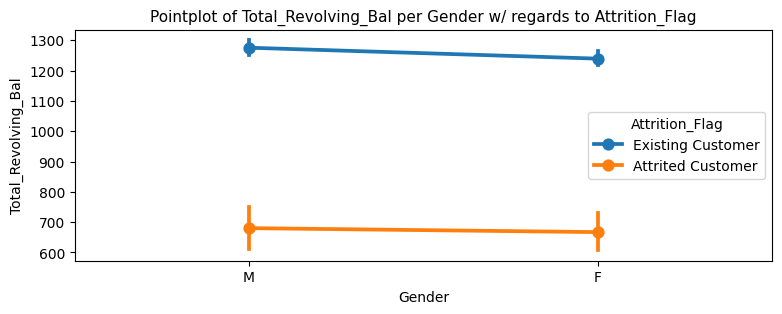

In [ ]:
# Display the distribution of Total_Revolving_Bal per Gender with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Revolving_Bal', category = 'Gender', target = 'Attrition_Flag', figsize = (9, 3))

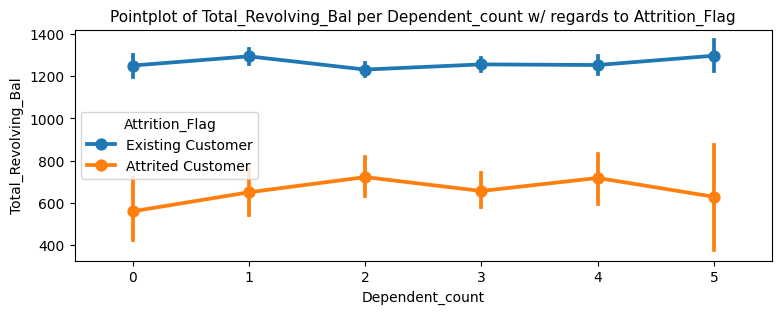

In [ ]:
# Display the distribution of Total_Revolving_Bal per Dependent_count with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Revolving_Bal', category = 'Dependent_count', target = 'Attrition_Flag', figsize = (9, 3))

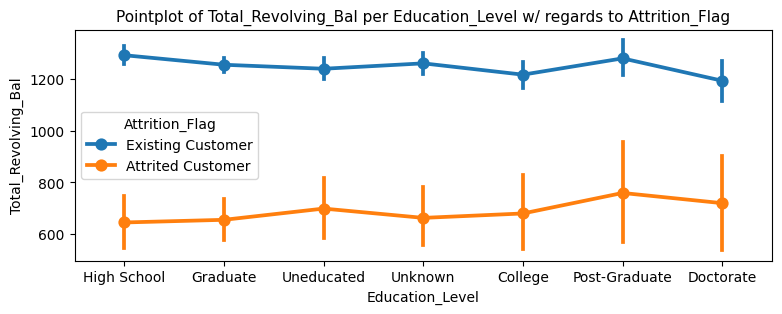

In [ ]:
# Display the distribution of Total_Revolving_Bal per Education_Level with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Revolving_Bal', category = 'Education_Level', target = 'Attrition_Flag', figsize = (9, 3))

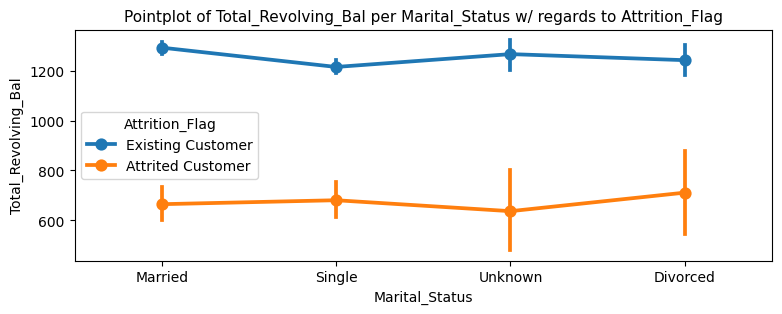

In [ ]:
# Display the distribution of Total_Revolving_Bal per Marital_Status with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Revolving_Bal', category = 'Marital_Status', target = 'Attrition_Flag', figsize = (9, 3))

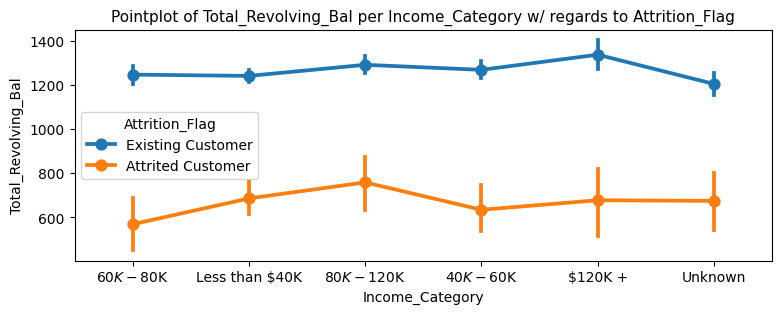

In [ ]:
# Display the distribution of Total_Revolving_Bal per Income_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Revolving_Bal', category = 'Income_Category', target = 'Attrition_Flag', figsize = (9, 3))

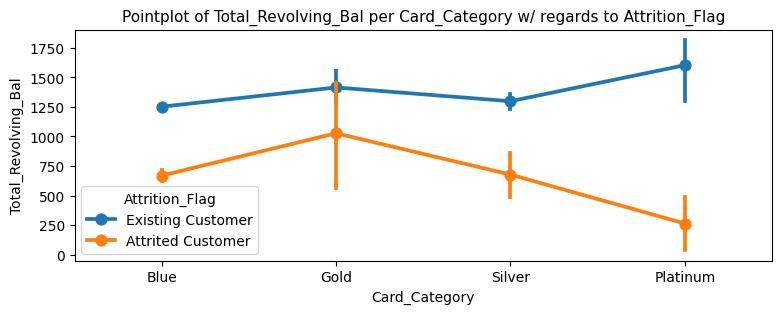

In [ ]:
# Display the distribution of Total_Revolving_Bal per Card_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Revolving_Bal', category = 'Card_Category', target = 'Attrition_Flag', figsize = (9, 3))

**Observations:**
* Total_Revolving_Bal shows that the majority of customers who have attrited do have significantly lower total revolving balance compared to existing customers.
* The median total revolving balance is \$0 for attrited customers.
* The median total revolving balance is \$1,364 for existing customers.

##### Observations on Avg_Open_To_Buy:

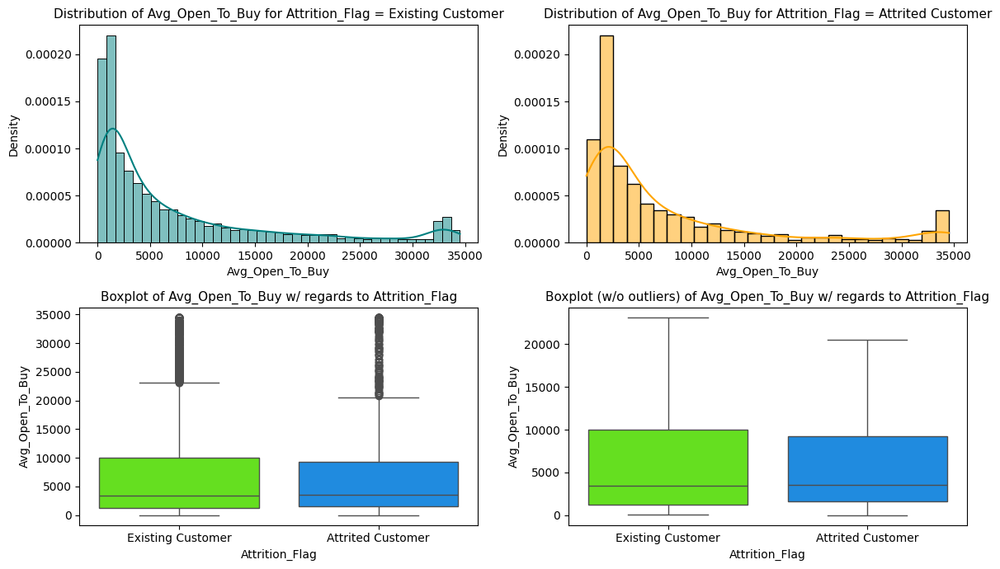

In [ ]:
# Display the distribution of Avg_Open_To_Buy with regards to Attrition_Flag
show_distplot_boxplot(data = df, feature = 'Avg_Open_To_Buy', target = 'Attrition_Flag', figsize = (12, 7))

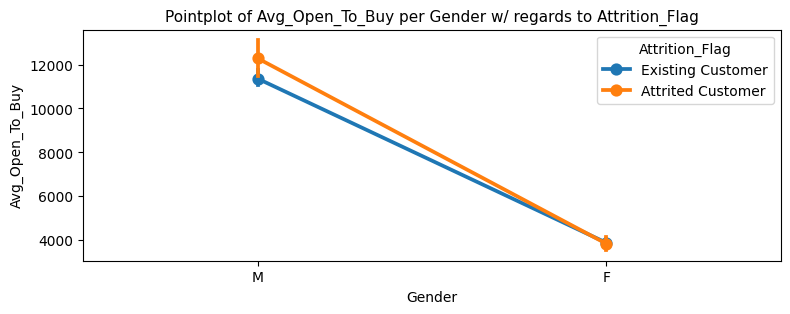

In [ ]:
# Display the distribution of Avg_Open_To_Buy per Gender with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Avg_Open_To_Buy', category = 'Gender', target = 'Attrition_Flag', figsize = (9, 3))

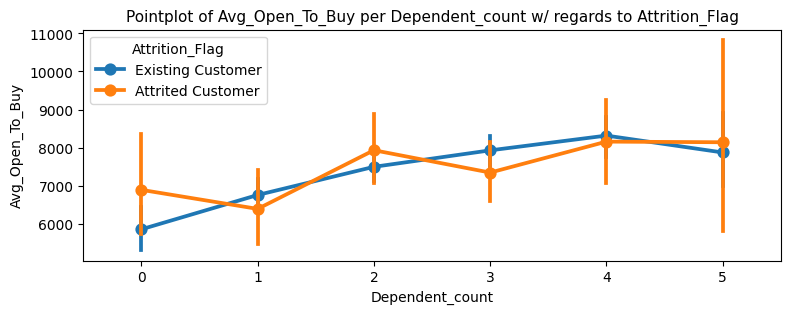

In [ ]:
# Display the distribution of Avg_Open_To_Buy per Dependent_count with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Avg_Open_To_Buy', category = 'Dependent_count', target = 'Attrition_Flag', figsize = (9, 3))

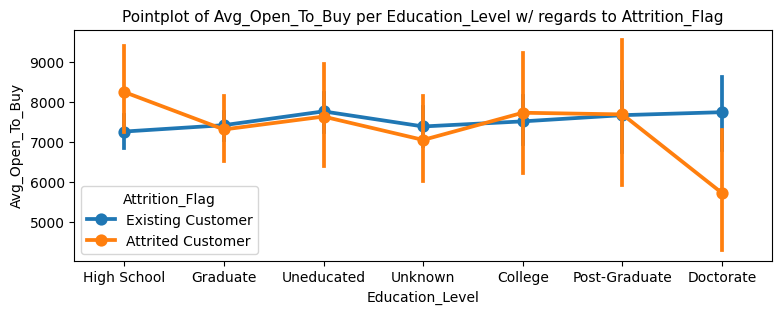

In [ ]:
# Display the distribution of Avg_Open_To_Buy per Education_Level with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Avg_Open_To_Buy', category = 'Education_Level', target = 'Attrition_Flag', figsize = (9, 3))

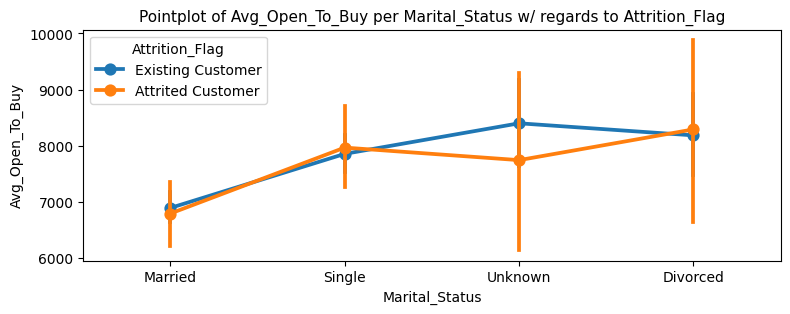

In [ ]:
# Display the distribution of Avg_Open_To_Buy per Marital_Status with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Avg_Open_To_Buy', category = 'Marital_Status', target = 'Attrition_Flag', figsize = (9, 3))

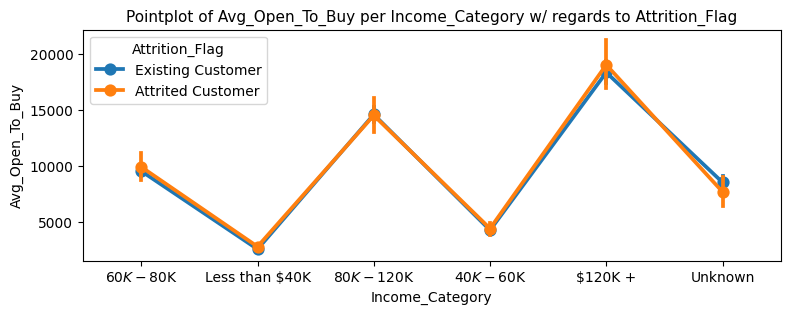

In [ ]:
# Display the distribution of Avg_Open_To_Buy per Income_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Avg_Open_To_Buy', category = 'Income_Category', target = 'Attrition_Flag', figsize = (9, 3))

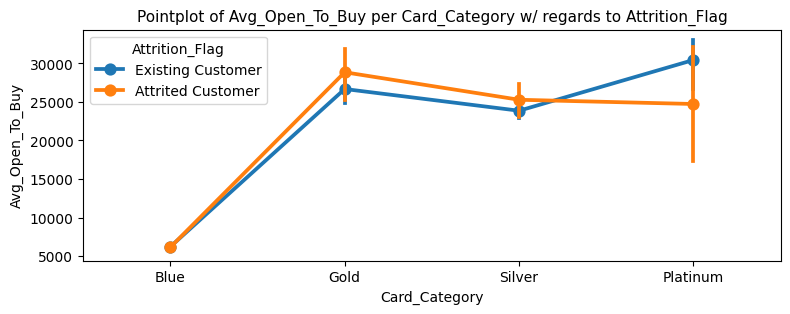

In [ ]:
# Display the distribution of Avg_Open_To_Buy per Card_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Avg_Open_To_Buy', category = 'Card_Category', target = 'Attrition_Flag', figsize = (9, 3))

**Observations:**
* Avg_Open_To_Buy shows that the majority of customers do not have a significant difference in average open to buy for both attrited and existing customers.
* The median average open to buy is close to \$3,400 for both attrited and existing customers.
* There are outliers in average open to buy for both attrited and existing customers.


##### Observations on Total_Amt_Chng_Q4_Q1:

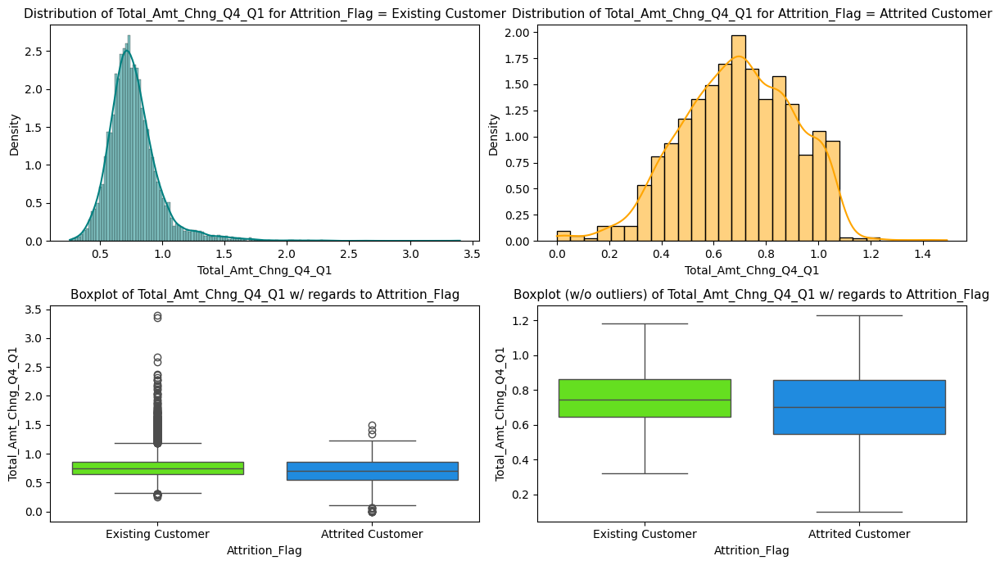

In [ ]:
# Display the distribution of Total_Amt_Chng_Q4_Q1 with regards to Attrition_Flag
show_distplot_boxplot(data = df, feature = 'Total_Amt_Chng_Q4_Q1', target = 'Attrition_Flag', figsize = (12, 7))

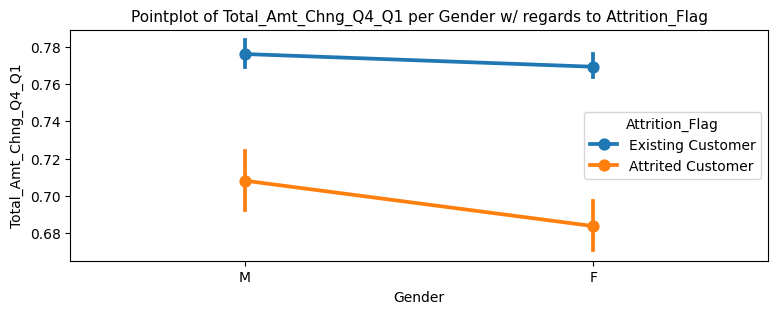

In [ ]:
# Display the distribution of Total_Amt_Chng_Q4_Q1 per Gender with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Amt_Chng_Q4_Q1', category = 'Gender', target = 'Attrition_Flag', figsize = (9, 3))

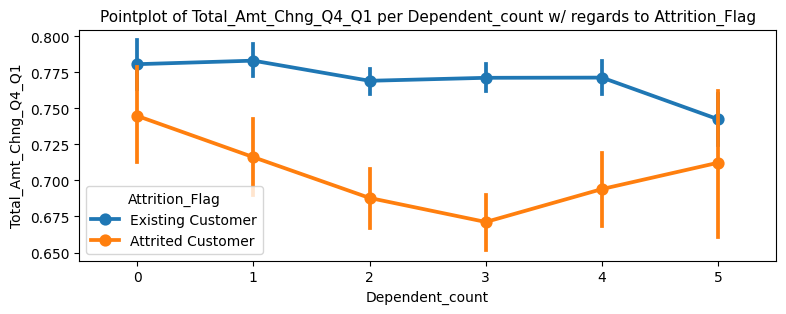

In [ ]:
# Display the distribution of Total_Amt_Chng_Q4_Q1 per Dependent_count with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Amt_Chng_Q4_Q1', category = 'Dependent_count', target = 'Attrition_Flag', figsize = (9, 3))

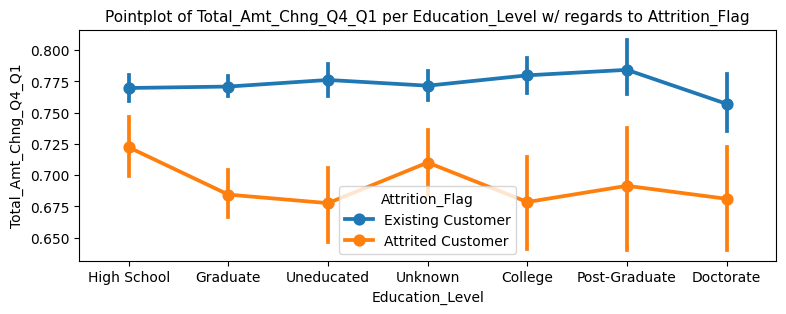

In [ ]:
# Display the distribution of Total_Amt_Chng_Q4_Q1 per Education_Level with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Amt_Chng_Q4_Q1', category = 'Education_Level', target = 'Attrition_Flag', figsize = (9, 3))

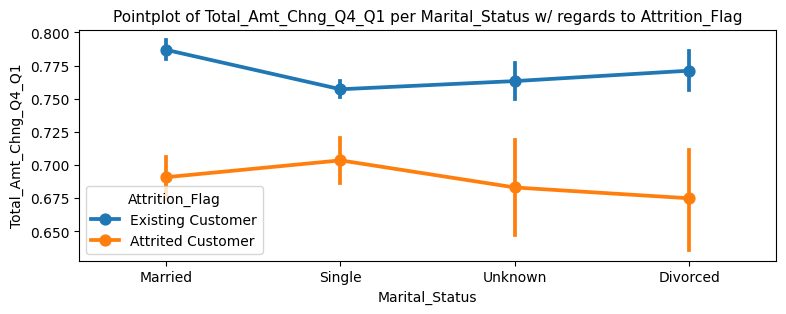

In [ ]:
# Display the distribution of Total_Amt_Chng_Q4_Q1 per Marital_Status with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Amt_Chng_Q4_Q1', category = 'Marital_Status', target = 'Attrition_Flag', figsize = (9, 3))

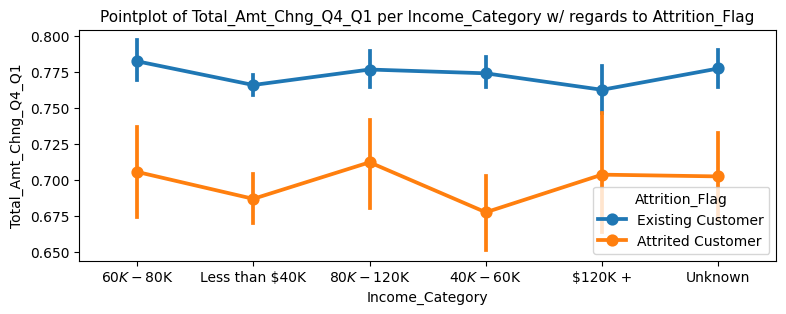

In [ ]:
# Display the distribution of Total_Amt_Chng_Q4_Q1 per Income_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Amt_Chng_Q4_Q1', category = 'Income_Category', target = 'Attrition_Flag', figsize = (9, 3))

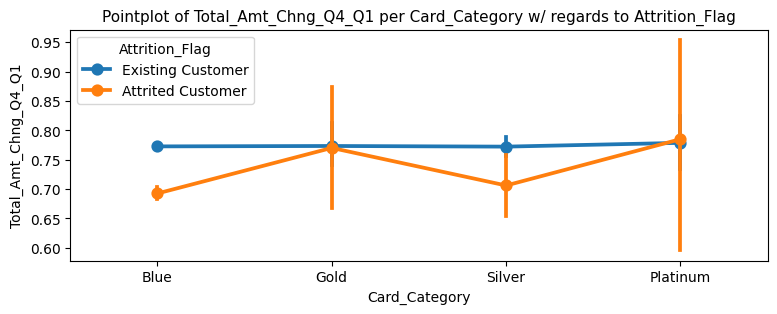

In [ ]:
# Display the distribution of Total_Amt_Chng_Q4_Q1 per Card_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Amt_Chng_Q4_Q1', category = 'Card_Category', target = 'Attrition_Flag', figsize = (9, 3))

**Observations:**
* Total_Amt_Chng_Q4_Q1 shows that the majority of customers who have attrited do have significantly lower total amount change compared to existing customers.
* The median total amount change is \$0.70 for attrited customers.
* The median total amount change is \$0.74 for existing customers.
* There are outliers in total amount change for both attrited and existing customers.

##### Observations on Total_Trans_Amt:

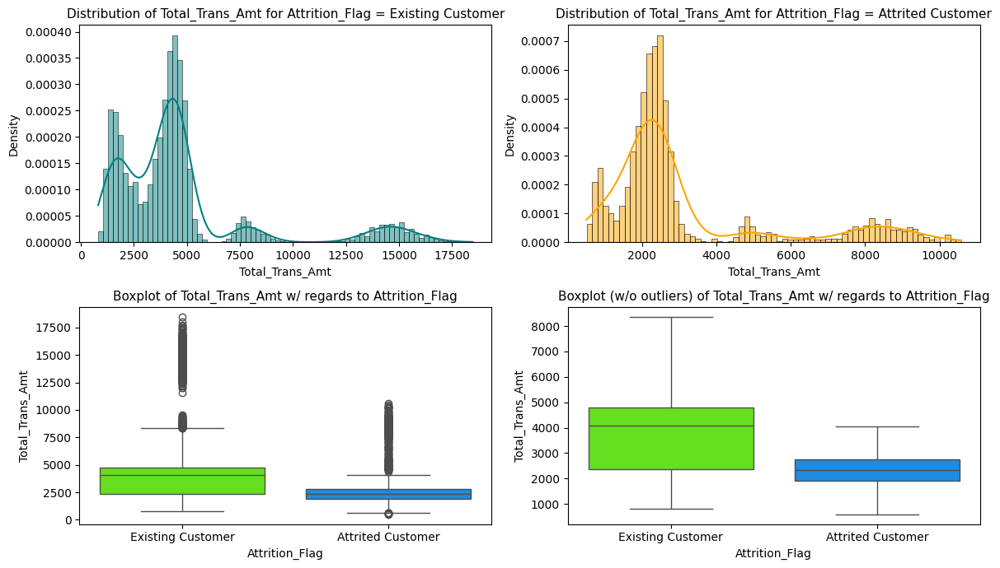

In [ ]:
# Display the distribution of Total_Trans_Amt with regards to Attrition_Flag
show_distplot_boxplot(data = df, feature = 'Total_Trans_Amt', target = 'Attrition_Flag', figsize = (12, 7))

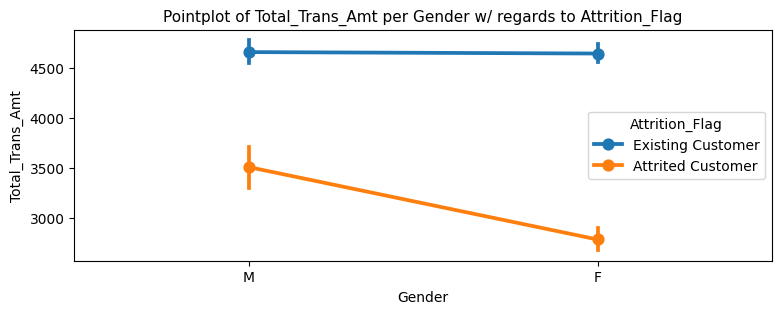

In [ ]:
# Display the distribution of Total_Trans_Amt per Gender with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Trans_Amt', category = 'Gender', target = 'Attrition_Flag', figsize = (9, 3))

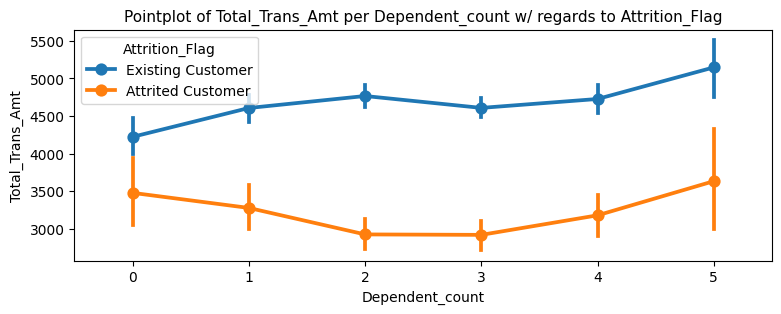

In [ ]:
# Display the distribution of Total_Trans_Amt per Dependent_count with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Trans_Amt', category = 'Dependent_count', target = 'Attrition_Flag', figsize = (9, 3))

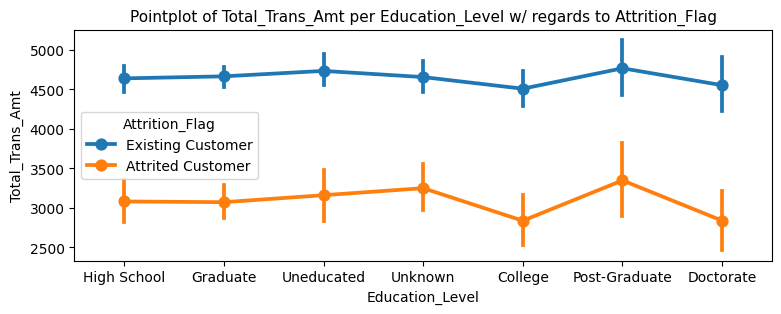

In [ ]:
# Display the distribution of Total_Trans_Amt per Education_Level with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Trans_Amt', category = 'Education_Level', target = 'Attrition_Flag', figsize = (9, 3))

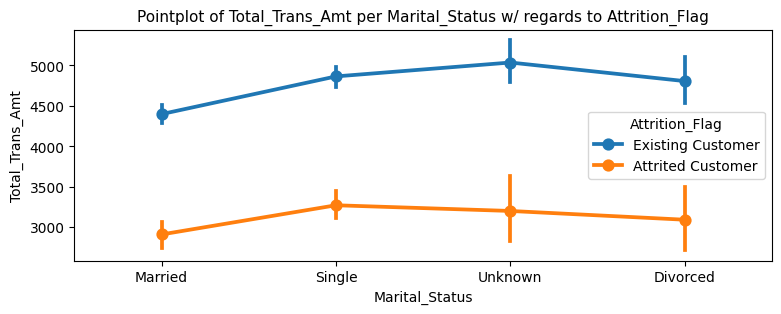

In [ ]:
# Display the distribution of Total_Trans_Amt per Marital_Status with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Trans_Amt', category = 'Marital_Status', target = 'Attrition_Flag', figsize = (9, 3))

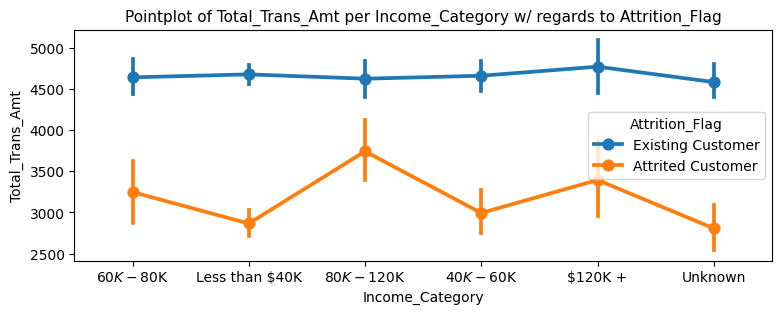

In [ ]:
# Display the distribution of Total_Trans_Amt per Income_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Trans_Amt', category = 'Income_Category', target = 'Attrition_Flag', figsize = (9, 3))

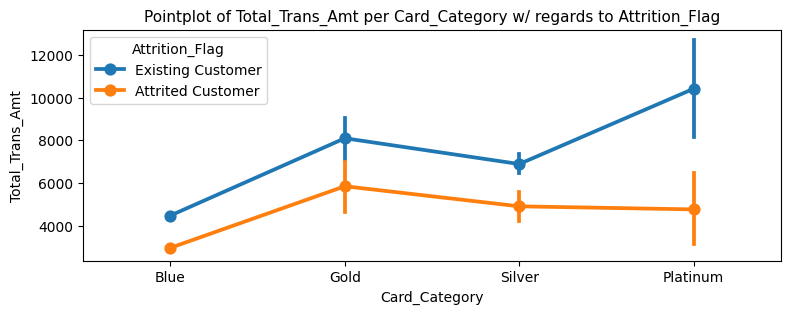

In [ ]:
# Display the distribution of Total_Trans_Amt per Card_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Trans_Amt', category = 'Card_Category', target = 'Attrition_Flag', figsize = (9, 3))

**Observations:**
* Total_Trans_Amt shows that the majority of customers who have attrited do have significantly lower total transaction amount compared to existing customers.
* The median total transaction amount is \$2,329 for attrited customers.
* The median total transaction amount is \$4,100 for existing customers.
* There are outliers in total transaction amount for both attrited and existing customers.

##### Observations on Total_Trans_Ct:

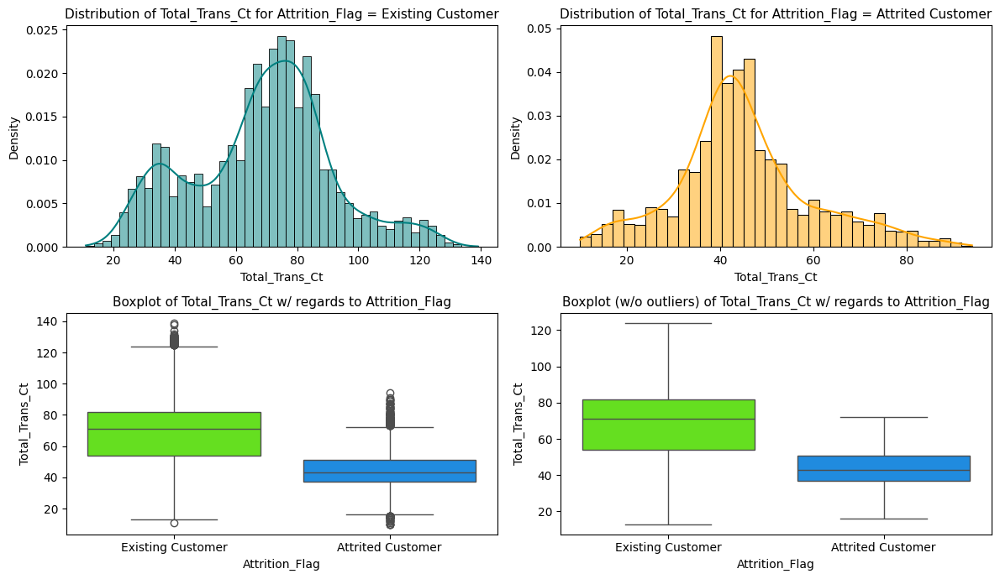

In [ ]:
# Display the distribution of Total_Trans_Ct with regards to Attrition_Flag
show_distplot_boxplot(data = df, feature = 'Total_Trans_Ct', target = 'Attrition_Flag', figsize = (12, 7))

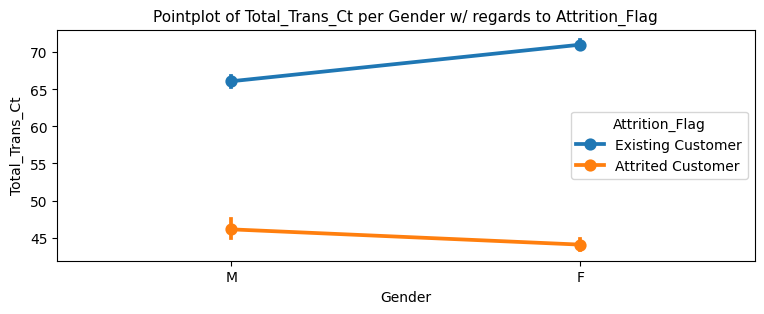

In [ ]:
# Display the distribution of Total_Trans_Ct per Gender with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Trans_Ct', category = 'Gender', target = 'Attrition_Flag', figsize = (9, 3))

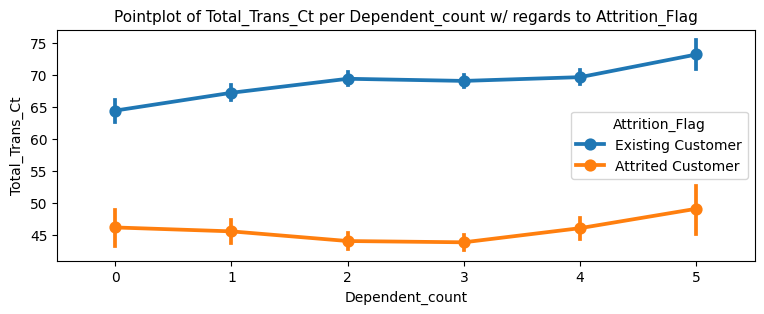

In [ ]:
# Display the distribution of Total_Trans_Ct per Dependent_count with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Trans_Ct', category = 'Dependent_count', target = 'Attrition_Flag', figsize = (9, 3))

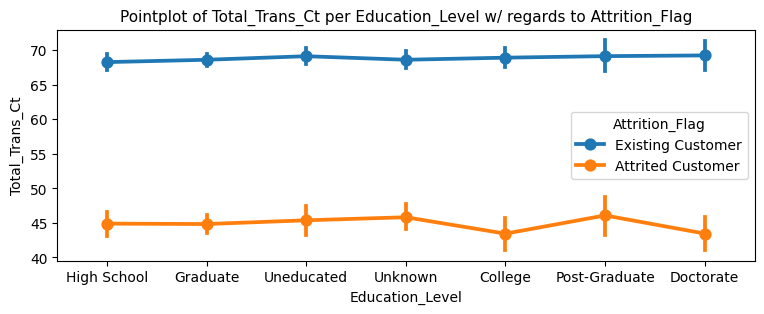

In [ ]:
# Display the distribution of Total_Trans_Ct per Education_Level with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Trans_Ct', category = 'Education_Level', target = 'Attrition_Flag', figsize = (9, 3))

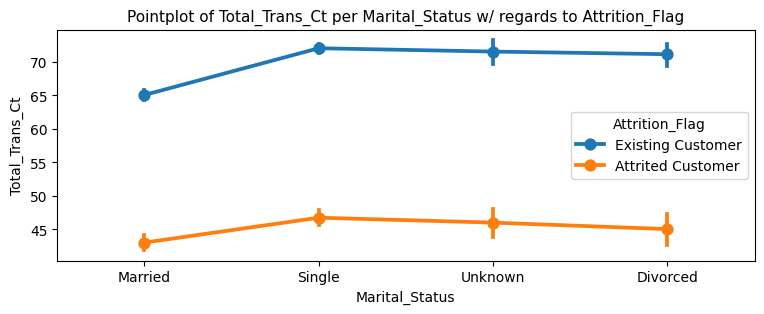

In [ ]:
# Display the distribution of Total_Trans_Ct per Marital_Status with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Trans_Ct', category = 'Marital_Status', target = 'Attrition_Flag', figsize = (9, 3))

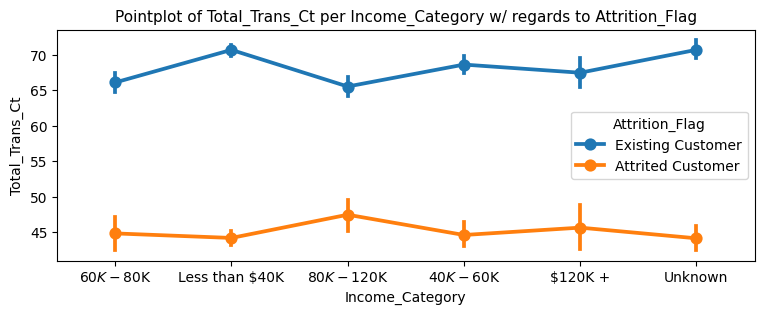

In [ ]:
# Display the distribution of Total_Trans_Ct per Income_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Trans_Ct', category = 'Income_Category', target = 'Attrition_Flag', figsize = (9, 3))

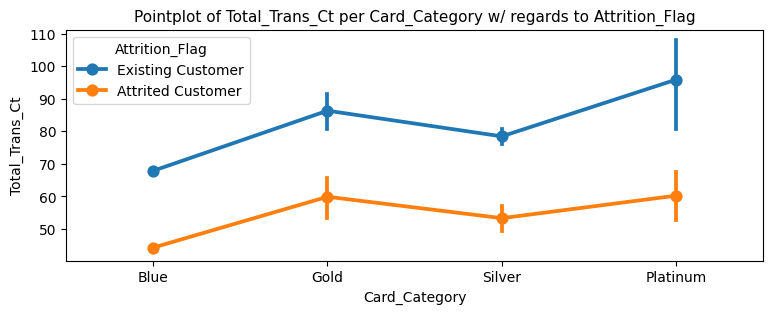

In [ ]:
# Display the distribution of Total_Trans_Ct per Card_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Trans_Ct', category = 'Card_Category', target = 'Attrition_Flag', figsize = (9, 3))

**Observations:**
* Total_Trans_Ct shows that the majority of customers who have attrited do have significantly lower total transaction count compared to existing customers.
* The median total transaction count is 43 for attrited customers.
* The median total transaction count is 71 for existing customers.
* There are outliers in total transaction count for both attrited and existing customers.

##### Observations on Total_Ct_Chng_Q4_Q1:

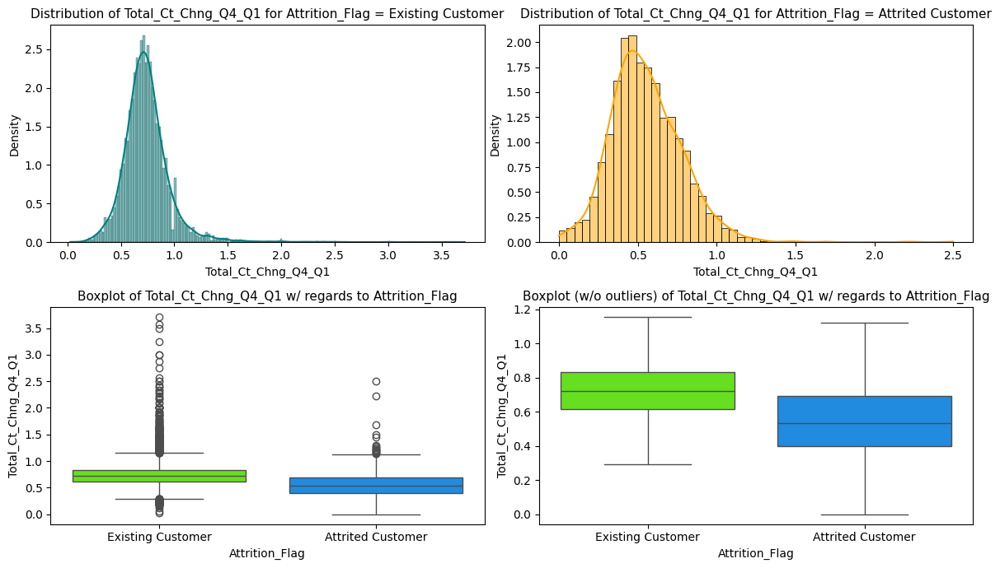

In [ ]:
# Display the distribution of Total_Ct_Chng_Q4_Q1 with regards to Attrition_Flag
show_distplot_boxplot(data = df, feature = 'Total_Ct_Chng_Q4_Q1', target = 'Attrition_Flag', figsize = (12, 7))

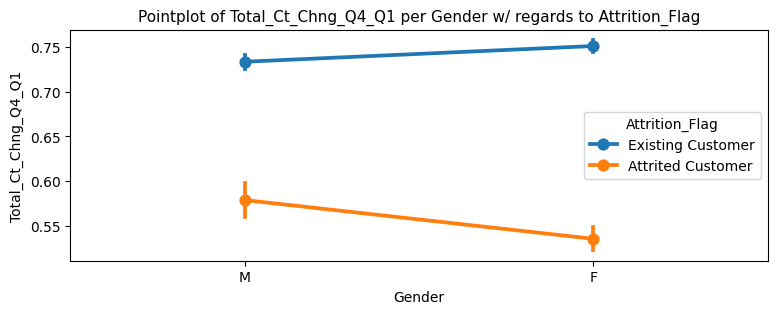

In [ ]:
# Display the distribution of Total_Ct_Chng_Q4_Q1 per Gender with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Ct_Chng_Q4_Q1', category = 'Gender', target = 'Attrition_Flag', figsize = (9, 3))

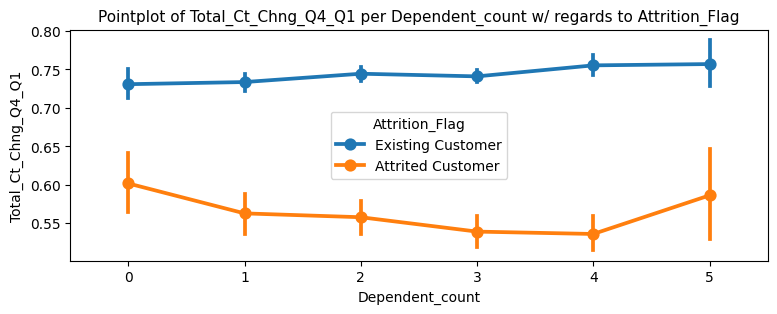

In [ ]:
# Display the distribution of Total_Ct_Chng_Q4_Q1 per Dependent_count with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Ct_Chng_Q4_Q1', category = 'Dependent_count', target = 'Attrition_Flag', figsize = (9, 3))

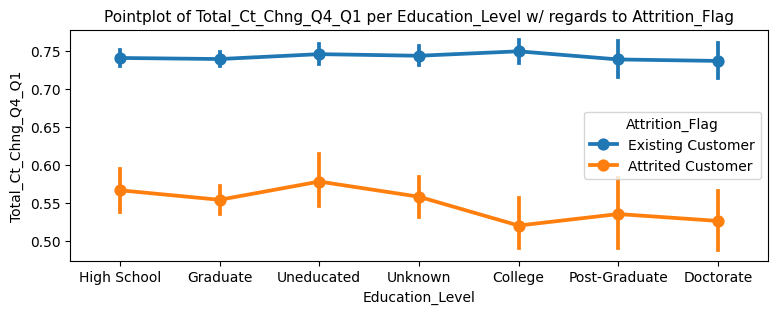

In [ ]:
# Display the distribution of Total_Ct_Chng_Q4_Q1 per Education_Level with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Ct_Chng_Q4_Q1', category = 'Education_Level', target = 'Attrition_Flag', figsize = (9, 3))

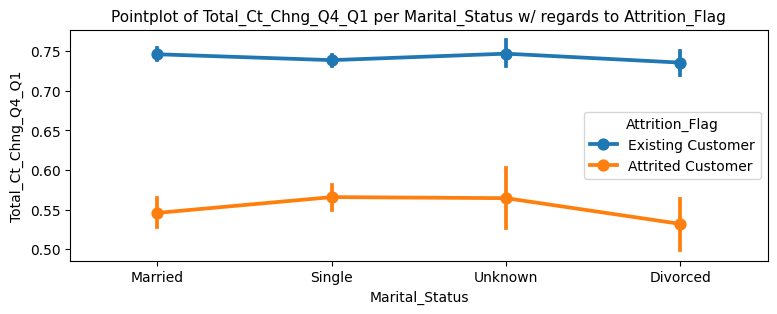

In [ ]:
# Display the distribution of Total_Ct_Chng_Q4_Q1 per Marital_Status with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Ct_Chng_Q4_Q1', category = 'Marital_Status', target = 'Attrition_Flag', figsize = (9, 3))

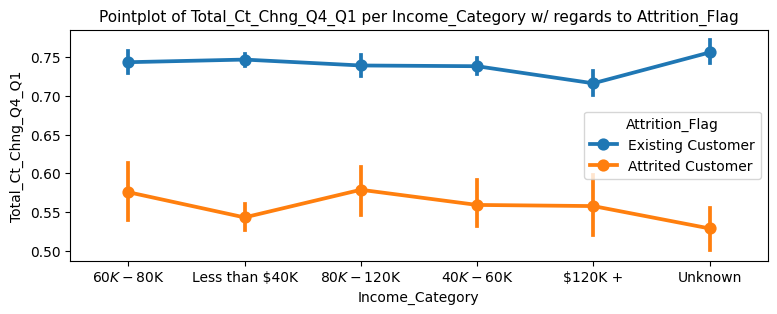

In [ ]:
# Display the distribution of Total_Ct_Chng_Q4_Q1 per Income_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Ct_Chng_Q4_Q1', category = 'Income_Category', target = 'Attrition_Flag', figsize = (9, 3))

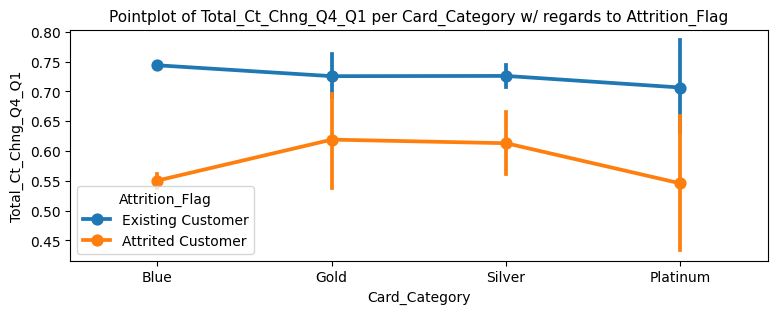

In [ ]:
# Display the distribution of Total_Ct_Chng_Q4_Q1 per Card_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Total_Ct_Chng_Q4_Q1', category = 'Card_Category', target = 'Attrition_Flag', figsize = (9, 3))

**Observations:**
* Total_Ct_Chng_Q4_Q1 shows that the majority of customers who have attrited do have significantly lower total count change compared to existing customers.
* The median total count change is 0.53 for attrited customers.
* The median total count change is 0.72 for existing customers.
* There are outliers in total count change for both attrited and existing customers.

##### Observations on Avg_Utilization_Ratio:

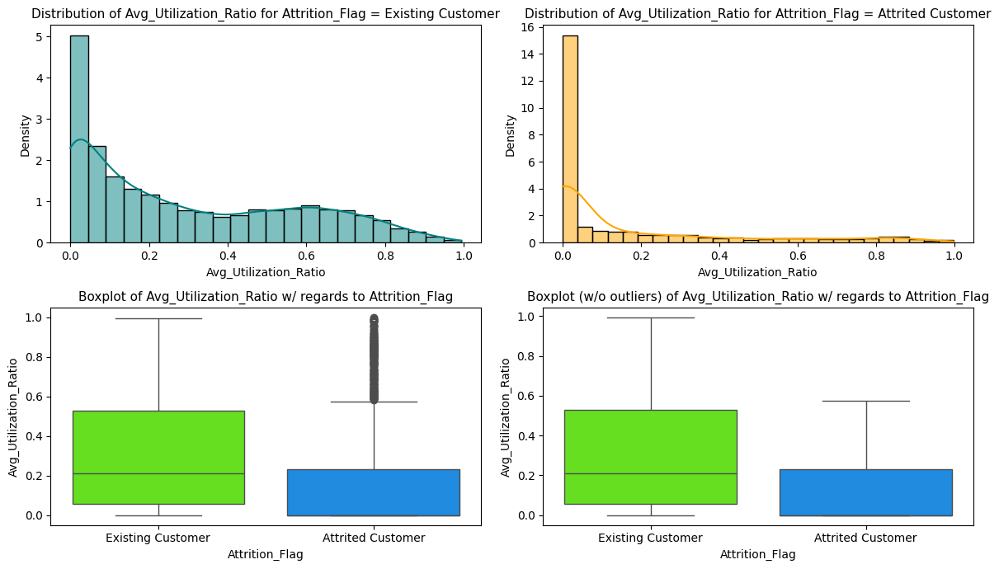

In [ ]:
# Display the distribution of Avg_Utilization_Ratio with regards to Attrition_Flag
show_distplot_boxplot(data = df, feature = 'Avg_Utilization_Ratio', target = 'Attrition_Flag', figsize = (12, 7))

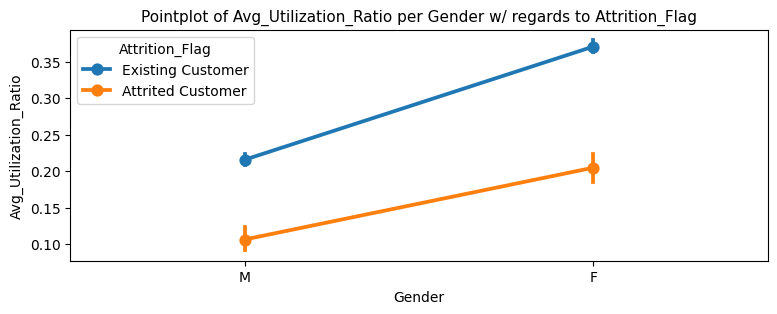

In [ ]:
# Display the distribution of Avg_Utilization_Ratio per Gender with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Avg_Utilization_Ratio', category = 'Gender', target = 'Attrition_Flag', figsize = (9, 3))

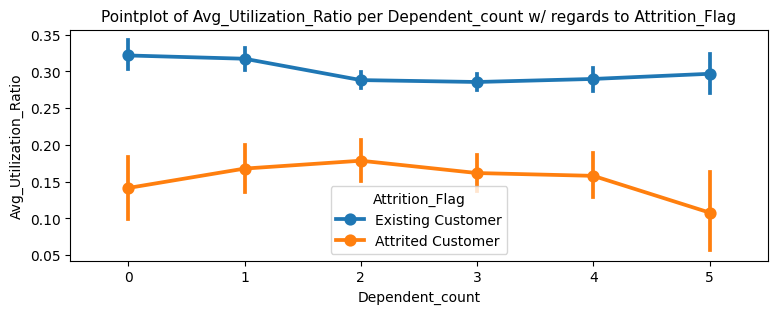

In [ ]:
# Display the distribution of Avg_Utilization_Ratio per Dependent_count with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Avg_Utilization_Ratio', category = 'Dependent_count', target = 'Attrition_Flag', figsize = (9, 3))

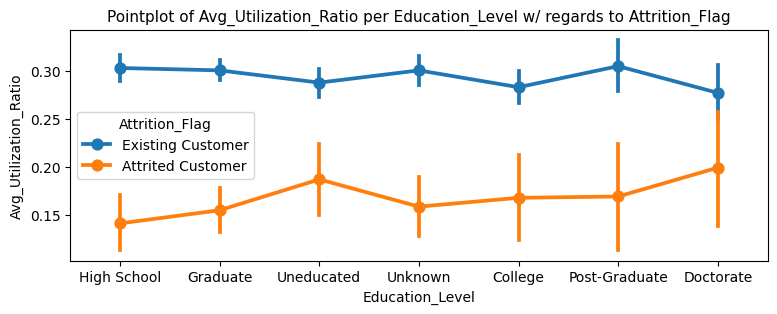

In [ ]:
# Display the distribution of Avg_Utilization_Ratio per Education_Level with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Avg_Utilization_Ratio', category = 'Education_Level', target = 'Attrition_Flag', figsize = (9, 3))

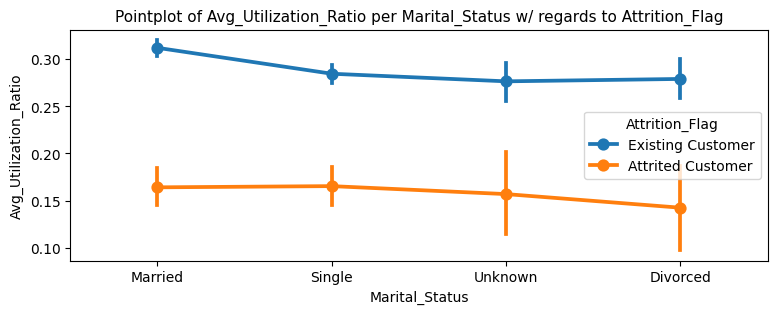

In [ ]:
# Display the distribution of Avg_Utilization_Ratio per Marital_Status with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Avg_Utilization_Ratio', category = 'Marital_Status', target = 'Attrition_Flag', figsize = (9, 3))

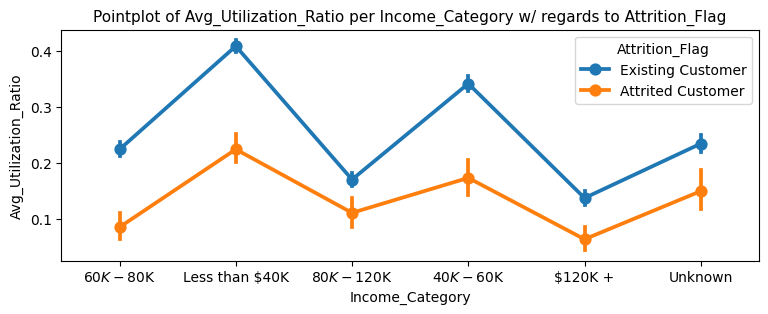

In [ ]:
# Display the distribution of Avg_Utilization_Ratio per Income_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Avg_Utilization_Ratio', category = 'Income_Category', target = 'Attrition_Flag', figsize = (9, 3))

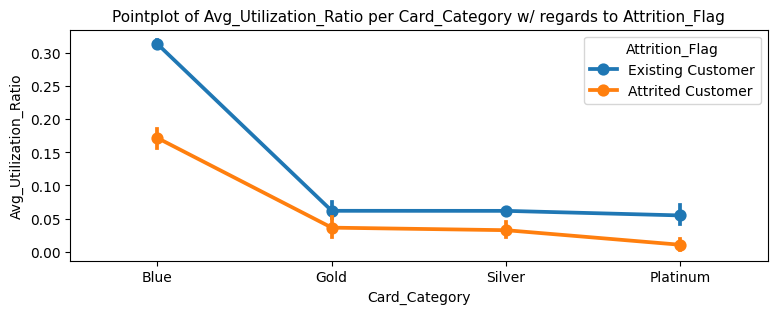

In [ ]:
# Display the distribution of Avg_Utilization_Ratio per Card_Category with regards to Attrition_Flag
show_pointplot(data = df, feature = 'Avg_Utilization_Ratio', category = 'Card_Category', target = 'Attrition_Flag', figsize = (9, 3))

**Observations:**
* Avg_Utilization_Ratio shows that the majority of customers who have attrited do have significantly lower average utilization ratio compared to existing customers.
* The median average utilization ratio is 0.0 for attrited customers.
* The median average utilization ratio is 0.2 for existing customers.
* There are outliers in average utilization ratio only for attrited customers.


##### Observations on Gender:

Attrition_Flag,Attrited Customer,Existing Customer,All
Gender,,,
F,930,4428,5358
M,697,4072,4769
All,1627,8500,10127


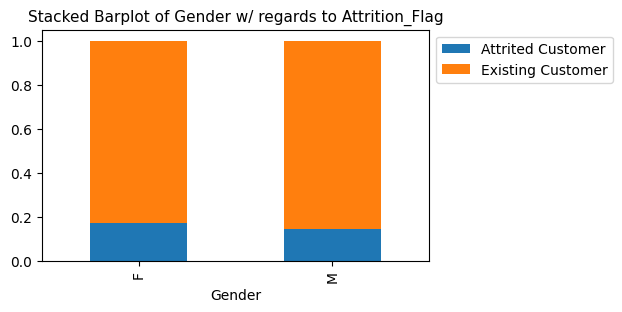

In [ ]:
# Display the distribution of Gender with regards to Attrition_Flag
show_stackedbarplot(data = df, feature = 'Gender', target = 'Attrition_Flag')

**Observations:**
* Gender shows higher percentage of customers have attrited with female gender (with 17.35%) compared to customers with male gender (with 14.62%).

##### Observations on Dependent_count:

Attrition_Flag,Attrited Customer,Existing Customer,All
Dependent_count,,,
0,135,769,904
1,269,1569,1838
2,417,2238,2655
3,482,2250,2732
4,260,1314,1574
5,64,360,424
All,1627,8500,10127


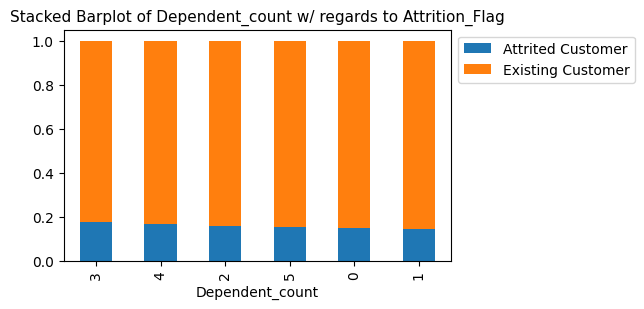

In [ ]:
# Display the distribution of Dependent_count with regards to Attrition_Flag
show_stackedbarplot(data = df, feature = 'Dependent_count', target = 'Attrition_Flag')

**Observations:**
* Dependent_count shows higher percentage of customers have attrited with dependent count of 3 (with 17.64%). List is followed by:
  * Dependent count of 4 (with 16.52%)
  * Dependent count of 2 (with 15.71%)
  * Dependent count of 5 (with 15.09%)
  * Dependent count of 0 (with 14.93%)
  * Dependent count of 1 (with 14.63%)

##### Observations on Education_Level:

Attrition_Flag,Attrited Customer,Existing Customer,All
Education_Level,,,
College,154,859,1013
Doctorate,95,356,451
Graduate,487,2641,3128
High School,306,1707,2013
Post-Graduate,92,424,516
Uneducated,237,1250,1487
Unknown,256,1263,1519
All,1627,8500,10127


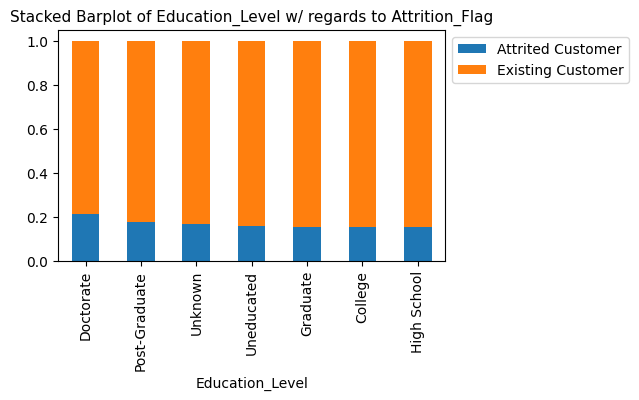

In [ ]:
# Display the distribution of Education_Level with regards to Attrition_Flag
show_stackedbarplot(data = df, feature = 'Education_Level', target = 'Attrition_Flag')

**Observations:**
* Education_Level shows higher percentage of customers have attrited with education level Doctorate (with 21.06%). List is followed by:
  * Education level Post-Graduate (with 17.83%)
  * Unknown (with 16.85%)
  * Education level Uneducated (with 15.94%)
  * Education level Graduate (with 15.57%)
  * Education level College (with 15.20%)
  * Education level High School (with 15.20%)

##### Observations on Marital_Status:

Attrition_Flag,Attrited Customer,Existing Customer,All
Marital_Status,,,
Divorced,121,627,748
Married,709,3978,4687
Single,668,3275,3943
Unknown,129,620,749
All,1627,8500,10127


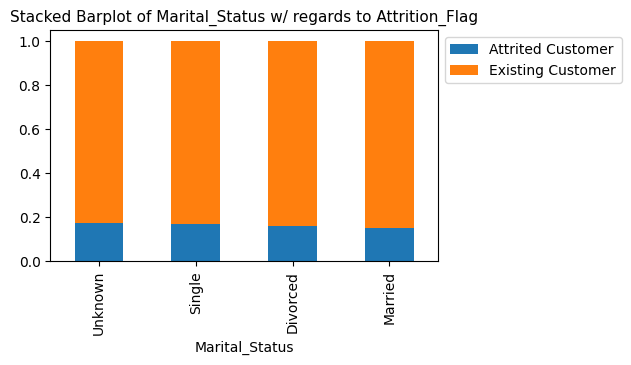

In [ ]:
# Display the distribution of Marital_Status with regards to Attrition_Flag
show_stackedbarplot(data = df, feature = 'Marital_Status', target = 'Attrition_Flag')

**Observations:**
* Marital_Status shows higher percentage of customers have attrited with marital status Unknown (with 17.22%). List is followed by:
  * Marital status Single (with 16.94%)
  * Marital status Divorced (with 16.18%)
  * Marital status Married (with 15.13%)

##### Observations on Income_Category:

Attrition_Flag,Attrited Customer,Existing Customer,All
Income_Category,,,
$120K +,126,601,727
$40K - $60K,271,1519,1790
$60K - $80K,189,1213,1402
$80K - $120K,242,1293,1535
Less than $40K,612,2949,3561
Unknown,187,925,1112
All,1627,8500,10127


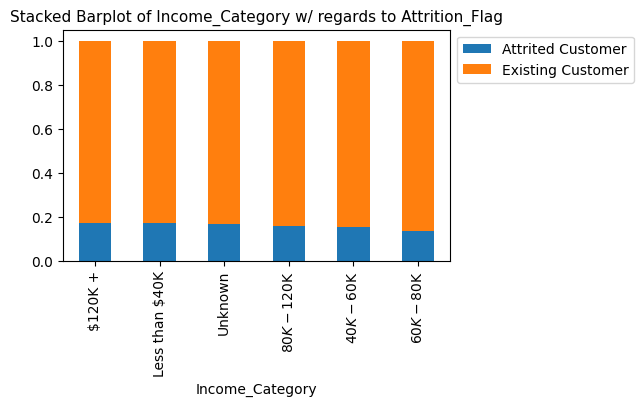

In [ ]:
# Display the distribution of Income_Category with regards to Attrition_Flag
show_stackedbarplot(data = df, feature = 'Income_Category', target = 'Attrition_Flag')

**Observations:**
* Income_Category shows higher percentage of customers have attrited with income category \$120K + (with 17.33%). List is followed by:
  * Income category Less than \$40K (with 17.19%)
  * Income category Unknown (with 16.82%)
  * Income category \$80K - \$120K (with 15.77%)
  * Income category \$40K - \$60K (with 15.14%)
  * Income category \$60K - \$80K (with 13.48%)

##### Observations on Card_Category:

Attrition_Flag,Attrited Customer,Existing Customer,All
Card_Category,,,
Blue,1519,7917,9436
Gold,21,95,116
Platinum,5,15,20
Silver,82,473,555
All,1627,8500,10127


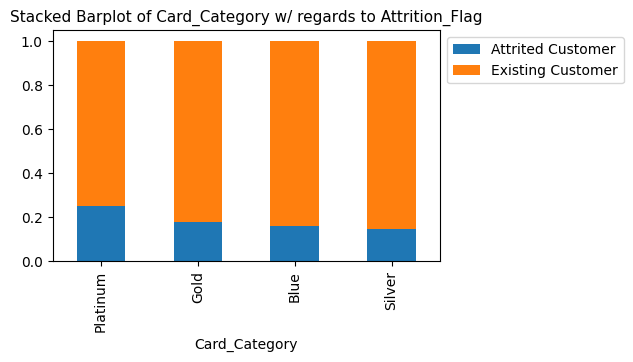

In [ ]:
# Display the distribution of Card_Category with regards to Attrition_Flag
show_stackedbarplot(data = df, feature = 'Card_Category', target = 'Attrition_Flag')

**Observations:**
* Card_Category shows higher percentage of customers have attrited with card category Platinum (with 25.00%). List is followed by:
  * Card category Gold (with 18.10%)
  * Card category Blue (with 16.10%)
  * Card category Silver (with 14.77%)

##### Observations on Chi-Square Test:

In [ ]:
# Display the significance of each feature with regards to Attrition_Flag
show_significance(data = df[cat_cols + num_cols], target = 'Attrition_Flag')

* Gender score has an effect on Attrition_Flag as the p_value 0.0 < significance_level 0.05
  Dependent_count score has no effect on Attrition_Flag as the p_value 0.092 >= significance_level 0.05
  Education_Level score has no effect on Attrition_Flag as the p_value 0.051 >= significance_level 0.05
  Marital_Status score has no effect on Attrition_Flag as the p_value 0.109 >= significance_level 0.05
* Income_Category score has an effect on Attrition_Flag as the p_value 0.025 < significance_level 0.05
  Card_Category score has no effect on Attrition_Flag as the p_value 0.525 >= significance_level 0.05
* Customer_Age score has an effect on Attrition_Flag as the p_value 0.021 < significance_level 0.05
  Months_on_book score has no effect on Attrition_Flag as the p_value 0.057 >= significance_level 0.05
* Total_Relationship_Count score has an effect on Attrition_Flag as the p_value 0.0 < significance_level 0.05
* Months_Inactive_12_mon score has an effect on Attrition_Flag as the p_value 0

**Observations:**
* The following columns show a significant correlation with Attrition_Flag using the Chi-Square test:
  * Gender
  * Income_Category
  * Customer_Age
  * Total_Relationship_Count
  * Months_Inactive_12_mon
  * Contacts_Count_12_mon
  * Total_Revolving_Bal
  * Total_Amt_Chng_Q4_Q1
  * Total_Trans_Amt
  * Total_Trans_Ct
  * Total_Ct_Chng_Q4_Q1
  * Avg_Utilization_Ratio
* All other columns shows no significant correlation with Attrition_Flag.

### Key Observations on Exploratory Data Analysis

In [ ]:
# Display the statistical summary of all columns for attrited customer
df[df['Attrition_Flag'] == 'Attrited Customer'].describe(include = 'all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CLIENTNUM,1627.00000,NaN,NaN,NaN,735261381.26368,35577253.36048,708083283.00000,712371258.00000,716564433.00000,768373683.00000,828294933.00000
Attrition_Flag,1627,1,Attrited Customer,1627,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,1627.00000,NaN,NaN,NaN,46.65950,7.66565,26.00000,41.00000,47.00000,52.00000,68.00000
Gender,1627,2,F,930,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,1627.00000,NaN,NaN,NaN,2.40258,1.27501,0.00000,2.00000,2.00000,3.00000,5.00000
Education_Level,1627,7,Graduate,487,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,1627,4,Married,709,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,1627,6,Less than $40K,612,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,1627,4,Blue,1519,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,1627.00000,NaN,NaN,NaN,36.17824,7.79655,13.00000,32.00000,36.00000,40.00000,56.00000


In [ ]:
# Display the statistical summary of all columns for existing customer
df[df['Attrition_Flag'] == 'Existing Customer'].describe(include = 'all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CLIENTNUM,8500.00000,NaN,NaN,NaN,739927217.88529,37107226.53691,708082083.00000,713219658.00000,718164333.00000,778341539.25000,828343083.00000
Attrition_Flag,8500,1,Existing Customer,8500,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,8500.00000,NaN,NaN,NaN,46.26212,8.08116,26.00000,41.00000,46.00000,52.00000,73.00000
Gender,8500,2,F,4428,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,8500.00000,NaN,NaN,NaN,2.33541,1.30323,0.00000,1.00000,2.00000,3.00000,5.00000
Education_Level,8500,7,Graduate,2641,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,8500,4,Married,3978,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,8500,6,Less than $40K,2949,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,8500,4,Blue,7917,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,8500.00000,NaN,NaN,NaN,35.88059,8.02181,13.00000,31.00000,36.00000,40.00000,56.00000


* As observed during visualizations and in Chi-Square test, the following columns show a significant correlation with Attrition_Flag:
  * Gender
  * Income_Category
  * Customer_Age
  * Total_Relationship_Count
  * Months_Inactive_12_mon
  * Contacts_Count_12_mon
  * Total_Revolving_Bal
  * Total_Amt_Chng_Q4_Q1
  * Total_Trans_Amt
  * Total_Trans_Ct
  * Total_Ct_Chng_Q4_Q1
  * Avg_Utilization_Ratio
* Total_Trans_Ct shows that the majority of customers who have attrited do have significantly lower total transaction count (mean value close to 44) compared to existing customers (mean value close to 68).
* Total_Trans_Amt shows that the majority of customers who have attrited do have significantly lower total transaction amount (mean value close to \$3,095) compared to existing customers (mean value close to \$4,654).
* Total_Revolving_Bal shows that the majority of customers who have attrited do have significantly lower total revolving balance (mean value close to \$672) compared to existing customers (mean value close to \$1,256).
* Total_Relationship_Count shows that the majority of customers who have attrited do have significantly lower total relationship count (mean value close to 3.28) compared to existing customers (mean value close to 3.91).
* Total_Ct_Chng_Q4_Q1 shows that the majority of customers who have attrited do have significantly lower total count change (mean value close to 0.55) compared to existing customers (mean value close to 0.74).
* Total_Amt_Chng_Q4_Q1 shows that the majority of customers who have attrited do have significantly lower total amount change (mean value close to \$0.69) compared to existing customers (mean value close to \$0.77).
* Credit_Limit and Avg_Open_To_Buy show a perfect positive correlation (1.00).
* Total_Trans_Amt and Total_Trans_Ct show a strong positive correlation (0.81).
* Customer_Age and Months_on_Book also show a strong positive correlation (0.79).
* Total_Trans_Amt and Total_Trans_Ct are lower for customers who have attrited.
* Total_Amt_Chng_Q4_Q1 and Total_Ct_Chng_Q4_Q1 are slightly lower for customers who have attrited.
* The following columns contain outliers:
  * Customer_Age,
  * Months_on_book
  * Months_Inactive_12_mon
  * Contacts_Count_12_mon
  * Credit_Limit
  * Avg_Open_To_Buy
  * Total_Amt_Chng_Q4_Q1
  * Total_Trans_Amt
  * Total_Trans_Ct
  * Total_Ct_Chng_Q4_Q1

## Data Preprocessing

### Function Definition

In [ ]:
# User-defined functions
def show_boxplot_outliers(data, num_cols, figsize = (10, 10)):
  '''
  Description: Function to plot multiple boxplot to display the outliers
  Parameters:
    data: pandas.core.frame.DataFrame, required
      The DataFrame of the two-dimensional tabular data
    num_cols: list, required
      The column names of numeric columns
    figsize: tuple, optional
      The figure size in inches, default: (10, 10)
  '''
  plt.figure(figsize = figsize)

  for i, variable in enumerate(num_cols):
      plt.subplot(4, 4, i + 1)
      plt.boxplot(data[variable], whis = 1.5)
      plt.tight_layout()
      plt.title(variable)

  plt.show()

### Outlier Detection

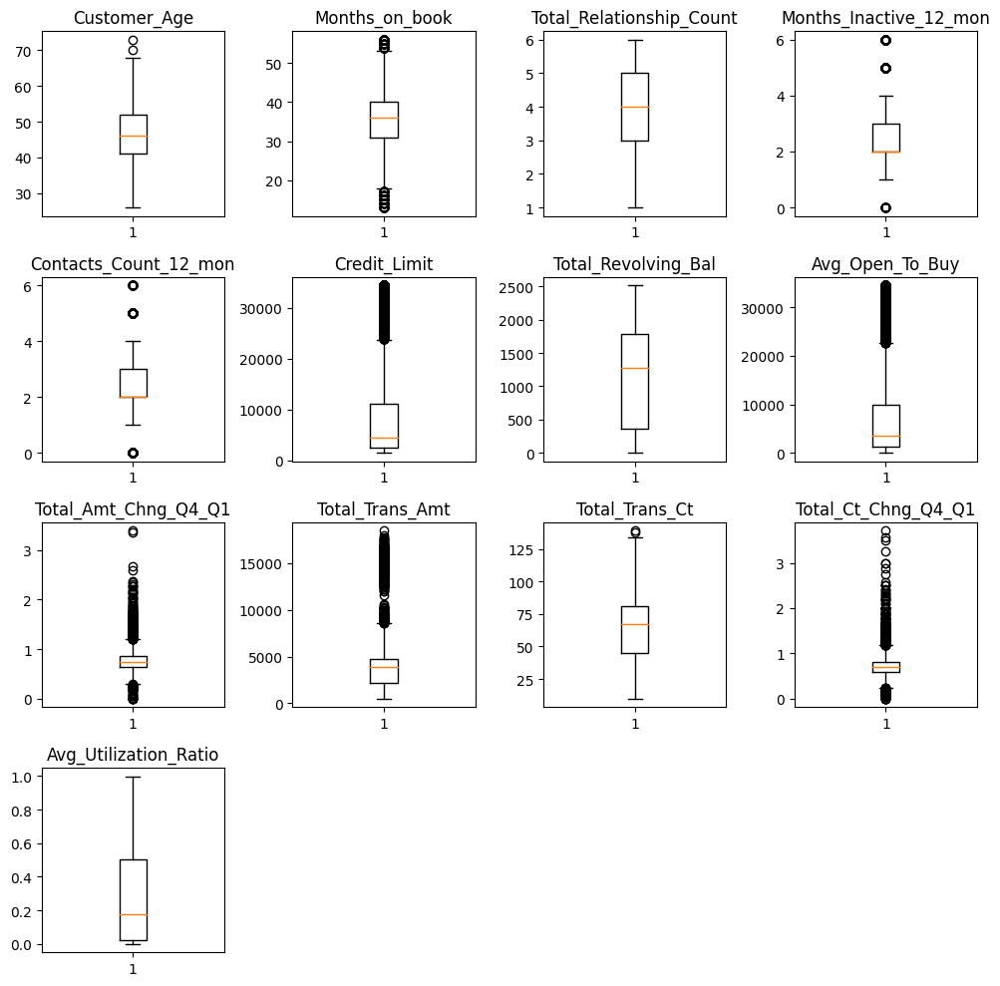

In [ ]:
# Display if there are outliers in the numerical columns
show_boxplot_outliers(data = df, num_cols = num_cols)

**Observations:**
* The following columns contain outliers:
  * Customer_Age,
  * Months_on_book
  * Months_Inactive_12_mon
  * Contacts_Count_12_mon
  * Credit_Limit
  * Avg_Open_To_Buy
  * Total_Amt_Chng_Q4_Q1
  * Total_Trans_Amt
  * Total_Trans_Ct
  * Total_Ct_Chng_Q4_Q1
* These outliers will not be treated as they are considered valid values.

### Data Preparation

In [ ]:
# Create a copy of the DataFrame for modeling
df_modeling = df.copy()

In [ ]:
# # Replace dependent variable string values to integer
if 'Attrition_Flag' in df_modeling.dtypes:
  df_modeling['Attrition_Flag'].replace('Existing Customer', 0, inplace = True)
  df_modeling['Attrition_Flag'].replace('Attrited Customer', 1, inplace = True)

In [ ]:
# Drop columns that are not needed in the analysis
if 'CLIENTNUM' in df_modeling.dtypes:
  df_modeling = df_modeling.drop('CLIENTNUM', axis = 1)

In [ ]:
# Create independent variable
if 'Attrition_Flag' in df_modeling.dtypes:
  x = df_modeling.drop('Attrition_Flag', axis = 1)

In [ ]:
# Create dependent variable
if 'Attrition_Flag' in df.dtypes:
  y = df_modeling.pop('Attrition_Flag')

In [ ]:
# Split the training, testing, and validation data
x_temp, x_test, y_temp, y_test = sms.train_test_split(x, y, test_size = 0.20, random_state = 1, stratify = y)

x_train, x_val, y_train, y_val = sms.train_test_split(x_temp, y_temp, test_size = 0.25, random_state = 1, stratify = y_temp)

In [ ]:
# Create imputer and fit, transform the missing (unknown) values
sim = imp.SimpleImputer(strategy = 'most_frequent', missing_values = 'Unknown')

cat_cols_imp = ['Education_Level', 'Marital_Status', 'Income_Category']

In [ ]:
# Display the count of unique categorical values in each column of training data before imputation
for cat_col_imp in cat_cols_imp:
  print(x_train[cat_col_imp].value_counts(dropna = False))
  print('-' * 50)

Graduate         1854
High School      1228
Unknown           928
Uneducated        881
College           618
Post-Graduate     312
Doctorate         254
Name: Education_Level, dtype: int64
--------------------------------------------------
Married     2819
Single      2369
Unknown      457
Divorced     430
Name: Marital_Status, dtype: int64
--------------------------------------------------
Less than $40K    2129
$40K - $60K       1059
$80K - $120K       953
$60K - $80K        831
Unknown            654
$120K +            449
Name: Income_Category, dtype: int64
--------------------------------------------------


In [ ]:
# Display the count of unique categorical values in each column of validation data before imputation
for cat_col_imp in cat_cols_imp:
  print(x_val[cat_col_imp].value_counts(dropna = False))
  print('-' * 50)

Graduate         623
High School      404
Uneducated       306
Unknown          294
College          199
Post-Graduate    101
Doctorate         99
Name: Education_Level, dtype: int64
--------------------------------------------------
Married     960
Single      770
Divorced    156
Unknown     140
Name: Marital_Status, dtype: int64
--------------------------------------------------
Less than $40K    736
$40K - $60K       361
$80K - $120K      293
$60K - $80K       279
Unknown           221
$120K +           136
Name: Income_Category, dtype: int64
--------------------------------------------------


In [ ]:
# Display the count of unique categorical values in each column of testing data before imputation
for cat_col_imp in cat_cols_imp:
  print(x_test[cat_col_imp].value_counts(dropna = False))
  print('-' * 50)

Graduate         651
High School      381
Uneducated       300
Unknown          297
College          196
Post-Graduate    103
Doctorate         98
Name: Education_Level, dtype: int64
--------------------------------------------------
Married     908
Single      804
Divorced    162
Unknown     152
Name: Marital_Status, dtype: int64
--------------------------------------------------
Less than $40K    696
$40K - $60K       370
$60K - $80K       292
$80K - $120K      289
Unknown           237
$120K +           142
Name: Income_Category, dtype: int64
--------------------------------------------------


In [ ]:
# Fit and transform the training data
x_train[cat_cols_imp] = sim.fit_transform(x_train[cat_cols_imp])

# Transform the validation and testing data
x_val[cat_cols_imp] = sim.transform(x_val[cat_cols_imp])
x_test[cat_cols_imp] = sim.transform(x_test[cat_cols_imp])

In [ ]:
# Display the count of unique categorical values in each column of training data after imputation
for cat_col_imp in cat_cols_imp:
  print(x_train[cat_col_imp].value_counts(dropna = False))
  print('-' * 50)

Graduate         2782
High School      1228
Uneducated        881
College           618
Post-Graduate     312
Doctorate         254
Name: Education_Level, dtype: int64
--------------------------------------------------
Married     3276
Single      2369
Divorced     430
Name: Marital_Status, dtype: int64
--------------------------------------------------
Less than $40K    2783
$40K - $60K       1059
$80K - $120K       953
$60K - $80K        831
$120K +            449
Name: Income_Category, dtype: int64
--------------------------------------------------


In [ ]:
# Display the count of unique categorical values in each column of validation data after imputation
for cat_col_imp in cat_cols_imp:
  print(x_val[cat_col_imp].value_counts(dropna = False))
  print('-' * 50)

Graduate         917
High School      404
Uneducated       306
College          199
Post-Graduate    101
Doctorate         99
Name: Education_Level, dtype: int64
--------------------------------------------------
Married     1100
Single       770
Divorced     156
Name: Marital_Status, dtype: int64
--------------------------------------------------
Less than $40K    957
$40K - $60K       361
$80K - $120K      293
$60K - $80K       279
$120K +           136
Name: Income_Category, dtype: int64
--------------------------------------------------


In [ ]:
# Display the count of unique categorical values in each column of testing data after imputation
for cat_col_imp in cat_cols_imp:
  print(x_test[cat_col_imp].value_counts(dropna = False))
  print('-' * 50)

Graduate         948
High School      381
Uneducated       300
College          196
Post-Graduate    103
Doctorate         98
Name: Education_Level, dtype: int64
--------------------------------------------------
Married     1060
Single       804
Divorced     162
Name: Marital_Status, dtype: int64
--------------------------------------------------
Less than $40K    933
$40K - $60K       370
$60K - $80K       292
$80K - $120K      289
$120K +           142
Name: Income_Category, dtype: int64
--------------------------------------------------


In [ ]:
# Encode the categorical variables of training, testing, and testing data
x_train = pd.get_dummies(x_train, drop_first = True)
x_test = pd.get_dummies(x_test, drop_first = True)
x_val = pd.get_dummies(x_val, drop_first = True)

In [ ]:
# Display the shape of training data
x_train.shape

(6075, 29)

In [ ]:
# Display the shape of testing data
x_test.shape

(2026, 29)

In [ ]:
# Display the shape of validation data
x_val.shape

(2026, 29)

In [ ]:
# Display the percentage of classes in training data
y_train.value_counts(normalize = True, dropna = False).mul(100)

0   83.93416
1   16.06584
Name: Attrition_Flag, dtype: float64

In [ ]:
# Display the percentage of classes in testing data
y_test.value_counts(normalize = True, dropna = False).mul(100)

0   83.95854
1   16.04146
Name: Attrition_Flag, dtype: float64

In [ ]:
# Display the percentage of classes in validation data
y_val.value_counts(normalize = True, dropna = False).mul(100)

0   83.90918
1   16.09082
Name: Attrition_Flag, dtype: float64

**Observations:**
* The training set has a shape of 6,075 rows with 29 columns, while the validation and testing sets have a shape of 2,026 rows with 29 columns.
* The training set was imputed using mode and now contains the following:
  * Education level Graduate increased by 928 (from 1,854 to 2,782). No changes to other categories.
  * Marital status Married increased by 457 (from 2,819 to 3,276). No changes to other categories.
  * Income category Less than \$40K increased by 654 (from 2,129 to 2,783). No changes to other categories.
* The validation set was imputed using mode and now contains the following:
  * Education level Graduate increased by 294 (from 623 to 917). No changes to other categories.
  * Marital status Married increased by 140 (from 960 to 1,100). No changes to other categories.
  * Income category Less than \$40K increased by 221 (from 736 to 957). No changes to other categories.
* The testing set was imputed using mode and now contains the following:
  * Education level Graduate increased by 297 (from 651 to 948). No changes to other categories.
  * Marital status Married increased by 152 (from 908 to 1,060). No changes to other categories.
  * Income category Less than \$40K increased by 237 (from 696 to 933). No changes to other categories.
* Imputation using most the frequent strategy shows that the missing values (i.e. NaN/ abc/ unknown) got changed to the most frequent value or mode.
* Splitting shows that close to 84% of observations belong to class 0 (existing customers) and around 16% of observations belong to class 1 (attrited customers), and this is preserved in the training, validation and testing sets.

## Model Building

### Function Definition

In [ ]:
# User-defined functions
def get_model_perf_class_sklearn(model, predictors, target):
  '''
  Description: Function to compute different metrics to check classification model performance
  Parameters:
    model: sklearn.tree.DecisionTreeClassifier, required
      The DataFrame of the two-dimensional tabular data
    predictors: pandas.core.frame.DataFrame, required
      The DataFrame of the independent variables
    target: str, required
      The depedent variable
  '''
  # Predict using the independent variables
  pred = model.predict(predictors)

  # Compute accuracy
  acc = smt.accuracy_score(target, pred)

  # Compute recall
  recall = smt.recall_score(target, pred)

  # Compute precision
  precision = smt.precision_score(target, pred)

  # Compute F1-score
  f1 = smt.f1_score(target, pred)

  dc_perf = {'Accuracy': acc, 'Recall': recall, 'Precision': precision, 'F1': f1}

  if hasattr(model, 'best_score_'):
    dc_perf['Best Score'] = model.best_score_

  # Create a DataFrame of metrics
  df_perf = pd.DataFrame(dc_perf, index = [0])

  return df_perf

def show_confusion_matrix_sklearn(model, predictors, target, figsize = (6, 4), title = ''):
  '''
  Description: Function to plot the confusion matrix with percentages
  Parameters:
    model: sklearn.tree.DecisionTreeClassifier, required
      The DataFrame of the two-dimensional tabular data
    predictors: pandas.core.frame.DataFrame, required
      The DataFrame of the independent variables
    target: str, required
      The depedent variable
  '''
  # Predict using the independent variables
  y_pred = model.predict(predictors)

  # Create confusion matrix
  cm = smt.confusion_matrix(target, y_pred)
  labels = np.asarray([
    ['{0:0.0f}'.format(item) + '\n{0:.2%}'.format(item / cm.flatten().sum())]
    for item in cm.flatten()
  ]).reshape(2, 2)

  plt.figure(figsize = figsize)

  ax = sns.heatmap(cm, annot = labels, fmt = '')
  ax.set_title('Confusion Matrix ' + title, fontsize = 11)

  plt.ylabel('True Label')
  plt.xlabel('Predicted Label')

def show_feature_importance(importances, indices, feature_names, figsize = (12, 5)):
  '''
  Description: Function to plot the features in the order of importance
  Parameters:
    importances: sklearn.tree.DecisionTreeClassifier, required
      The DataFrame of the two-dimensional tabular data
    indices: numpy.ndarray, required
      The indices of array
    feature_names: list, required
      The column names of features
  '''
  plt.figure(figsize = figsize)
  plt.title('Feature Importances', fontsize = 11)
  bar_val = plt.barh(range(len(indices)), importances[indices], color = 'violet', align = 'center')
  plt.bar_label(bar_val, padding = 1, fmt = '{:.3f}')
  plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
  plt.xlabel('Relative Importance')

  plt.show()

def show_decision_tree(decision_tree, feature_names, figsize = (20, 10)):
  '''
  Description: Function to plot the features in the order of importance
  Parameters:
    model: sklearn.tree.DecisionTreeClassifier, required
      The DataFrame of the two-dimensional tabular data
    feature_names: list, required
      The column names of features
    figsize: tuple, optional
      The figure size in inches, default: (20, 10)
  '''
  plt.figure(figsize = figsize)
  plt.suptitle('Decision Tree', y = 0.9, size = 17)

  out = ste.plot_tree(decision_tree = decision_tree, feature_names = feature_names, filled = True, fontsize = 9, node_ids = False, class_names = None)

  # Display Decision Tree
  for o in out:
      arrow = o.arrow_patch
      if arrow is not None:
          arrow.set_edgecolor('black')
          arrow.set_linewidth(1)

  plt.show()

def show_model_perf_class_comp(models, x_train_data, y_train_data, x_val_data = None, y_val_data = None, x_test_data = None, y_test_data = None):
  '''
  Description: Function to display different metrics to check classification model performance
  Parameters:
    models: list, required
      The list of classifiers
    x_train_data: pandas.core.frame.DataFrame, required
      The DataFrame of the training independent variables
    y_train_data: pandas.core.frame.DataFrame, required
      The DataFrame of the training dependent variables
    x_val_data: pandas.core.frame.DataFrame, required
      The DataFrame of the validation independent variables
    y_val_data: pandas.core.frame.DataFrame, required
      The DataFrame of the validation dependent variables
    x_test_data: pandas.core.frame.DataFrame, required
      The DataFrame of the testing independent variables
    y_test_data: pandas.core.frame.DataFrame, required
      The DataFrame of the testing dependent variables
  '''
  model_names = []
  model_objs = []

  for model_name, model_obj in models:

    df_model_train = get_model_perf_class_sklearn(model = model_obj, predictors = x_train_data, target = y_train_data)

    model_objs.append(df_model_train.transpose())
    model_names.append(model_name + ' (Training)')

    if not(x_val_data is None) and not(y_val_data is None):
      df_model_val = get_model_perf_class_sklearn(model = model_obj, predictors = x_val_data, target = y_val_data)

      model_objs.append(df_model_val.transpose())
      model_names.append(model_name + ' (Validation)')

    if not(x_test_data is None) and not(y_test_data is None):
      df_model_val = get_model_perf_class_sklearn(model = model_obj, predictors = x_test_data, target = y_test_data)

      model_objs.append(df_model_val.transpose())
      model_names.append(model_name + ' (Testing)')

  model_comps = pd.concat(model_objs, axis = 1)
  model_comps.columns = model_names

  display(model_comps)

### Model Evaluation Criterion

**The nature of predictions made by the classification model will translate as follows:**
* True Positives (TP) are customer attritions correctly predicted by the model.
* False Negatives (FN) are real customer attritions that are not predicted by the model.
* False Positives (FP) are predicted customer attritions where there are no customer attritions.

**Which metric to optimize?**
* We need to choose the metric which will ensure that the maximum number of customer attritions are predicted correctly by the model.
* We would want recall to be maximized as greater the recall, the higher the chances of minimizing False Negatives (FN).
* We want to minimize False Negatives (FN) because if a model predicts that there will be no customer attritions when there will be actual customer attritions, it will be a lost of income for the bank.

### Model Building (Default)

##### Default model using original data

In [ ]:
%%time

# Create default Decision Tree model
model_dt_df_or = ste.DecisionTreeClassifier(random_state = 1)

model_dt_df_or.fit(x_train, y_train)

model_dt_df_or

CPU times: user 59.1 ms, sys: 990 µs, total: 60.1 ms
Wall time: 62.7 ms


DecisionTreeClassifier(random_state=1)

In [ ]:
%%time

# Create default Bagging model
model_bg_df_or = sen.BaggingClassifier(random_state = 1)

model_bg_df_or.fit(x_train, y_train)

model_bg_df_or

CPU times: user 349 ms, sys: 939 µs, total: 350 ms
Wall time: 355 ms


BaggingClassifier(random_state=1)

In [ ]:
%%time

# Create default Random Forest model
model_rf_df_or = sen.RandomForestClassifier(random_state = 1)

model_rf_df_or.fit(x_train, y_train)

model_rf_df_or

CPU times: user 847 ms, sys: 2.74 ms, total: 849 ms
Wall time: 855 ms


RandomForestClassifier(random_state=1)

In [ ]:
%%time

# Create default Ada Boost model
model_ab_df_or = sen.AdaBoostClassifier(random_state = 1)

model_ab_df_or.fit(x_train, y_train)

model_ab_df_or

CPU times: user 400 ms, sys: 1.7 ms, total: 402 ms
Wall time: 402 ms


AdaBoostClassifier(random_state=1)

In [ ]:
%%time

# Create default Gradient Boosting model
model_gb_df_or = sen.GradientBoostingClassifier(random_state = 1)

model_gb_df_or.fit(x_train, y_train)

model_gb_df_or

CPU times: user 1.7 s, sys: 4.5 ms, total: 1.7 s
Wall time: 1.71 s


GradientBoostingClassifier(random_state=1)

In [ ]:
%%time

# Create default XGB model
model_xg_df_or = xgb.XGBClassifier(random_state = 1, eval_metric = 'logloss')

model_xg_df_or.fit(x_train, y_train)

model_xg_df_or

CPU times: user 317 ms, sys: 5.74 ms, total: 323 ms
Wall time: 185 ms


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=1, ...)

##### Observations on default model using original data

In [ ]:
# Create a list of default models using original data
models_df_or = []

models_df_or.append(('Decision Tree', model_dt_df_or))
models_df_or.append(('Bagging', model_bg_df_or))
models_df_or.append(('Random Forest', model_rf_df_or))
models_df_or.append(('Ada Boost', model_ab_df_or))
models_df_or.append(('Gradient Boosting', model_gb_df_or))
models_df_or.append(('XGB', model_xg_df_or))

In [ ]:
# Display the model performance using original training and validation data
show_model_perf_class_comp(models = models_df_or, x_train_data = x_train, x_val_data = x_val, y_train_data = y_train, y_val_data = y_val)

,Decision Tree (Training),Decision Tree (Validation),Bagging (Training),Bagging (Validation),Random Forest (Training),Random Forest (Validation),Ada Boost (Training),Ada Boost (Validation),Gradient Boosting (Training),Gradient Boosting (Validation),XGB (Training),XGB (Validation)
Accuracy,1.00000,0.93880,0.99720,0.95607,1.00000,0.95656,0.95737,0.96199,0.97284,0.96742,1.00000,0.97137
Recall,1.00000,0.81595,0.98566,0.81288,1.00000,0.79755,0.82684,0.85276,0.87500,0.85583,1.00000,0.90184
Precision,1.00000,0.80606,0.99689,0.90444,1.00000,0.92199,0.89967,0.90554,0.95206,0.93624,1.00000,0.91875
F1,1.00000,0.81098,0.99124,0.85622,1.00000,0.85526,0.86172,0.87836,0.91191,0.89423,1.00000,0.91022


**Observations:**
* Building the model with default hyperparameters using original training data, it shows that XGB (with 90.18%) has the highest Recall score against the validation data. List is followed by:
  * Gradient Boosting (with 85.58%)
  * Ada Boost (with 85.28%)
  * Decision Tree (with 81.60%)
  * Bagging  (with 81.29%)
  * Random Forest (with 79.76%)
* Building the model with default hyperparameters using original training data, it shows that Decision Tree (with 62 milliseconds) has the fastest build completion. List is followed by:
  * XGB (with 185 milliseconds)
  * Bagging  (with 355 milliseconds)
  * Ada Boost (with 402 milliseconds)
  * Random Forest (with 855 milliseconds)
  * Gradient Boosting (with 1.7 seconds)


##### Default model using oversampled data

In [ ]:
print('Before oversampling, counts of label 1 (Attrited Customer):', (sum(y_train == 1)))
print('Before oversampling, counts of label 0 (Existing Customer):', (sum(y_train == 0)))

Before oversampling, counts of label 1 (Attrited Customer): 976
Before oversampling, counts of label 0 (Existing Customer): 5099


In [ ]:
# Prepare oversampled data using Synthetic Minority Oversampling Technique (SMOTE)
smo = ios.SMOTE(sampling_strategy = 1, k_neighbors = 5, random_state = 1)
x_train_os, y_train_os = smo.fit_resample(x_train, y_train)

In [ ]:
print('After oversampling, counts of label 1 (Attrited Customer):', (sum(y_train_os == 1)))
print('After oversampling, counts of label 0 (Existing Customer):', (sum(y_train_os == 0)))

After oversampling, counts of label 1 (Attrited Customer): 5099
After Ovoversamplingersampling, counts of label 0 (Existing Customer): 5099


In [ ]:
%%time

# Create default Decision Tree model
model_dt_df_os = ste.DecisionTreeClassifier(random_state = 1)

model_dt_df_os.fit(x_train_os, y_train_os)

model_dt_df_os

CPU times: user 107 ms, sys: 789 µs, total: 108 ms
Wall time: 109 ms


DecisionTreeClassifier(random_state=1)

In [ ]:
%%time

# Create default Bagging model
model_bg_df_os = sen.BaggingClassifier(random_state = 1)

model_bg_df_os.fit(x_train_os, y_train_os)

model_bg_df_os

CPU times: user 624 ms, sys: 1.7 ms, total: 625 ms
Wall time: 628 ms


BaggingClassifier(random_state=1)

In [ ]:
%%time

# Create default Random Forest model
model_rf_df_os = sen.RandomForestClassifier(random_state = 1)

model_rf_df_os.fit(x_train_os, y_train_os)

model_rf_df_os

CPU times: user 1.39 s, sys: 5.29 ms, total: 1.4 s
Wall time: 1.41 s


RandomForestClassifier(random_state=1)

In [ ]:
%%time

# Create default Ada Boost model
model_ab_df_os = sen.AdaBoostClassifier(random_state = 1)

model_ab_df_os.fit(x_train_os, y_train_os)

model_ab_df_os

CPU times: user 677 ms, sys: 5.06 ms, total: 682 ms
Wall time: 685 ms


AdaBoostClassifier(random_state=1)

In [ ]:
%%time

# Create default Gradient Boosting model
model_gb_df_os = sen.GradientBoostingClassifier(random_state = 1)

model_gb_df_os.fit(x_train_os, y_train_os)

model_gb_df_os

CPU times: user 3.07 s, sys: 7.18 ms, total: 3.08 s
Wall time: 3.12 s


GradientBoostingClassifier(random_state=1)

In [ ]:
%%time

# Create default XGB model
model_xg_df_os = xgb.XGBClassifier(random_state = 1, eval_metric = 'logloss')

model_xg_df_os.fit(x_train_os, y_train_os)

model_xg_df_os

CPU times: user 424 ms, sys: 2.66 ms, total: 427 ms
Wall time: 233 ms


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=1, ...)

##### Observations on default model using oversampled data

In [ ]:
# Create a list of default models using oversampled data
models_df_os = []

models_df_os.append(('Decision Tree', model_dt_df_os))
models_df_os.append(('Bagging', model_bg_df_os))
models_df_os.append(('Random Forest', model_rf_df_os))
models_df_os.append(('Ada Boost', model_ab_df_os))
models_df_os.append(('Gradient Boosting', model_gb_df_os))
models_df_os.append(('XGB', model_xg_df_os))

In [ ]:
# Display the model performance using oversampled training and validation data
show_model_perf_class_comp(models = models_df_os, x_train_data = x_train_os, x_val_data = x_val, y_train_data = y_train_os, y_val_data = y_val)

,Decision Tree (Training),Decision Tree (Validation),Bagging (Training),Bagging (Validation),Random Forest (Training),Random Forest (Validation),Ada Boost (Training),Ada Boost (Validation),Gradient Boosting (Training),Gradient Boosting (Validation),XGB (Training),XGB (Validation)
Accuracy,1.00000,0.92892,0.99814,0.94274,1.00000,0.95558,0.96136,0.94423,0.97725,0.95558,1.00000,0.96644
Recall,1.00000,0.82515,0.99745,0.84969,1.00000,0.86810,0.96901,0.90184,0.98098,0.89264,1.00000,0.91104
Precision,1.00000,0.75562,0.99882,0.80523,1.00000,0.85758,0.95441,0.78400,0.97372,0.84104,1.00000,0.88393
F1,1.00000,0.78886,0.99814,0.82687,1.00000,0.86280,0.96166,0.83880,0.97733,0.86607,1.00000,0.89728


**Observations:**
* Building the model with default hyperparameters using oversampled training data, it shows that XGB (with 91.10%) has the highest recall score against the validation data. List is followed by:
  * Ada Boost (with 90.18%)
  * Gradient Boosting (with 89.26%)
  * Random Forest (with 86.81%)
  * Bagging  (with 84.97%)
  * Decision Tree (with 82.52%)
* Building the model with default hyperparameters using oversampled training data, it shows that Decision Tree (with 109 milliseconds) has the fastest build completion. List is followed by:
  * XGB (with 233 milliseconds)
  * Bagging  (with 628 milliseconds)
  * Ada Boost (with 685 milliseconds)
  * Random Forest (with 1.4 seconds)
  * Gradient Boosting (with 3.1 seconds)


##### Default model using undersampled data

In [ ]:
print('Before undersampling, counts of label 1 (Attrited Customer):', (sum(y_train == 1)))
print('Before undersampling, counts of label 0 (Existing Customer):', (sum(y_train == 0)))

Before undersampling, counts of label 1 (Attrited Customer): 976
Before undersampling, counts of label 0 (Existing Customer): 5099


In [ ]:
# Prepare undersampled data using RandomUnderSampler
rus = ius.RandomUnderSampler(random_state = 1, sampling_strategy = 1)
x_train_us, y_train_us = rus.fit_resample(x_train, y_train)

In [ ]:
print('After undersampling, counts of label 1 (Attrited Customer):', (sum(y_train_us == 1)))
print('After undersampling, counts of label 0 (Existing Customer):', (sum(y_train_us == 0)))

After undersampling, counts of label 1 (Attrited Customer): 976
After undersampling, counts of label 0 (Existing Customer): 976


In [ ]:
%%time

# Create default Decision Tree model
model_dt_df_us = ste.DecisionTreeClassifier(random_state = 1)

model_dt_df_us.fit(x_train_us, y_train_us)

model_dt_df_us

CPU times: user 18.8 ms, sys: 967 µs, total: 19.7 ms
Wall time: 19 ms


DecisionTreeClassifier(random_state=1)

In [ ]:
%%time

# Create default Bagging model
model_bg_df_us = sen.BaggingClassifier(random_state = 1)

model_bg_df_us.fit(x_train_us, y_train_us)

model_bg_df_us

CPU times: user 104 ms, sys: 1.01 ms, total: 105 ms
Wall time: 105 ms


BaggingClassifier(random_state=1)

In [ ]:
%%time

# Create default Random Forest model
model_rf_df_us = sen.RandomForestClassifier(random_state = 1)

model_rf_df_us.fit(x_train_us, y_train_us)

model_rf_df_us

CPU times: user 315 ms, sys: 2.82 ms, total: 318 ms
Wall time: 321 ms


RandomForestClassifier(random_state=1)

In [ ]:
%%time

# Create default Ada Boost model
model_ab_df_us = sen.AdaBoostClassifier(random_state = 1)

model_ab_df_us.fit(x_train_us, y_train_us)

model_ab_df_us

CPU times: user 174 ms, sys: 755 µs, total: 175 ms
Wall time: 177 ms


AdaBoostClassifier(random_state=1)

In [ ]:
%%time

# Create default Gradient Boosting model
model_gb_df_us = sen.GradientBoostingClassifier(random_state = 1)

model_gb_df_us.fit(x_train_us, y_train_us)

model_gb_df_us

CPU times: user 569 ms, sys: 779 µs, total: 570 ms
Wall time: 574 ms


GradientBoostingClassifier(random_state=1)

In [ ]:
%%time

# Create default XGB model
model_xg_df_us = xgb.XGBClassifier(random_state = 1, eval_metric = 'logloss')

model_xg_df_us.fit(x_train_us, y_train_us)

model_xg_df_us

CPU times: user 191 ms, sys: 4.7 ms, total: 196 ms
Wall time: 104 ms


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=1, ...)

##### Observations on default model using undersampled data

In [ ]:
# Create a list of default models using undersampled data
models_df_us = []

models_df_us.append(('Decision Tree', model_dt_df_us))
models_df_us.append(('Bagging', model_bg_df_us))
models_df_us.append(('Random Forest', model_rf_df_us))
models_df_us.append(('Ada Boost', model_ab_df_us))
models_df_us.append(('Gradient Boosting', model_gb_df_us))
models_df_us.append(('XGB', model_xg_df_us))

In [ ]:
# Display the model performance using undersampled training and validation data
show_model_perf_class_comp(models = models_df_us, x_train_data = x_train_us, x_val_data = x_val, y_train_data = y_train_us, y_val_data = y_val)

,Decision Tree (Training),Decision Tree (Validation),Bagging (Training),Bagging (Validation),Random Forest (Training),Random Forest (Validation),Ada Boost (Training),Ada Boost (Validation),Gradient Boosting (Training),Gradient Boosting (Validation),XGB (Training),XGB (Validation)
Accuracy,1.00000,0.89487,0.99539,0.92498,1.00000,0.93386,0.94980,0.92892,0.97439,0.93485,1.00000,0.94373
Recall,1.00000,0.92025,0.99078,0.92945,1.00000,0.93865,0.95287,0.96012,0.98053,0.95706,1.00000,0.96933
Precision,1.00000,0.61602,1.00000,0.70139,1.00000,0.72857,0.94705,0.70495,0.96862,0.72558,1.00000,0.75238
F1,1.00000,0.73801,0.99537,0.79947,1.00000,0.82038,0.94995,0.81299,0.97454,0.82540,1.00000,0.84718


**Observations:**
* Building the model with default hyperparameters using undersampled training data, it shows that XGB (with 96.93%) has the highest recall score against the validation data. List is followed by:
  * Ada Boost (with 96.01%)
  * Gradient Boosting (with 95.71%)
  * Random Forest (with 93.87%)
  * Bagging  (with 92.95%)
  * Decision Tree (with 92.03%)
* Building the model with default hyperparameters using undersampled training data, it shows that Decision Tree (with 19 milliseconds) has the fastest build completion. List is followed by:
  * XGB (with 104 milliseconds)
  * Bagging  (with 105 milliseconds)
  * Ada Boost (with 177 milliseconds)
  * Random Forest (with 321 milliseconds)
  * Gradient Boosting (with 574 milliseconds)


### Model Building (Hyperparameter Tuning)

##### Hyperparameter grid definition

In [ ]:
# Hyperparameter grid for Decision Tree model
param_grid_dt = {
  'max_depth': [np.arange(2, 30, 2), None],
  'max_leaf_nodes' : [10, 15],
  'min_samples_leaf': [1, 4, 7],
  'min_samples_split': np.arange(10, 110, 20),
  'min_impurity_decrease': [0.0001, 0.001, 0.01]
}

In [ ]:
# Hyperparameter grid for Bagging model
param_grid_bg = {
  'n_estimators': np.arange(1, 100, 1),
  'max_samples': np.arange(0.01, 1.5, 0.01),
  'max_features': np.arange(0.01, 1.5, 0.01),
  'bootstrap': [True, False],
  'bootstrap_features': [True, False],
  'oob_score': [True, False]
}

In [ ]:
# Hyperparameter grid for Random Forest model
param_grid_rf = {
  'n_estimators': np.arange(20, 8000, 1),
  'max_depth': [np.arange(2, 30, 3), None],
  'max_samples': np.arange(0.01, 1.5, 0.01),
  'max_features': np.arange(0.01, 1.5, 0.01),
  'min_samples_leaf': np.arange(1, 10, 1)
}

In [ ]:
# Hyperparameter grid for Ada Boost model
param_grid_ab = {
  'n_estimators': np.arange(10, 200, 10),
  'learning_rate': np.arange(0.5, 1.5, 0.01),
}

In [ ]:
# Hyperparameter grid for Gradient Boosting model
param_grid_gb = {
  'n_estimators': np.arange(75, 150, 25),
  'learning_rate': np.arange(0.01, 2.0, 0.01),
  'subsample': np.arange(0.01, 1.0, 0.01),
  'max_features': np.arange(0.01, 1.0, 0.01),
  'init': [
    sen.AdaBoostClassifier(random_state = 1),
    ste.DecisionTreeClassifier(random_state = 1)
  ],
}

In [ ]:
# Hyperparameter grid for XGB model
param_grid_xg = {
  'n_estimators':np.arange(50, 300, 50),
  'learning_rate':[0.01, 0.1, 0.2, 0.05],
  'scale_pos_weight':[0, 1, 2, 5, 10],
  'subsample':[0.7, 0.8, 0.9, 1],
  'gamma':[0, 1, 3, 5]
}

##### Tuning model using original data

In [ ]:
%%time

# Create tuned Decision Tree model
model_dt_tn_or = ste.DecisionTreeClassifier(random_state = 1)

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_dt_tn_or_best = sms.RandomizedSearchCV(
  estimator = model_dt_tn_or,
  param_distributions = param_grid_dt,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_dt_tn_or_best.fit(x_train, y_train)

# Display best parameters and best score
print('Best Parameters:', model_dt_tn_or_best.best_params_)
print('Best Score:', model_dt_tn_or_best.best_score_)

model_dt_tn_or_best

Best Parameters: {'min_samples_split': 30, 'min_samples_leaf': 7, 'min_impurity_decrease': 0.001, 'max_leaf_nodes': 10, 'max_depth': None}
Best Score: 0.7644435093625079
CPU times: user 338 ms, sys: 73.8 ms, total: 411 ms
Wall time: 5.35 s


RandomizedSearchCV(cv=10, estimator=DecisionTreeClassifier(random_state=1),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'max_depth': [array([ 2,  4,  6,  8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28]),
                                                      None],
                                        'max_leaf_nodes': [10, 15],
                                        'min_impurity_decrease': [0.0001, 0.001,
                                                                  0.01],
                                        'min_samples_leaf': [1, 4, 7],
                                        'min_samples_split': array([10, 30, 50, 70, 90])},
                   random_state=1, scoring=make_scorer(recall_score))

In [ ]:
%%time

# Create tuned Bagging model
model_bg_tn_or = sen.BaggingClassifier(random_state = 1)

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_bg_tn_or_best = sms.RandomizedSearchCV(
  estimator = model_bg_tn_or,
  param_distributions = param_grid_bg,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_bg_tn_or_best.fit(x_train, y_train)

# Display best parameters and best score
print('Best Parameters:', model_bg_tn_or_best.best_params_)
print('Best Score:', model_bg_tn_or_best.best_score_)

model_bg_tn_or_best

Best Parameters: {'oob_score': True, 'n_estimators': 50, 'max_samples': 0.27, 'max_features': 0.9400000000000001, 'bootstrap_features': False, 'bootstrap': True}
Best Score: 0.805470229328845
CPU times: user 1.41 s, sys: 101 ms, total: 1.51 s
Wall time: 46.8 s


RandomizedSearchCV(cv=10, estimator=BaggingClassifier(random_state=1),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'bootstrap_features': [True, False],
                                        'max_features': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0....
                                        'n_estimators': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85,
       86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]),
                                        'oob_score': [True, False]},
                   random_state=1, scoring=make_scorer(recall_score))

In [ ]:
%%time

# Create tuned Random Forest model
model_rf_tn_or = sen.RandomForestClassifier(random_state = 1)

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_rf_tn_or_best = sms.RandomizedSearchCV(
  estimator = model_rf_tn_or,
  param_distributions = param_grid_rf,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_rf_tn_or_best.fit(x_train, y_train)

# Display best parameters and best score
print('Best Parameters:', model_rf_tn_or_best.best_params_)
print('Best Score:', model_rf_tn_or_best.best_score_)

model_rf_tn_or_best

Best Parameters: {'n_estimators': 262, 'min_samples_leaf': 3, 'max_samples': 0.39, 'max_features': 0.68, 'max_depth': None}
Best Score: 0.8238480959394066
CPU times: user 12.5 s, sys: 2.36 s, total: 14.9 s
Wall time: 22min 31s


RandomizedSearchCV(cv=10, estimator=RandomForestClassifier(random_state=1),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'max_depth': [array([ 2,  5,  8, 11, 14, 17, 20, 23, 26, 29]),
                                                      None],
                                        'max_features': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0...
       1.  , 1.01, 1.02, 1.03, 1.04, 1.05, 1.06, 1.07, 1.08, 1.09, 1.1 ,
       1.11, 1.12, 1.13, 1.14, 1.15, 1.16, 1.17, 1.18, 1.19, 1.2 , 1.21,
       1.22, 1.23, 1.24, 1.25, 1.26, 1.27, 1.28, 1.29, 1.3 , 1.31, 1.32,
       1.33, 1.34, 1.35, 1.36, 1.37, 1.38, 1.39, 1.4 , 1.41, 1.42, 1.43,
       1.44, 1.45, 1.46, 1.47, 1.48, 1.49]),
                                        'min_samples_leaf': array([1, 2, 3, 4, 5, 6, 7, 8, 9]),
                                        'n_estimators': array([  20,   21,   22, ..., 7997, 7998, 7999])},
                   random_state=1, scoring=make_scorer(recall_score))

In [ ]:
%%time

# Create tuned Ada Boost model
model_ab_tn_or = sen.AdaBoostClassifier(random_state = 1)

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_ab_tn_or_best = sms.RandomizedSearchCV(
  estimator = model_ab_tn_or,
  param_distributions = param_grid_ab,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_ab_tn_or_best.fit(x_train, y_train)

# Display best parameters and best score
print('Best Parameters:', model_ab_tn_or_best.best_params_)
print('Best Score:', model_ab_tn_or_best.best_score_)

model_ab_tn_or_best

Best Parameters: {'n_estimators': 170, 'learning_rate': 1.3300000000000007}
Best Score: 0.8433305280875236
CPU times: user 4.31 s, sys: 609 ms, total: 4.92 s
Wall time: 4min 38s


RandomizedSearchCV(cv=10, estimator=AdaBoostClassifier(random_state=1),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'learning_rate': array([0.5 , 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.6 ,
       0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.7 , 0.71,
       0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8 , 0.81, 0.82,
       0.83, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9 , 0.91, 0.92, 0.93,
       0...
       1.05, 1.06, 1.07, 1.08, 1.09, 1.1 , 1.11, 1.12, 1.13, 1.14, 1.15,
       1.16, 1.17, 1.18, 1.19, 1.2 , 1.21, 1.22, 1.23, 1.24, 1.25, 1.26,
       1.27, 1.28, 1.29, 1.3 , 1.31, 1.32, 1.33, 1.34, 1.35, 1.36, 1.37,
       1.38, 1.39, 1.4 , 1.41, 1.42, 1.43, 1.44, 1.45, 1.46, 1.47, 1.48,
       1.49]),
                                        'n_estimators': array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120, 130,
       140, 150, 160, 170, 180, 190])},
                   random_state=1, scoring=make_scorer(recall_score))

In [ ]:
%%time

# Create tuned Gradient Boosting model
model_gb_tn_or = sen.GradientBoostingClassifier(random_state = 1)

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_gb_tn_or_best = sms.RandomizedSearchCV(
  estimator = model_gb_tn_or,
  param_distributions = param_grid_gb,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_gb_tn_or_best.fit(x_train, y_train)

# Display best parameters and best score
print('Best Parameters:', model_gb_tn_or_best.best_params_)
print('Best Score:', model_gb_tn_or_best.best_score_)

model_gb_tn_or_best

Best Parameters: {'subsample': 0.61, 'n_estimators': 125, 'max_features': 0.35000000000000003, 'learning_rate': 0.26, 'init': AdaBoostClassifier(random_state=1)}
Best Score: 0.85665895224069
CPU times: user 4.51 s, sys: 630 ms, total: 5.14 s
Wall time: 4min 55s


RandomizedSearchCV(cv=10, estimator=GradientBoostingClassifier(random_state=1),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'init': [AdaBoostClassifier(random_state=1),
                                                 DecisionTreeClassifier(random_state=1)],
                                        'learning_rate': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0....
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99])},
                   random_state=1, scoring=make_scorer(recall_score))

In [ ]:
%%time

# Create tuned XGB model
model_xg_tn_or = xgb.XGBClassifier(random_state = 1, eval_metric = 'logloss')

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_xg_tn_or_best = sms.RandomizedSearchCV(
  estimator = model_xg_tn_or,
  param_distributions = param_grid_xg,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_xg_tn_or_best.fit(x_train, y_train)

# Display best parameters and best score
print('Best Parameters:', model_xg_tn_or_best.best_params_)
print('Best Score:', model_xg_tn_or_best.best_score_)

model_xg_tn_or_best

Best Parameters: {'subsample': 0.9, 'scale_pos_weight': 10, 'n_estimators': 200, 'learning_rate': 0.01, 'gamma': 1}
Best Score: 0.9415842625710079
CPU times: user 5.18 s, sys: 324 ms, total: 5.51 s
Wall time: 1min 42s


RandomizedSearchCV(cv=10,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric='logloss',
                                           feature_types=None, gamma=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learnin...
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=1, ...),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'gamma': [0, 1, 3, 5],
                                        'learning_rate': [0.01, 0.1, 0.2, 0.05],
                                        'n_estimators': array([ 50, 100, 150, 200, 250]),
                                        'scale_pos_weight': [0, 1, 2, 5, 10],
                                        'subsample': [0.7, 0.8, 0.9, 1]},
                   random_state=1, scoring=make_scorer(recall_score))

##### Observations on tuned model using original data

In [ ]:
# Create a list of tuned models using original data
models_tn_or = []

models_tn_or.append(('Decision Tree', model_dt_tn_or_best))
models_tn_or.append(('Bagging', model_bg_tn_or_best))
models_tn_or.append(('Random Forest', model_rf_tn_or_best))
models_tn_or.append(('Ada Boost', model_ab_tn_or_best))
models_tn_or.append(('Gradient Boosting', model_gb_tn_or_best))
models_tn_or.append(('XGB', model_xg_tn_or_best))

In [ ]:
# Display the model performance using original training and validation data
show_model_perf_class_comp(models = models_tn_or, x_train_data = x_train, x_val_data = x_val, y_train_data = y_train, y_val_data = y_val)

,Decision Tree (Training),Decision Tree (Validation),Bagging (Training),Bagging (Validation),Random Forest (Training),Random Forest (Validation),Ada Boost (Training),Ada Boost (Validation),Gradient Boosting (Training),Gradient Boosting (Validation),XGB (Training),XGB (Validation)
Accuracy,0.92955,0.92695,0.97745,0.96150,0.97663,0.96249,0.97333,0.95953,0.98897,0.97187,0.94091,0.92695
Recall,0.79713,0.79755,0.89344,0.83742,0.89139,0.85276,0.90266,0.88037,0.95389,0.88650,1.00000,0.95706
Precision,0.77183,0.76023,0.96354,0.91611,0.96026,0.90850,0.92932,0.86970,0.97692,0.93528,0.73109,0.69955
F1,0.78427,0.77844,0.92717,0.87500,0.92455,0.87975,0.91580,0.87500,0.96527,0.91024,0.84466,0.80829
Best Score,0.76444,0.76444,0.80547,0.80547,0.82385,0.82385,0.84333,0.84333,0.85666,0.85666,0.94158,0.94158


**Observations:**
* Building the model with tuned hyperparameters using original training data, it shows that XGB (with 95.71%) has the highest recall score against the validation data. List is followed by:
  * Gradient Boosting (with 88.65%)
  * Ada Boost (with 88.03%)
  * Random Forest (with 85.28%)
  * Bagging  (with 83.74%)
  * Decision Tree (with 79.76%)
* Building the model with tuned hyperparameters using original training data, it shows that Decision Tree (with 5.3 seconds) has the fastest build completion. List is followed by:
  * Bagging  (with 46.8 seconds)
  * XGB (with 1 minutes)
  * Ada Boost (with 4 minutes)
  * Gradient Boosting (with 5 minutes)
  * Random Forest (with 22 minutes)
* Using RandomizedSearchCV in original training data, it shows that the best combination of hyperparameters are the following:
  * XGB (subsample = 0.9, scale_pos_weight = 10, n_estimators = 200, learning_rate = 0.01, gamma = 1)
  * Gradient Boosting (subsample = 0.61, n_estimators = 125, max_features = 0.35000000000000003, learning_rate = 0.26, init = AdaBoostClassifier(random_state=1))
  * Ada Boost (n_estimators = 170, learning_rate = 1.3300000000000007)
  * Random Forest (n_estimators = 262, min_samples_leaf = 3, max_samples = 0.39, max_features = 0.68, max_depth = None)
  * Bagging  (oob_score = True, n_estimators = 50, max_samples = 0.27, max_features = 0.9400000000000001, bootstrap_features = False, bootstrap = True)
  * Decision Tree (min_samples_split = 30, min_samples_leaf = 7, min_impurity_decrease = 0.001, max_leaf_nodes = 10, max_depth = None)

##### Tuning model using oversampled data

In [ ]:
%%time

# Create tuned Decision Tree model
model_dt_tn_os = ste.DecisionTreeClassifier(random_state = 1)

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_dt_tn_os_best = sms.RandomizedSearchCV(
  estimator = model_dt_tn_os,
  param_distributions = param_grid_dt,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_dt_tn_os_best.fit(x_train_os, y_train_os)

# Display best parameters and best score
print('Best Parameters:', model_dt_tn_os_best.best_params_)
print('Best Score:', model_dt_tn_os_best.best_score_)

model_dt_tn_os_best

Best Parameters: {'min_samples_split': 30, 'min_samples_leaf': 7, 'min_impurity_decrease': 0.001, 'max_leaf_nodes': 15, 'max_depth': None}
Best Score: 0.9152725451673793
CPU times: user 426 ms, sys: 60.5 ms, total: 487 ms
Wall time: 10.2 s


RandomizedSearchCV(cv=10, estimator=DecisionTreeClassifier(random_state=1),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'max_depth': [array([ 2,  4,  6,  8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28]),
                                                      None],
                                        'max_leaf_nodes': [10, 15],
                                        'min_impurity_decrease': [0.0001, 0.001,
                                                                  0.01],
                                        'min_samples_leaf': [1, 4, 7],
                                        'min_samples_split': array([10, 30, 50, 70, 90])},
                   random_state=1, scoring=make_scorer(recall_score))

In [ ]:
%%time

# Create tuned Bagging model
model_bg_tn_os = sen.BaggingClassifier(random_state = 1)

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_bg_tn_os_best = sms.RandomizedSearchCV(
  estimator = model_bg_tn_os,
  param_distributions = param_grid_bg,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_bg_tn_os_best.fit(x_train_os, y_train_os)

# Display best parameters and best score
print('Best Parameters:', model_bg_tn_os_best.best_params_)
print('Best Score:', model_bg_tn_os_best.best_score_)

model_bg_tn_os_best

Best Parameters: {'oob_score': False, 'n_estimators': 63, 'max_samples': 0.4, 'max_features': 0.5, 'bootstrap_features': False, 'bootstrap': True}
Best Score: 0.9807823876112332
CPU times: user 2.45 s, sys: 244 ms, total: 2.69 s
Wall time: 1min 48s


RandomizedSearchCV(cv=10, estimator=BaggingClassifier(random_state=1),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'bootstrap_features': [True, False],
                                        'max_features': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0....
                                        'n_estimators': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85,
       86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]),
                                        'oob_score': [True, False]},
                   random_state=1, scoring=make_scorer(recall_score))

In [ ]:
%%time

# Create tuned Random Forest model
model_rf_tn_os = sen.RandomForestClassifier(random_state = 1)

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_rf_tn_os_best = sms.RandomizedSearchCV(
  estimator = model_rf_tn_os,
  param_distributions = param_grid_rf,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_rf_tn_os_best.fit(x_train_os, y_train_os)

# Display best parameters and best score
print('Best Parameters:', model_rf_tn_os_best.best_params_)
print('Best Score:', model_rf_tn_os_best.best_score_)

model_rf_tn_os_best

Best Parameters: {'n_estimators': 262, 'min_samples_leaf': 3, 'max_samples': 0.39, 'max_features': 0.68, 'max_depth': None}
Best Score: 0.9743110289302361
CPU times: user 20.3 s, sys: 3.68 s, total: 24 s
Wall time: 36min 50s


RandomizedSearchCV(cv=10, estimator=RandomForestClassifier(random_state=1),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'max_depth': [array([ 2,  5,  8, 11, 14, 17, 20, 23, 26, 29]),
                                                      None],
                                        'max_features': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0...
       1.  , 1.01, 1.02, 1.03, 1.04, 1.05, 1.06, 1.07, 1.08, 1.09, 1.1 ,
       1.11, 1.12, 1.13, 1.14, 1.15, 1.16, 1.17, 1.18, 1.19, 1.2 , 1.21,
       1.22, 1.23, 1.24, 1.25, 1.26, 1.27, 1.28, 1.29, 1.3 , 1.31, 1.32,
       1.33, 1.34, 1.35, 1.36, 1.37, 1.38, 1.39, 1.4 , 1.41, 1.42, 1.43,
       1.44, 1.45, 1.46, 1.47, 1.48, 1.49]),
                                        'min_samples_leaf': array([1, 2, 3, 4, 5, 6, 7, 8, 9]),
                                        'n_estimators': array([  20,   21,   22, ..., 7997, 7998, 7999])},
                   random_state=1, scoring=make_scorer(recall_score))

In [ ]:
%%time

# Create tuned Ada Boost model
model_ab_tn_os = sen.AdaBoostClassifier(random_state = 1)

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_ab_tn_os_best = sms.RandomizedSearchCV(
  estimator = model_ab_tn_os,
  param_distributions = param_grid_ab,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_ab_tn_os_best.fit(x_train_os, y_train_os)

# Display best parameters and best score
print('Best Parameters:', model_ab_tn_os_best.best_params_)
print('Best Score:', model_ab_tn_os_best.best_score_)

model_ab_tn_os_best

Best Parameters: {'n_estimators': 170, 'learning_rate': 1.0200000000000005}
Best Score: 0.9662718132439616
CPU times: user 6.27 s, sys: 946 ms, total: 7.21 s
Wall time: 6min 22s


RandomizedSearchCV(cv=10, estimator=AdaBoostClassifier(random_state=1),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'learning_rate': array([0.5 , 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.6 ,
       0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.7 , 0.71,
       0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8 , 0.81, 0.82,
       0.83, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9 , 0.91, 0.92, 0.93,
       0...
       1.05, 1.06, 1.07, 1.08, 1.09, 1.1 , 1.11, 1.12, 1.13, 1.14, 1.15,
       1.16, 1.17, 1.18, 1.19, 1.2 , 1.21, 1.22, 1.23, 1.24, 1.25, 1.26,
       1.27, 1.28, 1.29, 1.3 , 1.31, 1.32, 1.33, 1.34, 1.35, 1.36, 1.37,
       1.38, 1.39, 1.4 , 1.41, 1.42, 1.43, 1.44, 1.45, 1.46, 1.47, 1.48,
       1.49]),
                                        'n_estimators': array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120, 130,
       140, 150, 160, 170, 180, 190])},
                   random_state=1, scoring=make_scorer(recall_score))

In [ ]:
%%time

# Create tuned Gradient Boosting model
model_gb_tn_os = sen.GradientBoostingClassifier(random_state = 1)

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_gb_tn_os_best = sms.RandomizedSearchCV(
  estimator = model_gb_tn_os,
  param_distributions = param_grid_gb,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_gb_tn_os_best.fit(x_train_os, y_train_os)

# Display best parameters and best score
print('Best Parameters:', model_gb_tn_os_best.best_params_)
print('Best Score:', model_gb_tn_os_best.best_score_)

model_gb_tn_os_best

Best Parameters: {'subsample': 0.61, 'n_estimators': 125, 'max_features': 0.35000000000000003, 'learning_rate': 0.26, 'init': AdaBoostClassifier(random_state=1)}
Best Score: 0.9719596286451713
CPU times: user 5.93 s, sys: 966 ms, total: 6.9 s
Wall time: 7min 5s


RandomizedSearchCV(cv=10, estimator=GradientBoostingClassifier(random_state=1),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'init': [AdaBoostClassifier(random_state=1),
                                                 DecisionTreeClassifier(random_state=1)],
                                        'learning_rate': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0....
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99])},
                   random_state=1, scoring=make_scorer(recall_score))

In [ ]:
%%time

# Create tuned XGB model
model_xg_tn_os = xgb.XGBClassifier(random_state = 1, eval_metric = 'logloss')

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_xg_tn_os_best = sms.RandomizedSearchCV(
  estimator = model_xg_tn_os,
  param_distributions = param_grid_xg,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_xg_tn_os_best.fit(x_train_os, y_train_os)

# Display best parameters and best score
print('Best Parameters:', model_xg_tn_os_best.best_params_)
print('Best Score:', model_xg_tn_os_best.best_score_)

model_xg_tn_os_best

Best Parameters: {'subsample': 1, 'scale_pos_weight': 10, 'n_estimators': 50, 'learning_rate': 0.05, 'gamma': 5}
Best Score: 0.9943133402673446
CPU times: user 2.55 s, sys: 392 ms, total: 2.94 s
Wall time: 1min 47s


RandomizedSearchCV(cv=10,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric='logloss',
                                           feature_types=None, gamma=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learnin...
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=1, ...),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'gamma': [0, 1, 3, 5],
                                        'learning_rate': [0.01, 0.1, 0.2, 0.05],
                                        'n_estimators': array([ 50, 100, 150, 200, 250]),
                                        'scale_pos_weight': [0, 1, 2, 5, 10],
                                        'subsample': [0.7, 0.8, 0.9, 1]},
                   random_state=1, scoring=make_scorer(recall_score))

##### Observations on tuned model using oversampled data

In [ ]:
# Create a list of tuned models using oversampled data
models_tn_os = []

models_tn_os.append(('Decision Tree', model_dt_tn_os_best))
models_tn_os.append(('Bagging', model_bg_tn_os_best))
models_tn_os.append(('Random Forest', model_rf_tn_os_best))
models_tn_os.append(('Ada Boost', model_ab_tn_os_best))
models_tn_os.append(('Gradient Boosting', model_gb_tn_os_best))
models_tn_os.append(('XGB', model_xg_tn_os_best))

In [ ]:
# Display the model performance using oversampled training and validation data
show_model_perf_class_comp(models = models_tn_os, x_train_data = x_train_os, x_val_data = x_val, y_train_data = y_train_os, y_val_data = y_val)

,Decision Tree (Training),Decision Tree (Validation),Bagging (Training),Bagging (Validation),Random Forest (Training),Random Forest (Validation),Ada Boost (Training),Ada Boost (Validation),Gradient Boosting (Training),Gradient Boosting (Validation),XGB (Training),XGB (Validation)
Accuracy,0.92116,0.89240,0.99686,0.95805,0.98382,0.94472,0.97313,0.95459,0.99117,0.96446,0.93165,0.88006
Recall,0.94823,0.90491,0.99882,0.90491,0.99157,0.90184,0.97627,0.89264,0.99314,0.90184,1.00000,0.96933
Precision,0.89953,0.61203,0.99492,0.84527,0.97644,0.78610,0.97018,0.83621,0.98926,0.88024,0.87974,0.57559
F1,0.92324,0.73020,0.99687,0.87407,0.98394,0.84000,0.97322,0.86350,0.99119,0.89091,0.93603,0.72229
Best Score,0.91527,0.91527,0.98078,0.98078,0.97431,0.97431,0.96627,0.96627,0.97196,0.97196,0.99431,0.99431


**Observations:**
* Building the model with tuned hyperparameters using oversampled training data, it shows that XGB (with 96.93%) has the highest recall score against the validation data. List is followed by:
  * Bagging  (with 90.49%)
  * Decision Tree (with 90.49%)
  * Random Forest (with 90.18%)
  * Gradient Boosting (with 90.18%)
  * Ada Boost (with 89.26%)
* Building the model with tuned hyperparameters using oversampled training data, it shows that Decision Tree (with 10.2 seconds) has the fastest build completion. List is followed by:
  * XGB (with 2 minutes)
  * Bagging  (with 2 minutes)
  * Ada Boost (with 6 minutes)
  * Gradient Boosting (with 7 minutes)
  * Random Forest (with 36 minutes)
* Using RandomizedSearchCV in oversampled training data, it shows that the best combination of hyperparameters are the following:
  * XGB (subsample = 1, scale_pos_weight = 10, n_estimators = 50, learning_rate = 0.05, gamma = 5)
  * Gradient Boosting (subsample = 0.61, n_estimators = 125, max_features = 0.35000000000000003, learning_rate = 0.26, init = AdaBoostClassifier(random_state=1))
  * Ada Boost (n_estimators = 170, learning_rate = 1.0200000000000005)
  * Random Forest (n_estimators = 262, min_samples_leaf = 3, max_samples = 0.39, max_features = 0.68, max_depth = None)
  * Bagging  (oob_score = False, n_estimators = 63, max_samples = 0.4, max_features = 0.5, bootstrap_features = False, bootstrap = True)
  * Decision Tree (min_samples_split = 30, min_samples_leaf = 7, min_impurity_decrease = 0.001, max_leaf_nodes = 15, max_depth = None)

##### Tuning model using undersampled data

In [ ]:
%%time

# Create tuned Decision Tree model
model_dt_tn_us = ste.DecisionTreeClassifier(random_state = 1)

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_dt_tn_us_best = sms.RandomizedSearchCV(
  estimator = model_dt_tn_us,
  param_distributions = param_grid_dt,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_dt_tn_us_best.fit(x_train_us, y_train_us)

# Display best parameters and best score
print('Best Parameters:', model_dt_tn_us_best.best_params_)
print('Best Score:', model_dt_tn_us_best.best_score_)

model_dt_tn_us_best

Best Parameters: {'min_samples_split': 70, 'min_samples_leaf': 4, 'min_impurity_decrease': 0.001, 'max_leaf_nodes': 15, 'max_depth': None}
Best Score: 0.9118872291184514
CPU times: user 237 ms, sys: 12.8 ms, total: 250 ms
Wall time: 2.25 s


RandomizedSearchCV(cv=10, estimator=DecisionTreeClassifier(random_state=1),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'max_depth': [array([ 2,  4,  6,  8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28]),
                                                      None],
                                        'max_leaf_nodes': [10, 15],
                                        'min_impurity_decrease': [0.0001, 0.001,
                                                                  0.01],
                                        'min_samples_leaf': [1, 4, 7],
                                        'min_samples_split': array([10, 30, 50, 70, 90])},
                   random_state=1, scoring=make_scorer(recall_score))

In [ ]:
%%time

# Create tuned Bagging model
model_bg_tn_us = sen.BaggingClassifier(random_state = 1)

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_bg_tn_us_best = sms.RandomizedSearchCV(
  estimator = model_bg_tn_us,
  param_distributions = param_grid_bg,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_bg_tn_us_best.fit(x_train_us, y_train_us)

# Display best parameters and best score
print('Best Parameters:', model_bg_tn_us_best.best_params_)
print('Best Score:', model_bg_tn_us_best.best_score_)

model_bg_tn_us_best

Best Parameters: {'oob_score': False, 'n_estimators': 63, 'max_samples': 0.4, 'max_features': 0.5, 'bootstrap_features': False, 'bootstrap': True}
Best Score: 0.9488007574163687
CPU times: user 637 ms, sys: 50.9 ms, total: 688 ms
Wall time: 19.9 s


RandomizedSearchCV(cv=10, estimator=BaggingClassifier(random_state=1),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'bootstrap_features': [True, False],
                                        'max_features': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0....
                                        'n_estimators': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85,
       86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]),
                                        'oob_score': [True, False]},
                   random_state=1, scoring=make_scorer(recall_score))

In [ ]:
%%time

# Create tuned Random Forest model
model_rf_tn_us = sen.RandomForestClassifier(random_state = 1)

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_rf_tn_us_best = sms.RandomizedSearchCV(
  estimator = model_rf_tn_us,
  param_distributions = param_grid_rf,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_rf_tn_us_best.fit(x_train_us, y_train_us)

# Display best parameters and best score
print('Best Parameters:', model_rf_tn_us_best.best_params_)
print('Best Score:', model_rf_tn_us_best.best_score_)

model_rf_tn_us_best

Best Parameters: {'n_estimators': 262, 'min_samples_leaf': 3, 'max_samples': 0.39, 'max_features': 0.68, 'max_depth': None}
Best Score: 0.9467283820744793
CPU times: user 5.03 s, sys: 978 ms, total: 6.01 s
Wall time: 8min 29s


RandomizedSearchCV(cv=10, estimator=RandomForestClassifier(random_state=1),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'max_depth': [array([ 2,  5,  8, 11, 14, 17, 20, 23, 26, 29]),
                                                      None],
                                        'max_features': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0...
       1.  , 1.01, 1.02, 1.03, 1.04, 1.05, 1.06, 1.07, 1.08, 1.09, 1.1 ,
       1.11, 1.12, 1.13, 1.14, 1.15, 1.16, 1.17, 1.18, 1.19, 1.2 , 1.21,
       1.22, 1.23, 1.24, 1.25, 1.26, 1.27, 1.28, 1.29, 1.3 , 1.31, 1.32,
       1.33, 1.34, 1.35, 1.36, 1.37, 1.38, 1.39, 1.4 , 1.41, 1.42, 1.43,
       1.44, 1.45, 1.46, 1.47, 1.48, 1.49]),
                                        'min_samples_leaf': array([1, 2, 3, 4, 5, 6, 7, 8, 9]),
                                        'n_estimators': array([  20,   21,   22, ..., 7997, 7998, 7999])},
                   random_state=1, scoring=make_scorer(recall_score))

In [ ]:
%%time

# Create tuned Ada Boost model
model_ab_tn_us = sen.AdaBoostClassifier(random_state = 1)

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_ab_tn_us_best = sms.RandomizedSearchCV(
  estimator = model_ab_tn_us,
  param_distributions = param_grid_ab,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_ab_tn_us_best.fit(x_train_us, y_train_us)

# Display best parameters and best score
print('Best Parameters:', model_ab_tn_us_best.best_params_)
print('Best Score:', model_ab_tn_us_best.best_score_)

model_ab_tn_us_best

Best Parameters: {'n_estimators': 30, 'learning_rate': 0.6000000000000001}
Best Score: 0.9375131495897329
CPU times: user 1.86 s, sys: 269 ms, total: 2.13 s
Wall time: 1min 50s


RandomizedSearchCV(cv=10, estimator=AdaBoostClassifier(random_state=1),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'learning_rate': array([0.5 , 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.6 ,
       0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.7 , 0.71,
       0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8 , 0.81, 0.82,
       0.83, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9 , 0.91, 0.92, 0.93,
       0...
       1.05, 1.06, 1.07, 1.08, 1.09, 1.1 , 1.11, 1.12, 1.13, 1.14, 1.15,
       1.16, 1.17, 1.18, 1.19, 1.2 , 1.21, 1.22, 1.23, 1.24, 1.25, 1.26,
       1.27, 1.28, 1.29, 1.3 , 1.31, 1.32, 1.33, 1.34, 1.35, 1.36, 1.37,
       1.38, 1.39, 1.4 , 1.41, 1.42, 1.43, 1.44, 1.45, 1.46, 1.47, 1.48,
       1.49]),
                                        'n_estimators': array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120, 130,
       140, 150, 160, 170, 180, 190])},
                   random_state=1, scoring=make_scorer(recall_score))

In [ ]:
%%time

# Create tuned Gradient Boosting model
model_gb_tn_us = sen.GradientBoostingClassifier(random_state = 1)

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_gb_tn_us_best = sms.RandomizedSearchCV(
  estimator = model_gb_tn_us,
  param_distributions = param_grid_gb,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_gb_tn_us_best.fit(x_train_us, y_train_us)

# Display best parameters and best score
print('Best Parameters:', model_gb_tn_us_best.best_params_)
print('Best Score:', model_gb_tn_us_best.best_score_)

model_gb_tn_us_best

Best Parameters: {'subsample': 0.2, 'n_estimators': 75, 'max_features': 0.41000000000000003, 'learning_rate': 0.06999999999999999, 'init': AdaBoostClassifier(random_state=1)}
Best Score: 0.9446980854197349
CPU times: user 2.04 s, sys: 268 ms, total: 2.31 s
Wall time: 1min 44s


RandomizedSearchCV(cv=10, estimator=GradientBoostingClassifier(random_state=1),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'init': [AdaBoostClassifier(random_state=1),
                                                 DecisionTreeClassifier(random_state=1)],
                                        'learning_rate': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0....
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99])},
                   random_state=1, scoring=make_scorer(recall_score))

In [ ]:
%%time

# Create tuned XGB model
model_xg_tn_us = xgb.XGBClassifier(random_state = 1, eval_metric = 'logloss')

scoring = smt.make_scorer(smt.recall_score)

# Run RandomizedSearchCV with hyperparameters
model_xg_tn_us_best = sms.RandomizedSearchCV(
  estimator = model_xg_tn_us,
  param_distributions = param_grid_xg,
  n_iter = 50,
  n_jobs = -1,
  scoring = scoring,
  cv = 10,
  random_state = 1
)

# Fitting parameters in RandomizedSearchCV
model_xg_tn_us_best.fit(x_train_us, y_train_us)

# Display best parameters and best score
print('Best Parameters:', model_xg_tn_us_best.best_params_)
print('Best Score:', model_xg_tn_us_best.best_score_)

model_xg_tn_us_best

Best Parameters: {'subsample': 0.7, 'scale_pos_weight': 2, 'n_estimators': 50, 'learning_rate': 0.01, 'gamma': 0}
Best Score: 0.9876919840100988
CPU times: user 1.33 s, sys: 107 ms, total: 1.43 s
Wall time: 49 s


RandomizedSearchCV(cv=10,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric='logloss',
                                           feature_types=None, gamma=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learnin...
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=1, ...),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'gamma': [0, 1, 3, 5],
                                        'learning_rate': [0.01, 0.1, 0.2, 0.05],
                                        'n_estimators': array([ 50, 100, 150, 200, 250]),
                                        'scale_pos_weight': [0, 1, 2, 5, 10],
                                        'subsample': [0.7, 0.8, 0.9, 1]},
                   random_state=1, scoring=make_scorer(recall_score))

##### Observations on tuned model using undersampled data

In [ ]:
# Create a list of tuned models using undersampled data
models_tn_us = []

models_tn_us.append(('Decision Tree', model_dt_tn_us_best))
models_tn_us.append(('Bagging', model_bg_tn_us_best))
models_tn_us.append(('Random Forest', model_rf_tn_us_best))
models_tn_us.append(('Ada Boost', model_ab_tn_us_best))
models_tn_us.append(('Gradient Boosting', model_gb_tn_us_best))
models_tn_us.append(('XGB', model_xg_tn_us_best))

In [ ]:
# Display the model performance using undersampled training and validation data
show_model_perf_class_comp(models = models_tn_us, x_train_data = x_train_us, x_val_data = x_val, y_train_data = y_train_us, y_val_data = y_val)

,Decision Tree (Training),Decision Tree (Validation),Bagging (Training),Bagging (Validation),Random Forest (Training),Random Forest (Validation),Ada Boost (Training),Ada Boost (Validation),Gradient Boosting (Training),Gradient Boosting (Validation),XGB (Training),XGB (Validation)
Accuracy,0.91496,0.88401,0.99078,0.92448,0.96670,0.92251,0.92572,0.91066,0.95133,0.92349,0.89395,0.78480
Recall,0.92930,0.91411,0.99795,0.94785,0.97746,0.95092,0.94980,0.94785,0.96414,0.93252,0.99795,0.99387
Precision,0.90339,0.59010,0.98384,0.69438,0.95687,0.68736,0.90616,0.65328,0.94006,0.69565,0.82612,0.42744
F1,0.91616,0.71721,0.99084,0.80156,0.96706,0.79794,0.92746,0.77347,0.95195,0.79685,0.90394,0.59779
Best Score,0.91189,0.91189,0.94880,0.94880,0.94673,0.94673,0.93751,0.93751,0.94470,0.94470,0.98769,0.98769


**Observations:**
* Building the model with tuned hyperparameters using undersampled training data, it shows that XGB (with 99.39%) has the highest recall score against the validation data. List is followed by:
  * Random Forest (with 95.09%)
  * Bagging  (with 94.79%)
  * Ada Boost (with 94.79%)
  * Gradient Boosting (with 93.25%)
  * Decision Tree (with 91.41%)
* Building the model with tuned hyperparameters using undersampled training data, it shows that Decision Tree (with 2.2 seconds) has the fastest build completion. List is followed by:
  * XGB (with 49 seconds)
  * Bagging  (with 19.9 seconds)
  * Gradient Boosting (with 2 minutes)
  * Ada Boost (with 2 minutes)
  * Random Forest (with 8 minutes)
* Using RandomizedSearchCV in undersampled training data, it shows that the best combination of hyperparameters are the following:
  * XGB (subsample = 0.7, scale_pos_weight = 2, n_estimators = 50, learning_rate = 0.01, gamma = 0)
  * Gradient Boosting (subsample = 0.2, n_estimators = 75, max_features = 0.41000000000000003, learning_rate = 0.06999999999999999, init = AdaBoostClassifier(random_state=1))
  * Ada Boost (n_estimators = 30, learning_rate = 0.6000000000000001)
  * Random Forest (n_estimators = 262, min_samples_leaf = 3, max_samples = 0.39, max_features = 0.68, max_depth = None)
  * Bagging  (oob_score = False, n_estimators = 63, max_samples = 0.4, max_features = 0.5, bootstrap_features = False, bootstrap = True)
  * Decision Tree (min_samples_split = 70, min_samples_leaf = 4, min_impurity_decrease = 0.001, max_leaf_nodes = 15, max_depth = None)

## Model Comparison and Final Model Selection

### Comparison of Model Performance

##### Comparison of model performance on validation sets

In [ ]:
# Display the model performance using original training and validation data
show_model_perf_class_comp(models = models_tn_or, x_train_data = x_train, x_val_data = x_val, y_train_data = y_train, y_val_data = y_val)

,Decision Tree (Training),Decision Tree (Validation),Bagging (Training),Bagging (Validation),Random Forest (Training),Random Forest (Validation),Ada Boost (Training),Ada Boost (Validation),Gradient Boosting (Training),Gradient Boosting (Validation),XGB (Training),XGB (Validation)
Accuracy,0.92955,0.92695,0.97745,0.96150,0.97663,0.96249,0.97333,0.95953,0.98897,0.97187,0.94091,0.92695
Recall,0.79713,0.79755,0.89344,0.83742,0.89139,0.85276,0.90266,0.88037,0.95389,0.88650,1.00000,0.95706
Precision,0.77183,0.76023,0.96354,0.91611,0.96026,0.90850,0.92932,0.86970,0.97692,0.93528,0.73109,0.69955
F1,0.78427,0.77844,0.92717,0.87500,0.92455,0.87975,0.91580,0.87500,0.96527,0.91024,0.84466,0.80829
Best Score,0.76444,0.76444,0.80547,0.80547,0.82385,0.82385,0.84333,0.84333,0.85666,0.85666,0.94158,0.94158


In [ ]:
# Display the model performance using oversampled training and validation data
show_model_perf_class_comp(models = models_tn_os, x_train_data = x_train_os, x_val_data = x_val, y_train_data = y_train_os, y_val_data = y_val)

,Decision Tree (Training),Decision Tree (Validation),Bagging (Training),Bagging (Validation),Random Forest (Training),Random Forest (Validation),Ada Boost (Training),Ada Boost (Validation),Gradient Boosting (Training),Gradient Boosting (Validation),XGB (Training),XGB (Validation)
Accuracy,0.92116,0.89240,0.99686,0.95805,0.98382,0.94472,0.97313,0.95459,0.99117,0.96446,0.93165,0.88006
Recall,0.94823,0.90491,0.99882,0.90491,0.99157,0.90184,0.97627,0.89264,0.99314,0.90184,1.00000,0.96933
Precision,0.89953,0.61203,0.99492,0.84527,0.97644,0.78610,0.97018,0.83621,0.98926,0.88024,0.87974,0.57559
F1,0.92324,0.73020,0.99687,0.87407,0.98394,0.84000,0.97322,0.86350,0.99119,0.89091,0.93603,0.72229
Best Score,0.91527,0.91527,0.98078,0.98078,0.97431,0.97431,0.96627,0.96627,0.97196,0.97196,0.99431,0.99431


In [ ]:
# Display the model performance using undersampled training and validation data
show_model_perf_class_comp(models = models_tn_us, x_train_data = x_train_us, x_val_data = x_val, y_train_data = y_train_us, y_val_data = y_val)

,Decision Tree (Training),Decision Tree (Validation),Bagging (Training),Bagging (Validation),Random Forest (Training),Random Forest (Validation),Ada Boost (Training),Ada Boost (Validation),Gradient Boosting (Training),Gradient Boosting (Validation),XGB (Training),XGB (Validation)
Accuracy,0.91496,0.88401,0.99078,0.92448,0.96670,0.92251,0.92572,0.91066,0.95133,0.92349,0.89395,0.78480
Recall,0.92930,0.91411,0.99795,0.94785,0.97746,0.95092,0.94980,0.94785,0.96414,0.93252,0.99795,0.99387
Precision,0.90339,0.59010,0.98384,0.69438,0.95687,0.68736,0.90616,0.65328,0.94006,0.69565,0.82612,0.42744
F1,0.91616,0.71721,0.99084,0.80156,0.96706,0.79794,0.92746,0.77347,0.95195,0.79685,0.90394,0.59779
Best Score,0.91189,0.91189,0.94880,0.94880,0.94673,0.94673,0.93751,0.93751,0.94470,0.94470,0.98769,0.98769


**Observations:**
* Building the model with tuned hyperparameters using original training data, it shows that XGB (with 95.71%) has the highest recall score against the validation data. List is followed by:
  * Gradient Boosting (with 88.65%)
  * Ada Boost (with 88.03%)
  * Random Forest (with 85.28%)
  * Bagging  (with 83.74%)
  * Decision Tree (with 79.76%)
* Building the model with tuned hyperparameters using oversampled training data, it shows that XGB (with 96.93%) has the highest recall score against the validation data. List is followed by:
  * Bagging  (with 90.49%)
  * Decision Tree (with 90.49%)
  * Random Forest (with 90.18%)
  * Gradient Boosting (with 90.18%)
  * Ada Boost (with 89.26%)
* Building the model with tuned hyperparameters using undersampled training data, it shows that XGB (with 99.39%) has the highest recall score against the validation data. List is followed by:
  * Random Forest (with 95.09%)
  * Bagging  (with 94.79%)
  * Ada Boost (with 94.79%)
  * Gradient Boosting (with 93.25%)
  * Decision Tree (with 91.41%)
* The XGB model shows the highest recall scores in all training data sets and compared to validation data.

##### Comparison of model performance on testing sets

In [ ]:
# Display the model performance using original training and testing data
show_model_perf_class_comp(models = models_tn_or, x_train_data = x_train, x_test_data = x_test, y_train_data = y_train, y_test_data = y_test)


,Decision Tree (Training),Decision Tree (Testing),Bagging (Training),Bagging (Testing),Random Forest (Training),Random Forest (Testing),Ada Boost (Training),Ada Boost (Testing),Gradient Boosting (Training),Gradient Boosting (Testing),XGB (Training),XGB (Testing)
Accuracy,0.92955,0.92004,0.97745,0.96249,0.97663,0.96199,0.97333,0.96446,0.98897,0.97581,0.94091,0.91905
Recall,0.79713,0.83077,0.89344,0.86154,0.89139,0.86154,0.90266,0.91385,0.95389,0.90154,1.00000,0.96923
Precision,0.77183,0.71618,0.96354,0.90032,0.96026,0.89744,0.92932,0.87097,0.97692,0.94516,0.73109,0.67164
F1,0.78427,0.76923,0.92717,0.88050,0.92455,0.87912,0.91580,0.89189,0.96527,0.92283,0.84466,0.79345
Best Score,0.76444,0.76444,0.80547,0.80547,0.82385,0.82385,0.84333,0.84333,0.85666,0.85666,0.94158,0.94158


In [ ]:
# Display the model performance using oversampled training and testing data
show_model_perf_class_comp(models = models_tn_os, x_train_data = x_train_os, x_test_data = x_test, y_train_data = y_train_os, y_test_data = y_test)

,Decision Tree (Training),Decision Tree (Testing),Bagging (Training),Bagging (Testing),Random Forest (Training),Random Forest (Testing),Ada Boost (Training),Ada Boost (Testing),Gradient Boosting (Training),Gradient Boosting (Testing),XGB (Training),XGB (Testing)
Accuracy,0.92116,0.88105,0.99686,0.96594,0.98382,0.95212,0.97313,0.96594,0.99117,0.96940,0.93165,0.87019
Recall,0.94823,0.92308,0.99882,0.93231,0.99157,0.93846,0.97627,0.93846,0.99314,0.93846,1.00000,0.99077
Precision,0.89953,0.58140,0.99492,0.86571,0.97644,0.79843,0.97018,0.86158,0.98926,0.87896,0.87974,0.55326
F1,0.92324,0.71344,0.99687,0.89778,0.98394,0.86280,0.97322,0.89838,0.99119,0.90774,0.93603,0.71003
Best Score,0.91527,0.91527,0.98078,0.98078,0.97431,0.97431,0.96627,0.96627,0.97196,0.97196,0.99431,0.99431


In [ ]:
# Display the model performance using undersampled training and testing data
show_model_perf_class_comp(models = models_tn_us, x_train_data = x_train_us, x_test_data = x_test, y_train_data = y_train_us, y_test_data = y_test)

,Decision Tree (Training),Decision Tree (Testing),Bagging (Training),Bagging (Testing),Random Forest (Training),Random Forest (Testing),Ada Boost (Training),Ada Boost (Testing),Gradient Boosting (Training),Gradient Boosting (Testing),XGB (Training),XGB (Testing)
Accuracy,0.91496,0.87759,0.99078,0.92794,0.96670,0.91708,0.92572,0.90474,0.95133,0.92498,0.89395,0.77641
Recall,0.92930,0.92923,0.99795,0.95692,0.97746,0.96923,0.94980,0.96615,0.96414,0.96308,0.99795,0.99385
Precision,0.90339,0.57306,0.98384,0.70203,0.95687,0.66596,0.90616,0.63306,0.94006,0.69095,0.82612,0.41731
F1,0.91616,0.70892,0.99084,0.80990,0.96706,0.78947,0.92746,0.76492,0.95195,0.80463,0.90394,0.58781
Best Score,0.91189,0.91189,0.94880,0.94880,0.94673,0.94673,0.93751,0.93751,0.94470,0.94470,0.98769,0.98769


**Observations:**
* Building the model with tuned hyperparameters using original training data, it shows that XGB (with 96.92%) has the highest recall score against the testing data. List is followed by:
  * Ada Boost (with 91.39%)
  * Gradient Boosting (with 90.15%)
  * Random Forest (with 86.15%)
  * Bagging  (with 86.15%)
  * Decision Tree (with 83.08%)
* Building the model with tuned hyperparameters using oversampled training data, it shows that XGB (with 99.08%) has the highest recall score against the testing data. List is followed by:
  * Gradient Boosting (with 93.85%)
  * Random Forest (with 93.85%)
  * Ada Boost (with 93.85%)
  * Decision Tree (with 92.31%)
  * Bagging  (with 93.23%)
* Building the model with tuned hyperparameters using undersampled training data, it shows that XGB (with 99.39%) has the highest recall score against the testing data. List is followed by:
  * Random Forest (with 95.09%)
  * Bagging  (with 94.79%)
  * Ada Boost (with 94.79%)
  * Gradient Boosting (with 93.25%)
  * Decision Tree (with 91.41%)
  * Gradient Boosting (with 90.18%)
* The XGB model shows the highest recall scores in all training data sets and compared to testing data.

##### Build model with best parameters

In [ ]:
%%time

# Create tuned XGB model with the best parameters
model_xg = xgb.XGBClassifier(
  random_state = 1,
  eval_metric = 'logloss',
  n_estimators = 50,
  learning_rate = 0.01,
  subsample = 0.7,
  scale_pos_weight = 2,
  gamma = 0
)

model_xg.fit(x_train_us, y_train_us)

model_xg

CPU times: user 514 ms, sys: 20.1 ms, total: 534 ms
Wall time: 131 ms


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.01, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=50,
              n_jobs=None, num_parallel_tree=None, random_state=1, ...)

**Observations:**
* Building the XGB model using the best combination of hyperparameters have completed in 131 milliseconds using undersampled training data:
  * subsample = 0.7
  * scale_pos_weight = 2
  * n_estimators = 50
  * learning_rate = 0.01
  * gamma = 0


##### Check model performance with best parameters

In [ ]:
# Display the model performance with the best parameters using undersampled training, validation and testing data
show_model_perf_class_comp(models = [('XGB', model_xg)], x_train_data = x_train_us, x_val_data = x_val, x_test_data = x_test, y_train_data = y_train_us, y_val_data = y_val, y_test_data = y_test)

,XGB (Training),XGB (Validation),XGB (Testing)
Accuracy,0.89395,0.78480,0.77641
Recall,0.99795,0.99387,0.99385
Precision,0.82612,0.42744,0.41731
F1,0.90394,0.59779,0.58781


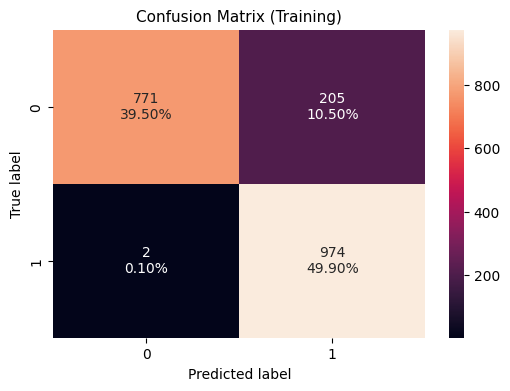

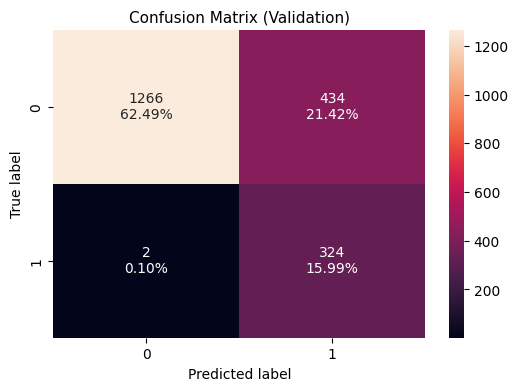

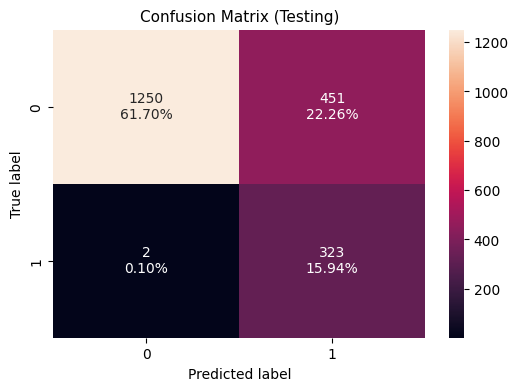

In [ ]:
# Display the confision matrix with the best parameters using undersampled training data
show_confusion_matrix_sklearn(model = model_xg, predictors = x_train_us, target = y_train_us, title = '(Training)')

# Display the confision matrix with the best parameters using validation data
show_confusion_matrix_sklearn(model = model_xg, predictors = x_val, target = y_val, title = '(Validation)')

# Display the confision matrix with the best parameters using testing data
show_confusion_matrix_sklearn(model = model_xg, predictors = x_test, target = y_test, title = '(Testing)')

**Observations:**
* Building the XGB model using the best combination of hyperparameters shows very high recall scores in all data sets:
  * Training (undersampled): 99.80%
  * Validation: 99.39%
  * Testing: 99.39%


##### Visualizing the Feature Importance

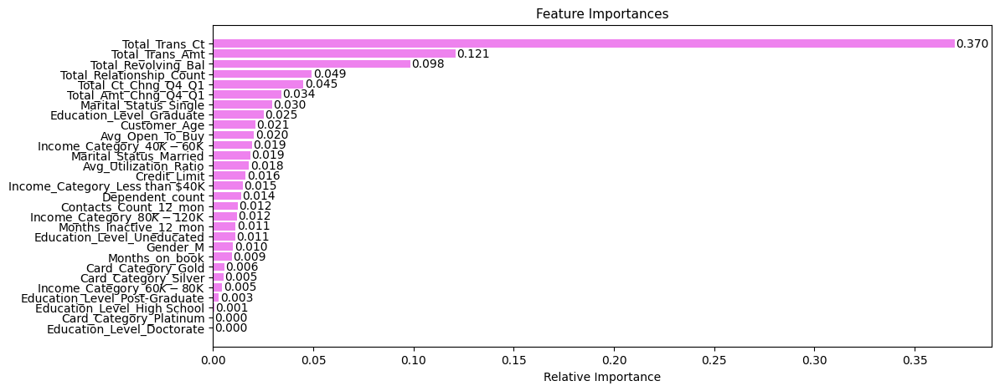

In [ ]:
# Display feature importance using model with the best parameters
show_feature_importance(importances = model_xg.feature_importances_, indices = np.argsort(model_xg.feature_importances_), feature_names = x_train_us.columns.tolist())

**Observations:**
* Using the XGB model with best combination of hyperparameters, it shows that the following are the most important features that affect customer attrition:
  * Total_Trans_Ct (0.370)
  * Total_Trans_Amt (0.121)
  * Total_Revolving_Bal (0.098)
  * Total_Relationship_Count (0.049)
  * Total_Ct_Chng_Q4_Q1 (0.045)
  * Total_Amt_Chng_Q4_Q1 (0.034)
  * Marital_Status_Single (0.030)
  * Education_Level_Graduate (0.025)
  * Customer_Age (0.021)
  * Avg_Open_To_Buy (0.020)
  * Income_Category_\$40K - \$60K (0.019)
  * Marital_Status_Married (0.019)
  * Avg_Utilization_Ratio (0.018)
  * Credit_Limit (0.016)
  * Income_Category_Less than \$40K (0.015)
  * Dependent_count (0.014)
  * Contacts_Count_12_mon (0.012)
  * Income_Category_\$80K - \$120K (0.012)
  * Months_Inactive_12_mon (0.011)
  * Education_Level_Uneducated (0.011)
  * Gender_M (0.010)
  * Months_on_book (0.009)
  * Card_Category_Gold (0.006)
  * Card_Category_Silver (0.005)
  * Income_Category_\$60K - \$80K (0.005)
  * Education_Level_Post-Graduate (0.003)
  * Education_Level_High School (0.001)

### Key Observations on Model Comparison

* The XGB model shows the highest recall scores in training, validation and testing data:
  * Training (undersampled): 99.80%
  * Validation: 99.39%
  * Testing: 99.39%
* We will choose the XGB model as the best model since it is showing the highest recall scores. The XGB model was tuned using the following hyperparameters:
  * subsample = 0.7
  * scale_pos_weight = 2
  * n_estimators = 50
  * learning_rate = 0.01
  * gamma = 0


## Business Insights and Conclusions

### Conclusions:


* The tuned XGB model provides a recall score of 99.80% for the training set and 99.39% for both validation and testing sets after using the following hyperparameters:
  * subsample = 0.7
  * scale_pos_weight = 2
  * n_estimators = 50
  * learning_rate = 0.01
  * gamma = 0
* RandomizedSearchCV provides great value in finding the best combination of hyperparameters to get the best-fit model.
* The tuned XGB model shows that it can approximately identify 99.39% if a customer going to churn/ attrit from their credit cards.
* Feature importance shows that the following are the most important features that affect customer attrition:
  * Total_Trans_Ct (0.370)
  * Total_Trans_Amt (0.121)
  * Total_Revolving_Bal (0.098)
  * Total_Relationship_Count (0.049)
  * Total_Ct_Chng_Q4_Q1 (0.045)
  * Total_Amt_Chng_Q4_Q1 (0.034)

### Recommendations:

* Increase the credit limit of frequent credit card users to encourage customers to increase their credit card spending.
* Offer more benefits to attract new credit card customers or to encourage existing customers to use their credit cards more often, for example:
  * Cash back
  * Lower or 0% APR (Annual Percentage Rate)
* Request regular feedback from customers to improve the quality of service on credit cards.
* Prioritize offering more benefits to customers that are closely falling to these conditions/ features:
  * Total_Trans_Ct: Majority of the customers who have attrited have lower total transaction count (mean value close to 44).
  * Total_Trans_Amt: Majority of the customers who have attrited have lower total transaction amount (mean value close to \$3,095).
  * Total_Revolving_Bal: Majority of the customers who have attrited have lower total revolving balance (mean value close to \$672).
  * Total_Relationship_Count: Majority of the customers who have attrited have lower total relationship count (mean value close to 3.28).
  * Total_Ct_Chng_Q4_Q1: Majority of the customers who have attrited have lower total count change (mean value close to 0.55).
  * Total_Amt_Chng_Q4_Q1: Majority of the customers who have attrited have lower total amount change (mean value close to \$0.69).
* The bank should provide more accurate data to obtain more reliable results, i.e. 10% of customer's income categories are missing in the data.

***